In [1]:
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ THE PLASTIC PATHFINDER ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [2]:
# This code is developed in Jupyter Notebook

In [3]:
# The Plastic PathFinder is a numerical code developed by Mellink et al. (2022) to simulate the transport and accumulation of
# plastic trash through terrestrial systems. The two plastic transport agents are wind and surface runoff. The transport
# of plastic trash over land occurs when the wind and/or surface runoff conditions are sufficient to overcome the wind and/or
# surface runoff thresholds, respectively. These thresholds reflect the resistance to plastic transport and are a function
# of land use and terrain slope.

# Mellink, Y., van Emmerik, T., Kooi, M., Laufkötter, C., Niemann, H. (2022). The Plastic Pathfinder: A Macroplastic 
# Transport and Fate Model for Terrestrial Environments. Manuscript submitted for publication. 

In [4]:
# Import the following libraries:

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation
from matplotlib.animation import FuncAnimation
import math
from textwrap import wrap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import random
from random import choices
from platform import python_version


In [5]:
# To see which version of Python is used:

print('This code runs on Python version', python_version())


This code runs on Python version 3.8.5


In [6]:
### Model parameters #######################################################################################################

# The ParVal array contains all values for the model parameters. Please feel free to change these values:

ParVal= np.array ( [30.00, 6.60, 26.40, 13.20, 8.80, 10.00, \
                    1, \
                    4.20, \
                    0.00, \
                    15.00, 3.00, 2.75, 2.50, 2.25, 2.00, 1.75, 1.50, 1.25,  1.00,  \
                    15.00, 7.00, 6.75, 6.50, 6.25, 6.00, 5.75, 5.50, 5.25,  5.00,  \
                    15.00, 5.00, 4.75, 4.50, 4.25, 4.00, 3.75, 3.50, 3.25,  3.00,  \
                    15.00, 2.00, 1.75, 1.50, 1.25, 1.00, 0.75, 0.50, 0.25, 0.001,  \
                    15.00, 4.00, 3.75, 3.50, 3.25, 3.00, 2.75, 2.50, 2.25,  2.00,  \
                    1.00,  0.50, 0.10, 0.30, 0.70, 0.20, \
                    526,   0.19, 0.01] ) 

# Legend of the values in the ParVal array:

### First line in ParVal array: ############################################################################################

# Wind threshold values that mobilize and transport plastic:

# Wind threshold (m/s) value for River (slope: N.A.):
W_T_R = ParVal[0]
# Wind threshold (m/s) value for Bare land (slope: 0 radians):
W_T_B = ParVal[1]
# Wind threshold (m/s) value for Forest land (slope: 0 radians):
W_T_F = ParVal[2]
# Wind threshold (m/s) value for Agricultural land (slope: 0 radians):
W_T_A = ParVal[3]
# Wind threshold (m/s) value for Urban land (slope: 0 radians):
W_T_U = ParVal[4]
# Wind threshold (m/s) value for Grass/shrubland (slope: 0 radians):
W_T_G = ParVal[5]

### Second line in ParVal array: ###########################################################################################

# If you only want the type of land use to influence the wind threshold, then set "W_T" to "1", but if you want both the 
# type of land use and the slope to influence the wind threshold, then set "W_T" to "2":
W_T = ParVal[6]

### Third line in ParVal array: ############################################################################################

# In case W_T = 2, define the change in wind threshold value per 1 radian of slope:
deltaTW = ParVal[7]    
# The wind threshold value is decreased (in case of downhill wind) or increased (in case of uphill wind) with deltaTW (m/s)
# per 1 rad terrain slope angle, e.g. if deltaTW = 4.20, the wind threshold value in a cell is lowered with 0.5 * 4.20 in 
# case the wind is downhill along a terrain slope of 0.5 rad 

### Fourth line in ParVal array: ###########################################################################################

# Surface runoff threshold (mm) value for River (slope: n/a):
R_T_R = ParVal[8]

### Fifth line in ParVal array: ############################################################################################

# Surface runoff threshold (mm) value for Bare land in case the cell is surrounded by cells that have a higher topography:
R_T_B_0 = ParVal[9]
# Surface runoff threshold (mm) value for Bare land (slope: 0-10 degrees):
R_T_B_1 = ParVal[10]
# Surface runoff threshold (mm) value for Bare land (slope: 10-20 degrees):
R_T_B_2 = ParVal[11]
# Surface runoff threshold (mm) value for Bare land (slope: 20-30 degrees):
R_T_B_3 = ParVal[12]
# Surface runoff threshold (mm) value for Bare land (slope: 30-40 degrees):
R_T_B_4 = ParVal[13]
# Surface runoff threshold (mm) value for Bare land (slope: 40-50 degrees):
R_T_B_5 = ParVal[14]
# Surface runoff threshold (mm) value for Bare land (slope: 50-60 degrees):
R_T_B_6 = ParVal[15]
# Surface runoff threshold (mm) value for Bare land (slope: 60-70 degrees):
R_T_B_7 = ParVal[16]
# Surface runoff threshold (mm) value for Bare land (slope: 70-80 degrees):
R_T_B_8 = ParVal[17]
# Surface runoff threshold (mm) value for Bare land (slope: 80-90 degrees):
R_T_B_9 = ParVal[18]

### Sixth line in ParVal array: ############################################################################################

# Surface runoff threshold (mm) value for Forest land in case the cell is surrounded by cells that have a higher topography:
R_T_F_0 = ParVal[19]
# Surface runoff threshold (mm) value for Forest land (slope: 0-10 degrees):
R_T_F_1 = ParVal[20]
# Surface runoff threshold (mm) value for Forest land (slope: 10-20 degrees):
R_T_F_2 = ParVal[21]
# Surface runoff threshold (mm) value for Forest land (slope: 20-30 degrees):
R_T_F_3 = ParVal[22]
# Surface runoff threshold (mm) value for Forest land (slope: 30-40 degrees):
R_T_F_4 = ParVal[23]
# Surface runoff threshold (mm) value for Forest land (slope: 40-50 degrees):
R_T_F_5 = ParVal[24]
# Surface runoff threshold (mm) value for Forest land (slope: 50-60 degrees):
R_T_F_6 = ParVal[25]
# Surface runoff threshold (mm) value for Forest land (slope: 60-70 degrees):
R_T_F_7 = ParVal[26]
# Surface runoff threshold (mm) value for Forest land (slope: 70-80 degrees):
R_T_F_8 = ParVal[27]
# Surface runoff threshold (mm) value for Forest land (slope: 80-90 degrees):
R_T_F_9 = ParVal[28]

### Seventh line in ParVal array: ##########################################################################################

# Surface runoff threshold (mm) value for Agricultural land in case the cell is surrounded by cells that have a higher 
# topography:
R_T_A_0 = ParVal[29]
# Surface runoff threshold (mm) value for Agricultural land (slope: 0-10 degrees):
R_T_A_1 = ParVal[30]
# Surface runoff threshold (mm) value for Agricultural land (slope: 10-20 degrees):
R_T_A_2 = ParVal[31]
# Surface runoff threshold (mm) value for Agricultural land (slope: 20-30 degrees):
R_T_A_3 = ParVal[32]
# Surface runoff threshold (mm) value for Agricultural land (slope: 30-40 degrees):
R_T_A_4 = ParVal[33]
# Surface runoff threshold (mm) value for Agricultural land (slope: 40-50 degrees):
R_T_A_5 = ParVal[34]
# Surface runoff threshold (mm) value for Agricultural land (slope: 50-60 degrees):
R_T_A_6 = ParVal[35]
# Surface runoff threshold (mm) value for Agricultural land (slope: 60-70 degrees):
R_T_A_7 = ParVal[36]
# Surface runoff threshold (mm) value for Agricultural land (slope: 70-80 degrees):
R_T_A_8 = ParVal[37]
# Surface runoff threshold (mm) value for Agricultural land (slope: 80-90 degrees):
R_T_A_9 = ParVal[38]

### Eigth line in ParVal array: ############################################################################################

# Surface runoff threshold (mm) value for Urban land in case the cell is surrounded by cells that have a higher topography:
R_T_U_0 = ParVal[39]
# Surface runoff threshold (mm) value for Urban land (slope: 0-10 degrees):
R_T_U_1 = ParVal[40]
# Surface runoff threshold (mm) value for Urban land (slope: 10-20 degrees):
R_T_U_2 = ParVal[41]
# Surface runoff threshold (mm) value for Urban land (slope: 20-30 degrees):
R_T_U_3 = ParVal[42]
# Surface runoff threshold (mm) value for Urban land (slope: 30-40 degrees):
R_T_U_4 = ParVal[43]
# Surface runoff threshold (mm) value for Urban land (slope: 40-50 degrees):
R_T_U_5 = ParVal[44]
# Surface runoff threshold (mm) value for Urban land (slope: 50-60 degrees):
R_T_U_6 = ParVal[45]
# Surface runoff threshold (mm) value for Urban land (slope: 60-70 degrees):
R_T_U_7 = ParVal[46]
# Surface runoff threshold (mm) value for Urban land (slope: 70-80 degrees):
R_T_U_8 = ParVal[47]
# Surface runoff threshold (mm) value for Urban land (slope: 80-90 degrees):
R_T_U_9 = ParVal[48]

### Nineth line in ParVal array: ###########################################################################################

# Surface runoff threshold (mm) value for Grass/shrubland in case the cell is surrounded by cells that have a higher topography:
R_T_G_0 = ParVal[49]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 0-10 degrees):
R_T_G_1 = ParVal[50]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 10-20 degrees):
R_T_G_2 = ParVal[51]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 20-30 degrees):
R_T_G_3 = ParVal[52]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 30-40 degrees):
R_T_G_4 = ParVal[53]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 40-50 degrees):
R_T_G_5 = ParVal[54]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 50-60 degrees):
R_T_G_6 = ParVal[55]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 60-70 degrees):
R_T_G_7 = ParVal[56]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 70-80 degrees):
R_T_G_8 = ParVal[57]
# Surface runoff threshold (mm) value for Grass/shrubland (slope: 80-90 degrees):
R_T_G_9 = ParVal[58]

### Tenth line in ParVal array: ############################################################################################

# Surface runoff coefficient value (= surface runoff/rainfall) for River:
RC_river = ParVal[59]
# Surface runoff coefficient value (= surface runoff/rainfall) for Bare land:
RC_bare = ParVal[60]
# Surface runoff coefficient value (= surface runoff/rainfall) for Forest land:
RC_forest = ParVal[61]
# Surface runoff coefficient value (= surface runoff/rainfall) for Agricultural land:
RC_agricul = ParVal[62]
# Surface runoff coefficient value (= surface runoff/rainfall) for Urban land:
RC_urban = ParVal[63]
# Surface runoff coefficient value (= surface runoff/rainfall) for Grass/shrubland:
RC_grass = ParVal[64]

### Eleventh line in ParVal array: #########################################################################################

# Municipal Solid Waste production in kilogram per year per capita:
MSW_capita = ParVal[65]
# Plastic Proportion, i.e. fraction of the Municipal Solid Waste that consists of plastics:
PP = ParVal[66]
# Mismanaged Waste Fraction, i.e. fraction of the Municipal Solid Waste that is inadequeatly disposed ('mismanaged'):
MWF = ParVal[67]

In [7]:
############################################################################################################################
################################################ G R I D  &  D O M A I N ###################################################
############################################################################################################################

In [8]:
### Define the boundaries of the model domain:

# Minimum latitude (western limit) in arcseconds:
Lat_min_arc = 0

# Maximum latitude (eastern limit) in arcseconds:
Lat_max_arc = 27

# Latitudinal distance between grid points (i.e. the meridional resolution) in arcseconds:
Lat_res_arc = 3


# Minimum longitude (soutern limit) in arcseconds:
Lon_min_arc = 0

# Maximum longitude (northern limit) in arcseconds:
Lon_max_arc = 27

# Longitudinal distance between grid points (i.e. the zonal resolution) in arcseconds:
Lon_res_arc = 3

In [9]:
# If you assume that the river basin lies around the equator --> 1 arcsecond = 30 meters

############################################################################################

# Minimum latitude (western limit) in meters:
Lat_min_m = Lat_min_arc * 30

# Maximum latitude (eastern limit) in meters:
Lat_max_m = Lat_max_arc * 30

# Latitudinal distance between grid points in meters:
Lat_res_m = Lat_res_arc * 30


# Minimum longitude (soutern limit) in meters:
Lon_min_m = Lon_min_arc * 30

# Maximum longitude (northern limit) in meters:
Lon_min_m = Lon_max_arc * 30

# Longitudinal distance between grid points in meters:
Lon_res_m = Lon_res_arc * 30


# Distance between diagonal grid points in arcseconds:
d_arc = np.sqrt((Lat_res_arc)**2 + (Lon_res_arc)**2)

# Distance between diagonal grid points in meters:
d_m = d_arc * 30

In [10]:
# Create 1D arrays to store the latitude (lat) and longitude (lon) coordinates (in arcseconds) of the gridpoints, 
# which are located in the center of the gridcells:
lat_arc = np.arange(Lat_min_arc,(Lat_max_arc+1),Lat_res_arc)
lon_arc = np.arange(Lon_min_arc,(Lon_max_arc+1),Lon_res_arc)

# Number of rows in the grid:
n_row = len(lat_arc)
n_col = len(lon_arc)

# Latitude (y) and longitude (x) coordinates (in arcseconds) of the lines that are the "borders" of the gridcells:
A = lat_arc[0] - Lat_res_arc/2
B = lat_arc[n_row-1] + Lat_res_arc
C = lon_arc[0] - Lon_res_arc/2
D = lon_arc[n_col-1] + Lon_res_arc

y = np.arange(A, B, Lat_res_arc)
x = np.arange(C, D, Lon_res_arc)


print('lat_arc:')
print(lat_arc)
print('')
print('lon_arc:')
print(lon_arc)
print('')
print('Number of rows in the grid:      n_row =', n_row)
print('Number of columns in the grid:   n_col =', n_col)
print('')
print('x:')
print(x)
print('')
print('y:')
print(y)

lat_arc:
[ 0  3  6  9 12 15 18 21 24 27]

lon_arc:
[ 0  3  6  9 12 15 18 21 24 27]

Number of rows in the grid:      n_row = 10
Number of columns in the grid:   n_col = 10

x:
[-1.5  1.5  4.5  7.5 10.5 13.5 16.5 19.5 22.5 25.5 28.5]

y:
[-1.5  1.5  4.5  7.5 10.5 13.5 16.5 19.5 22.5 25.5 28.5]


In [11]:
# The figures and movies computed in this code are visualised using the matplotlib library

%matplotlib notebook

<IPython.core.display.Javascript object>


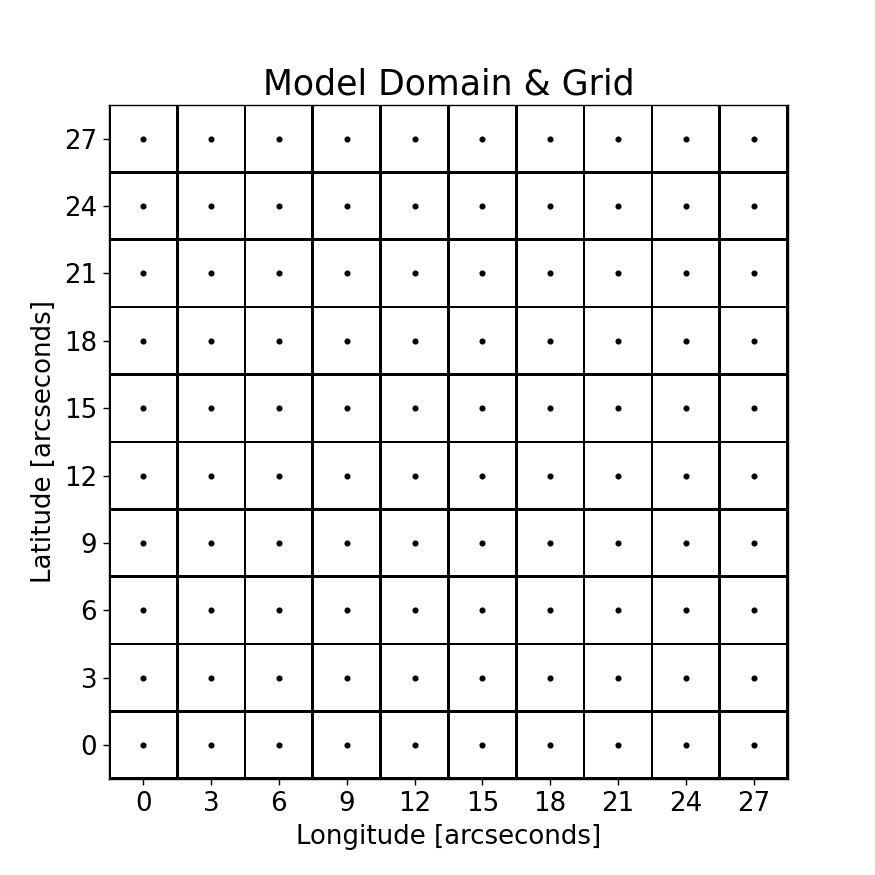

In [12]:
# Make a plot showing the domain, the grid cells and the grid points:

# Create a new figure:
plt.figure(figsize=[7,7])

# Title for the plot:
plt.title("Model Domain & Grid", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Create an array with zero's in order to plot a white back ground color for the grid cells:
G = np.zeros((n_row,n_col))

# Plot the grid cells with a white background:
c = plt.pcolormesh(x, y, G, edgecolors='black', linewidths=1, cmap = 'Greys')

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [13]:
############################################################################################################################
##################################################### T I M E  F R A M E ###################################################
############################################################################################################################

In [14]:
### Define the time frame:

# Duration of a single model run:
Time_span = 365   # in days

# Temporal resolution:
Time_res  = 1     # in days

# Numer of time steps:
Time_range = int(Time_span/Time_res)

# Create an array to store the time steps in:
Time = np.arange(0,Time_span,Time_res)

print('Time steps:')
print(Time)
print(' ')
print('Time range, i.e. number of time steps:')
print(Time_range)

Time steps:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 24

In [15]:
############################################################################################################################
####################################################### L A N D  U S E #####################################################
############################################################################################################################

In [16]:
# The land use map indicates for each grid cell in the domain the type of land use

# This model distuingishes between river and 5 types of land use, with the following id's:

# River               = 0
# Bare land           = 100
# Forest              = 200
# Agricultural land   = 300
# Urban               = 400
# Grass/shrubland     = 500

#---------------------------------------------------------------------------------------------------------------------------

# Here we manually create the land use map:

# The LU_0 array is made by hand and is meant as a (geographical) map overlay (i.e. I want in the upper left corner of 
# the map a land use of 200 - forest):

LU_0 = np.array([[200, 300, 300, 300, 0, 0, 200, 400, 400, 300],\
                 [  0, 300, 400, 400, 0, 0, 200, 400, 400,   0],\
                 [  0, 300, 400, 400, 0, 0, 200, 200,   0,   0],\
                 [  0,   0, 500, 500, 0, 0, 200,   0,   0, 500],\
                 [500,   0,   0, 500, 0, 0,   0,   0, 500, 500],\
                 [500,   0,   0, 500, 0, 0,   0, 500, 500, 500],\
                 [400, 400,   0,   0, 0, 0, 300, 300, 300, 300],\
                 [400, 400, 200,   0, 0, 0, 300, 400, 400, 400],\
                 [300, 300, 200, 200, 0, 0, 300, 400, 400, 400],\
                 [100, 100, 100, 100, 0, 0, 100, 100, 100, 100]])

# The origin of my geographical map is in the lower left corner, while the origin of a numpy array is the upper left corner
# (i.e. i=0, j=0). Therefore in order to get the map as I want it, the LU_0 array must be flipped over the 0 axis. In this 
# way the LU array is created and later on when the LU array is plotted, it plots it in the correct way, such that the LU_0
# array is a (geographical) map overlay. See also User's Manual for detailed explaination.

LU = np.flip(LU_0, axis=0)

print('LU:')
print(LU)


LU:
[[100 100 100 100   0   0 100 100 100 100]
 [300 300 200 200   0   0 300 400 400 400]
 [400 400 200   0   0   0 300 400 400 400]
 [400 400   0   0   0   0 300 300 300 300]
 [500   0   0 500   0   0   0 500 500 500]
 [500   0   0 500   0   0   0   0 500 500]
 [  0   0 500 500   0   0 200   0   0 500]
 [  0 300 400 400   0   0 200 200   0   0]
 [  0 300 400 400   0   0 200 400 400   0]
 [200 300 300 300   0   0 200 400 400 300]]


In [17]:
# If you don't want to make the land use map by hand. You can of course use a real land cover data set. In that case 
# upload the land use data file and make sure you use the land use id's (see above) and store these in a 2D array called LU

<IPython.core.display.Javascript object>


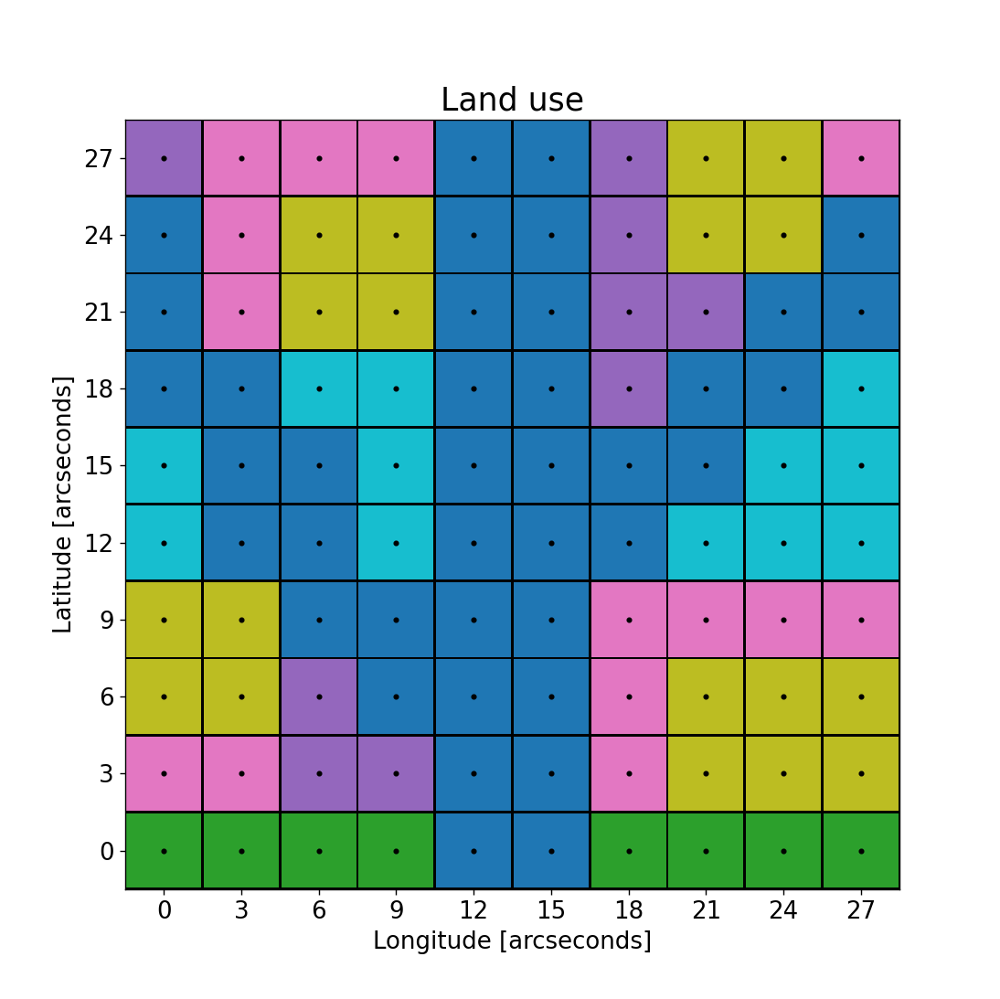

In [18]:
# Make a plot showing the land use map:

# Create a new figure:
plt.figure(figsize=[7,7])

# Title for the plot:
plt.title("Land use", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the land use id's:
c = plt.pcolormesh(x, y, LU, edgecolors='black', linewidths=1, cmap = 'tab10')

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [19]:
############################################################################################################################
################################################### P O P U L A T I O N ####################################################
############################################################################################################################

In [20]:
# The population map indicates for each grid cell in the domain the number of inhabitants

# Cities:                        we chose population densities of 40 to 50 people per grid cell
# Villages:                      we chose population densities of 10 tp 30 people per grid cell
# Argicultural lands:            we chose population densities of 0 to 4 farmers per grid cell
# Forest:                        we chose population densities of 0.1 people per grid cell to mimic littering as caused 
#                                by recreational activities
# Bare land & Grass/shrubland:   we chose population densities of 0 people per grid cell

#---------------------------------------------------------------------------------------------------------------------------

# Here we manually create the population map:

# The Y_0 is made by hand and is meant as a (geographical) map overlay (i.e. I want in the upper left corner of the map
# a population of 0.10):

Y_0 = np.array([ [0.10,    4,    0,    2,    0,    0, 0.10,   10,    10,    0],\
                 [   0,    0,   20,   20,    0,    0, 0.10,   10,    10,    0],\
                 [   0,    0,   20,   20,    0,    0, 0.10, 0.10,     0,    0],\
                 [   0,    0,    0,    0,    0,    0, 0.10,    0,     0,    0],\
                 [   0,    0,    0,    0,    0,    0,    0,    0,     0,    0],\
                 [   0,    0,    0,    0,    0,    0,    0,    0,     0,    0],\
                 [  30,   30,    0,    0,    0,    0,    0,    0,     4,    0],\
                 [  30,   30, 0.10,    0,    0,    0,    0,   40,    40,   40],\
                 [   2,    0, 0.10, 0.10,    0,    0,    4,   40,    50,   50],\
                 [   0,    0,    0,    0,    0,    0,    0,    0,     0,    0]])

# The origin of my geographical map is in the lower left corner, while the origin of a numpy array is the upper left corner
# (i.e. i=0, j=0). Therefore in order to get the map as I want it, the Y_0 array must be flipped over the 0 axis. In this 
# way the Y array is created and later on when the Y array is plotted, it plots it in the correct way, such that the Y_0
# array is a (geographical) map overlay. See also User's Manual for detailed explaination.

Y = np.flip(Y_0, axis=0)

print('Y:')
print(Y)


Y:
[[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0. ]
 [ 2.   0.   0.1  0.1  0.   0.   4.  40.  50.  50. ]
 [30.  30.   0.1  0.   0.   0.   0.  40.  40.  40. ]
 [30.  30.   0.   0.   0.   0.   0.   0.   4.   0. ]
 [ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0. ]
 [ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0. ]
 [ 0.   0.   0.   0.   0.   0.   0.1  0.   0.   0. ]
 [ 0.   0.  20.  20.   0.   0.   0.1  0.1  0.   0. ]
 [ 0.   0.  20.  20.   0.   0.   0.1 10.  10.   0. ]
 [ 0.1  4.   0.   2.   0.   0.   0.1 10.  10.   0. ]]


In [21]:
# If you don't want to make the population map by hand. You can of course use a population density data set. In that case 
# upload the popolation data file and make sure the values indicate the number of inhabitants for each grid cell in the 
# model domain and store these values in a 2D array called Y

<IPython.core.display.Javascript object>


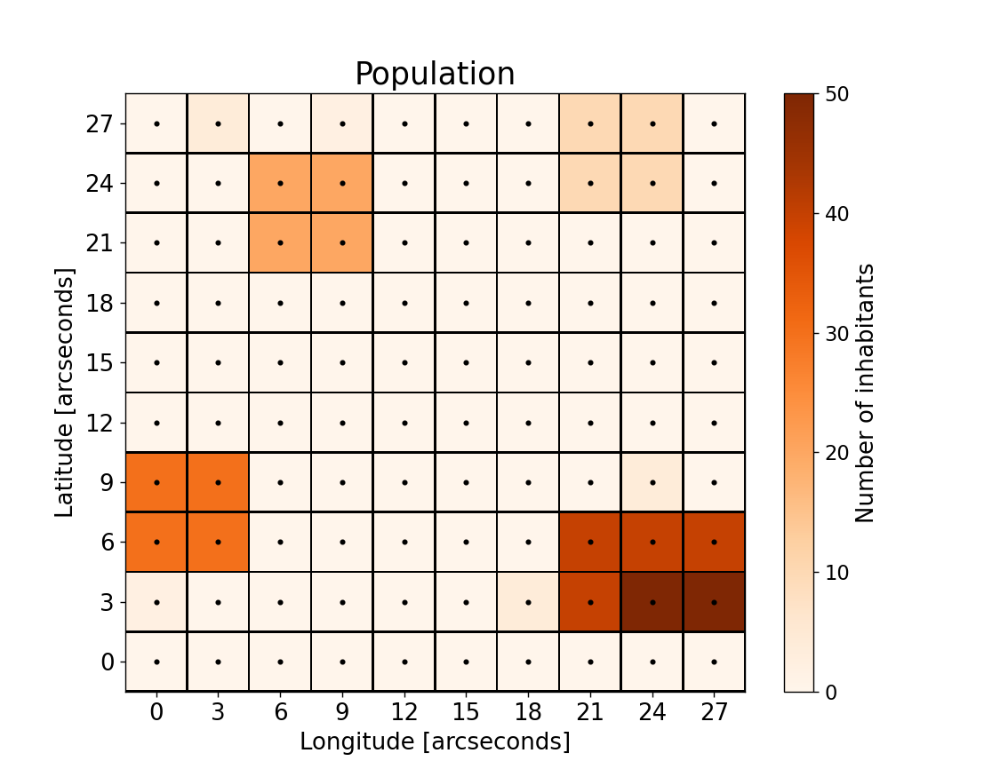

In [22]:
# Make a plot showing the population map:

# Create a new figure:
plt.figure(figsize=[9,7])

# Title for the plot:
plt.title("Population", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the number of inhabitants:
c = plt.pcolormesh(x, y, Y, edgecolors='black', linewidths=1, cmap = 'Oranges')

# Add a color scale bar:
cbar = plt.colorbar()

# Assign labels to the color scale bar:
cbar.set_label('Number of inhabitants', size = 15)
cbar.ax.tick_params(labelsize = 13)

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [23]:
############################################################################################################################
################################### T O P O G R A P H Y  &  T E R R A I N  S L O P E S #####################################
############################################################################################################################

In [24]:
# The topography map indicates for each grid cell in the domain the heigth above sea level in meters

#---------------------------------------------------------------------------------------------------------------------------

# Here we manually create the topography map:

# The Z_0 is made by hand and is meant as a (geographical) map overlay (i.e. I want in the upper right corner of the map
# a topography of 15 meters above sea level):

Z_0 = np.array([[10  , 9.1 , 7.3 , 3.1 , 0 , 0 , 4.6 , 5.5 , 5.0  ,  15],\
                [0   , 7.8 , 5.2 , 2.4 , 0 , 0 , 3.8 , 4.7 , 5.1 ,   0],\
                [0   , 6.9 , 4.6 , 2.1 , 0 , 0 , 2.5 , 3.0 , 0   ,   0],\
                [0   , 0   , 4.3 , 2.2 , 0 , 0 , 1.6 , 0   , 0   ,  10],\
                [6.2 , 0   , 0   , 1.3 , 0 , 0 , 0   , 0   , 7.4 , 8.6],\
                [6.1 , 0   , 0   , 1.1 , 0 , 0 , 0   , 2.8 , 5.1 , 8.3],\
                [4.9 , 4.6 , 0   , 0   , 0 , 0 , 1.9 , 2.3 , 5.0 , 8.1],\
                [4.0 , 3.2 , 2.1 , 0   , 0 , 0 , 1.9 , 5.1 , 5.1 , 5.2],\
                [4.5 , 3.3 , 2.4 , 1.2 , 0 , 0 , 1.7 , 5.3 , 5.3 , 5.3],\
                [1.0 , 0.9 , 0.8 , 0.5 , 0 , 0 , 0.4 , 0.7 , 1.0 , 1.1]])

# The origin of my geographical map is in the lower left corner, while the origin of a numpy array is the upper left corner
# (i.e. i=0, j=0). Therefore in order to get the map as I want it, the Z_0 array must be flipped over the 0 axis. In this 
# way the Z array is created and later on when the Z array is plotted, it plots it in the correct way, such that the Z_0
# array is a (geographical) map overlay. See also User's Manual for detailed explaination.

Z = np.flip(Z_0, axis=0)

print('Z:')
print(Z)


Z:
[[ 1.   0.9  0.8  0.5  0.   0.   0.4  0.7  1.   1.1]
 [ 4.5  3.3  2.4  1.2  0.   0.   1.7  5.3  5.3  5.3]
 [ 4.   3.2  2.1  0.   0.   0.   1.9  5.1  5.1  5.2]
 [ 4.9  4.6  0.   0.   0.   0.   1.9  2.3  5.   8.1]
 [ 6.1  0.   0.   1.1  0.   0.   0.   2.8  5.1  8.3]
 [ 6.2  0.   0.   1.3  0.   0.   0.   0.   7.4  8.6]
 [ 0.   0.   4.3  2.2  0.   0.   1.6  0.   0.  10. ]
 [ 0.   6.9  4.6  2.1  0.   0.   2.5  3.   0.   0. ]
 [ 0.   7.8  5.2  2.4  0.   0.   3.8  4.7  5.1  0. ]
 [10.   9.1  7.3  3.1  0.   0.   4.6  5.5  5.  15. ]]


In [25]:
# If you don't want to make the topography map by hand. You can of course use a topography data set. In that case upload 
# the topography data file and make sure the values indicate the (average) height above sea level (m) for the grid cells 
# in the model domain and store these values in a 2D array called Z

<IPython.core.display.Javascript object>


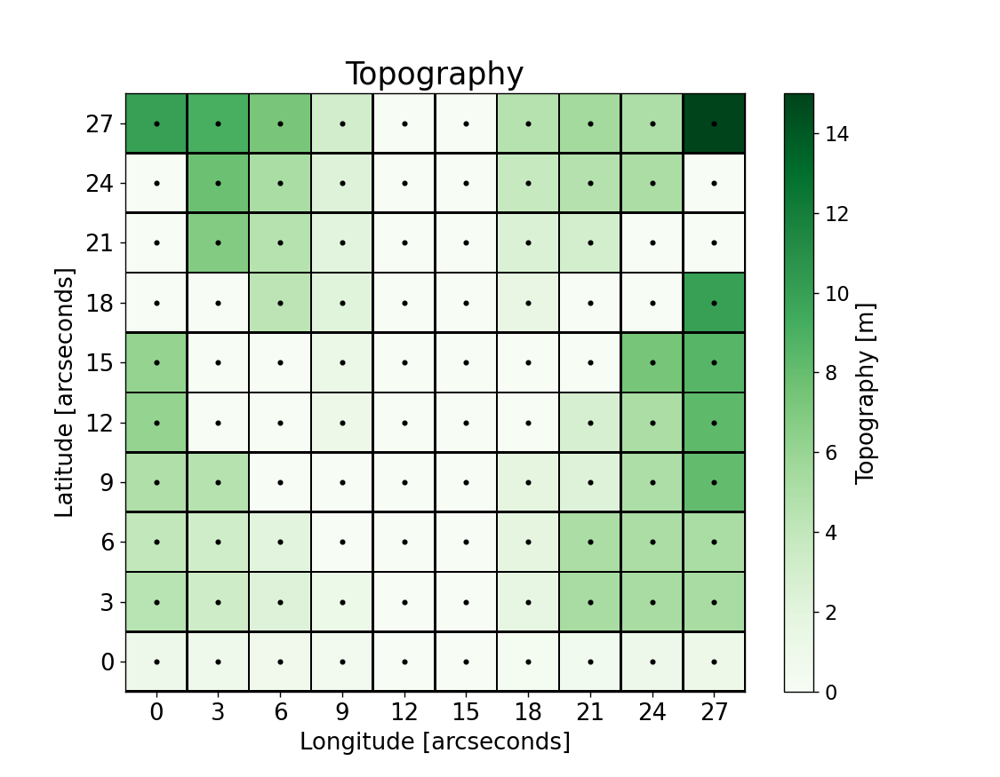

In [26]:
# Make a plot showing the topography map:

# Create a new figure:
plt.figure(figsize=[9,7])

# Title for the plot:
plt.title("Topography", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the topography values:
c = plt.pcolormesh(x, y, Z, edgecolors='black', linewidths=1, cmap = 'Greens')

# Add a color scale bar:
cbar = plt.colorbar()

# Assign labels to the color scale bar:
cbar.set_label('Topography [m]', size = 15)
cbar.ax.tick_params(labelsize = 13)

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [27]:
# Calculate the steepest terrain slope values and directions for each grid cell in the domain:

# The slope in a certain direction is referred to as the 'distance weight drop' (dwd) in that direction

# Labels for the direction (q) of the steepest slope for a grid cell 'x':

# 1000    slope runs downhill towards the northwest
# 1001    slope runs downhill towards the north
# 1002    slope runs downhill towards the northeast
# 1003    slope runs downhill towards the east
# 1004    slope runs downhill towards the southeast
# 1005    slope runs downhill towards the south
# 1006    slope runs downhill towards the southwest
# 1007    slope runs downhill towards the west

#   |--------|--------|--------|
#   |        |        |        |
#   |  1000  |  1001  |  1002  |
#   |        |        |        |
#   |--------|--------|--------|
#   |        |        |        |
#   |  1007  |   x    |  1003  |
#   |        |        |        |
#   |--------|--------|--------|
#   |        |        |        |
#   |  1006  |  1005  |  1004  |
#   |        |        |        |
#   |--------|--------|--------|

# See also User's Manual for detailed explaination.


Q = np.empty((n_row, n_col))
q = np.empty((n_row, n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        # Cell in the lower left corner of the domain:
        if (i == 0 and j == 0):    
            dwd = np.zeros(3)
            # Topography gradient when moving towards the cell to the north:
            dwd[0] = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
            # Topography gradient when moving towards the cell to the north-east:
            dwd[1] = (Z[i+1,j+1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the east:
            dwd[2] = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
            Q[i,j] = np.min(dwd)
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1001  
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1002   
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1003
            # print('i =', i, 'j =', j, 'dwd =', dwd)
            
        # Cell in the upper left corner of the domain:        
        if (i == (n_row-1) and j == 0):    
            dwd = np.zeros(3)
            # Topography gradient when moving towards the cell to the east:
            dwd[0] = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
            # Topography gradient when moving towards the cell to the south-east:
            dwd[1] = (Z[i-1,j+1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the south:
            dwd[2] = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
            Q[i,j] = np.min(dwd)
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1003 
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1004
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1005
            # print('i =', i, 'j =', j, 'dwd =', dwd)
            
        # Cell in the upper right corner of the domain:
        if (i == (n_row-1) and j == (n_col-1)):    
            dwd = np.zeros(3)
            # Topography gradient when moving towards the cell to the south:
            dwd[0] = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
            # Topography gradient when moving towards the cell to the south-west:
            dwd[1] = (Z[i-1,j]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the west:
            dwd[2] = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
            Q[i,j] = np.min(dwd)
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1005 
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1006
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1007
            # print('i =', i, 'j =', j, 'dwd =', dwd)
            
        # Cell in the lower right corner of the domain:
        if (i == 0 and j == (n_col-1)):    
            dwd = np.zeros(3)
            # Topography gradient when moving towards the cell to the west:
            dwd[0] = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
            # Topography gradient when moving towards the cell to the north-west:
            dwd[1] = (Z[i+1,j-1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the north:
            dwd[2] = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
            Q[i,j] = np.min(dwd)
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1007 
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1000
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1001
            # print('i =', i, 'j =', j, 'dwd =', dwd)
            
        # Cells along the western boundary of the domain:
        if (i != 0 and i != (n_row-1) and j == 0):    
            dwd = np.zeros(5)
            # Topography gradient when moving towards the cell to the north:
            dwd[0] = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
            # Topography gradient when moving towards the cell to the north-east:
            dwd[1] = (Z[i+1,j+1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the east:
            dwd[2] = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
            # Topography gradient when moving towards the cell to the south-east:
            dwd[3] = (Z[i-1,j+1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the south:
            dwd[4] = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
            Q[i,j] = np.min(dwd)
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1001  
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1002   
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1003
            if (dwd[3] == np.min(dwd)):
                q[i,j] = 1004
            if (dwd[4] == np.min(dwd)):
                q[i,j] = 1005
            # print('i =', i, 'j =', j, 'dwd =', dwd)
            
        # Cells along the northern boundary of the domain:
        if (i == (n_row-1) and j != 0 and j != (n_col-1)):    
            dwd = np.zeros(5)
            # Topography gradient when moving towards the cell to the east:
            dwd[0] = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
            # Topography gradient when moving towards the cell to the south-east:
            dwd[1] = (Z[i-1,j+1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the south:
            dwd[2] = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
            # Topography gradient when moving towards the cell to the south-west:
            dwd[3] = (Z[i-1,j]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the west:
            dwd[4] = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
            Q[i,j] = np.min(dwd)
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1003  
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1004   
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1005
            if (dwd[3] == np.min(dwd)):
                q[i,j] = 1006
            if (dwd[4] == np.min(dwd)):
                q[i,j] = 1007
            # print('i =', i, 'j =', j, 'dwd =', dwd)
            
        # Cells along the eastern boundary of the domain:
        if (i != 0 and i != (n_row-1) and j == (n_col-1)):    
            dwd = np.zeros(5)
            # Topography gradient when moving towards the cell to the south:
            dwd[0] = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
            # Topography gradient when moving towards the cell to the south-west:
            dwd[1] = (Z[i-1,j]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the west:
            dwd[2] = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
            # Topography gradient when moving towards the cell to the north-west:
            dwd[3] = (Z[i+1,j-1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the north:
            dwd[4] = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
            Q[i,j] = np.min(dwd)
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1005  
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1006   
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1007
            if (dwd[3] == np.min(dwd)):
                q[i,j] = 1000
            if (dwd[4] == np.min(dwd)):
                q[i,j] = 1001
            # print('i =', i, 'j =', j, 'dwd =', dwd)
            
        # Cells along the southern boundary of the domain:
        if (i == 0 and j != 0 and j != (n_col-1)):    
            dwd = np.zeros(5)
            # Topography gradient when moving towards the cell to the west:
            dwd[0] = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
            # Topography gradient when moving towards the cell to the north-west:
            dwd[1] = (Z[i+1,j-1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the north:
            dwd[2] = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
            # Topography gradient when moving towards the cell to the north-east:
            dwd[3] = (Z[i+1,j+1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the east:
            dwd[4] = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
            Q[i,j] = np.min(dwd)
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1007  
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1000   
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1001
            if (dwd[3] == np.min(dwd)):
                q[i,j] = 1002
            if (dwd[4] == np.min(dwd)):
                q[i,j] = 1003
            # print('i =', i, 'j =', j, 'dwd =', dwd)
            
        # Cells in the interior of the domain:
        if (i != 0 and i != (n_row-1) and j != 0 and j != (n_col-1)):
            dwd = np.zeros(8)
            
            # Topography gradient when moving towards the cell to the north-west:
            dwd[0] = (Z[i+1,j-1]-Z[i,j])/(d_m) 
            # Topography gradient when moving towards the cell to the north: 
            dwd[1] = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
            # Topography gradient when moving towards the cell to the north-east:
            dwd[2] = (Z[i+1,j+1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the east:
            dwd[3] = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
            # Topography gradient when moving towards the cell to the south-east:
            dwd[4] = (Z[i-1,j+1]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the south:
            dwd[5] = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
            # Topography gradient when moving towards the cell to the south-west:
            dwd[6] = (Z[i-1,j]-Z[i,j])/(d_m)
            # Topography gradient when moving towards the cell to the west:
            dwd[7] = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
            
            Q[i,j] = np.min(dwd)
            
            if (dwd[0] == np.min(dwd)):
                q[i,j] = 1000  
            if (dwd[1] == np.min(dwd)):
                q[i,j] = 1001   
            if (dwd[2] == np.min(dwd)):
                q[i,j] = 1002
            if (dwd[3] == np.min(dwd)):
                q[i,j] = 1003
            if (dwd[4] == np.min(dwd)):
                q[i,j] = 1004
            if (dwd[5] == np.min(dwd)):
                q[i,j] = 1005
            if (dwd[6] == np.min(dwd)):
                q[i,j] = 1006
            if (dwd[7] == np.min(dwd)):
                q[i,j] = 1007
            # print('i =', i, 'j =', j, 'dwd =', dwd)

Q = np.round(Q,decimals=3)
            
q_0 = np.flip(q, axis=0)
Q_0 = np.flip(Q, axis=0)


print('q:')
print(q)
print('')
print('Q:')
print(Q)
print('')
print('Note! A postive Q value means that all neighbouring cells have a higher topography than this cell.')
print('In that case the Q gives the value of the shallowest UPHILL slope and the corresponding q gives the direction \
of that slope.')


q:
[[1003. 1003. 1003. 1003. 1003. 1001. 1007. 1007. 1007. 1007.]
 [1005. 1005. 1002. 1003. 1006. 1007. 1007. 1005. 1005. 1005.]
 [1003. 1002. 1003. 1004. 1007. 1007. 1007. 1007. 1000. 1000.]
 [1002. 1003. 1004. 1007. 1007. 1007. 1007. 1000. 1007. 1007.]
 [1003. 1004. 1007. 1007. 1006. 1007. 1007. 1007. 1000. 1007.]
 [1003. 1006. 1007. 1007. 1006. 1007. 1007. 1007. 1007. 1000.]
 [1004. 1007. 1007. 1003. 1006. 1007. 1007. 1006. 1007. 1001.]
 [1005. 1007. 1003. 1003. 1006. 1007. 1007. 1005. 1006. 1001.]
 [1005. 1007. 1003. 1003. 1006. 1007. 1007. 1004. 1005. 1006.]
 [1005. 1004. 1003. 1003. 1006. 1007. 1007. 1007. 1004. 1005.]]

Q:
[[-0.001 -0.001 -0.003 -0.006  0.     0.    -0.004 -0.003 -0.003 -0.001]
 [-0.039 -0.027 -0.019 -0.013  0.     0.    -0.019 -0.051 -0.048 -0.047]
 [-0.009 -0.025 -0.023  0.     0.     0.    -0.021 -0.036 -0.022 -0.002]
 [-0.038 -0.051  0.     0.     0.     0.    -0.021 -0.018 -0.03  -0.034]
 [-0.068  0.     0.    -0.012  0.     0.     0.    -0.031 -0.04  -0.03

In [28]:
# Make vector a field for the steepest terrain slope directions, in which U contains the zonal components of the vectors 
# and V the meridional:

U = np.empty((n_row,n_col))
V = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if(LU[i,j] == 0):        # In river grid cells the surface runoff is set to 0. 
            U[i,j] = 0
            V[i,j] = 0
        
        else:
        
            if (q[i,j] == 1000):
                U[i,j] = -1
                V[i,j] = 1
            if (q[i,j] == 1001):
                U[i,j] = 0
                V[i,j] = 1
            if (q[i,j] == 1002):
                U[i,j] = 1
                V[i,j] = 1
            if (q[i,j] == 1003):
                U[i,j] = 1
                V[i,j] = 0
            if (q[i,j] == 1004):
                U[i,j] = 1
                V[i,j] = -1
            if (q[i,j] == 1005):
                U[i,j] = 0
                V[i,j] = -1
            if (q[i,j] == 1006):
                U[i,j] = -1
                V[i,j] = -1
            if (q[i,j] == 1007):
                U[i,j] = -1
                V[i,j] = 0


<IPython.core.display.Javascript object>


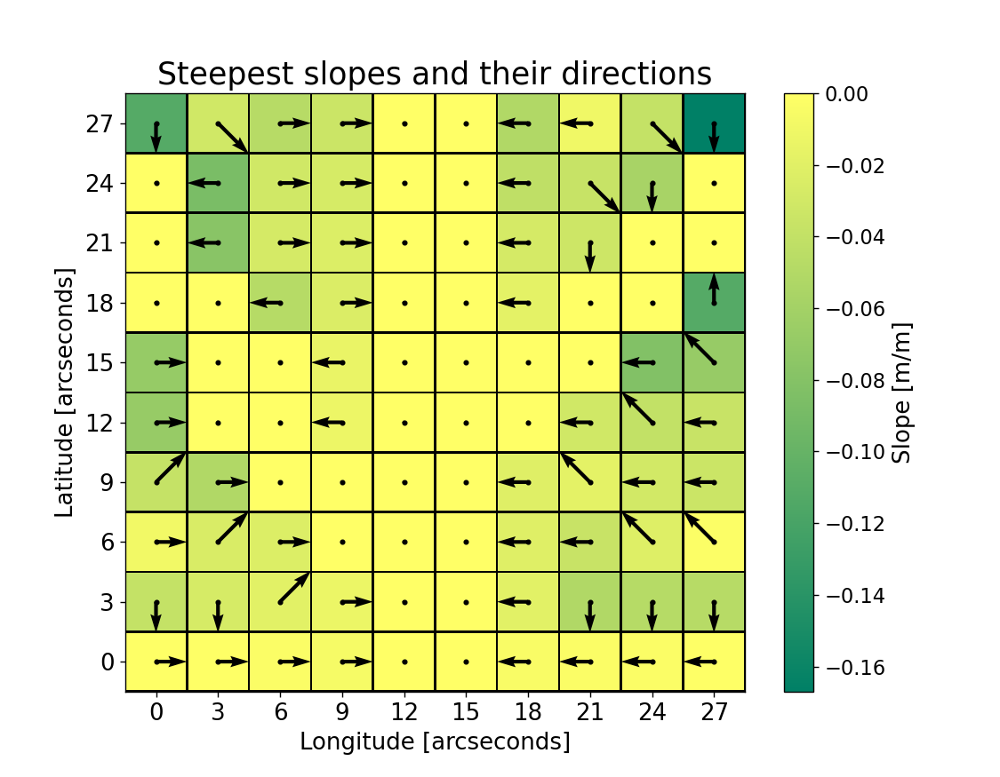

In [29]:
# Make a plot showing the magnitude and directions of the steepest (downhill) terrain slopes: 

# Create a new figure:
plt.figure(figsize=[9,7])

# Title for the plot:
plt.title("Steepest slopes and their directions", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the steepest (downhill) terrain slope magnitudes:
c = plt.pcolormesh(x, y, Q, edgecolors='black', linewidths=1, cmap = 'summer')

# Add a color scale bar:
cbar = plt.colorbar()

# Assign labels to the color scale bar:
cbar.set_label('Slope [m/m]', size = 15)
cbar.ax.tick_params(labelsize = 13)

# Plot vectors that correspond to the steepest (downhill) slope directions:
plt.quiver(xx,yy, U, V, color = 'black', pivot='tail', scale = 20)

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [30]:
############################################################################################################################
################################################### W I N D ################################################################
############################################################################################################################

In [31]:
# Here we use data on wind speeds recorded by the Royal Netherlands Meteorological Institute (KNMI):

# We use hourly averaged wind speeds recorded by weather station "De Bilt" (latitude: 52.1015441 ; longitude: 5.1779992)
# in the period 1981-2000.

# Data source: http://projects.knmi.nl/klimatologie/frequentietabellen/maand.cgi


# The hourly averaged wind speeds fall in one of the following 20 wind speeds classes:

# Wind speeds class 1:    wind speeds from   0.0   to   0.4   meter/second
# Wind speeds class 2:    wind speeds from   0.5   to   1.4   meter/second
# Wind speeds class 3:    wind speeds from   1.5   to   2.4   meter/second
# Wind speeds class 4:    wind speeds from   2.5   to   3.4   meter/second
# Wind speeds class 5:    wind speeds from   3.5   to   4.4   meter/second
# Wind speeds class 6:    wind speeds from   4.5   to   5.4   meter/second
# Wind speeds class 7:    wind speeds from   5.5   to   6.4   meter/second
# Wind speeds class 8:    wind speeds from   6.5   to   7.4   meter/second
# Wind speeds class 9:    wind speeds from   7.5   to   8.4   meter/second
# Wind speeds class 10:   wind speeds from   8.5   to   9.4   meter/second
# Wind speeds class 11:   wind speeds from   9.5   to   10.4  meter/second
# Wind speeds class 12:   wind speeds from   10.5  to   11.4  meter/second
# Wind speeds class 13:   wind speeds from   11.5  to   12.4  meter/second
# Wind speeds class 14:   wind speeds from   12.5  to   13.4  meter/second
# Wind speeds class 15:   wind speeds from   13.5  to   14.4  meter/second
# Wind speeds class 16:   wind speeds from   14.5  to   15.4  meter/second
# Wind speeds class 17:   wind speeds from   15.5  to   16.4  meter/second
# Wind speeds class 18:   wind speeds from   16.5  to   17.4  meter/second
# Wind speeds class 19:   wind speeds from   17.5  to   18.4  meter/second
# Wind speeds class 20:   wind speeds from   18.5  to   19.4  meter/second

W_speed_classes = np.arange(1,21,1)

print('The W_speed_classes array:', W_speed_classes)


# The frequency with which wind speeds fall in certain wind speed classes differs from month to month

# The following 12 arrays give for each month the frequency with which the wind speed fell in the wind speed classes
# during the period 1981-2000 
# The first element in the array gives the frequency with which the hourly averaged wind speed is between 0.0 and 0.4 m/s 
# for that month 


W_speed_freq_Jan = np.array([0.0034, 0.0938, 0.1517, 0.1680, 0.1639, 0.1401, 0.1049, 0.0761, 0.0470, 0.0272, \
                             0.0142, 0.0047, 0.0032, 0.0009, 0.0005, 0.0001, 0.0001, 0.0000, 0.0002, 0.0000])
#print(W_speed_freq_Jan)

W_speed_freq_Feb = np.array([0.0032, 0.0858, 0.1578, 0.1993, 0.1700, 0.1434, 0.0916, 0.0645, 0.0428, 0.0255, \
                             0.0097, 0.0032, 0.0024, 0.0005, 0.0003, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Feb)

W_speed_freq_Mar = np.array([0.0055, 0.0995, 0.1610, 0.1960, 0.1739, 0.1284, 0.0925, 0.0690, 0.0355, 0.0190, \
                             0.0117, 0.0050, 0.0021, 0.0007, 0.0002, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Mar)

W_speed_freq_Apr = np.array([0.0026, 0.1181, 0.1900, 0.2136, 0.1878, 0.1352, 0.0815, 0.0442, 0.0187, 0.0056, \
                             0.0021, 0.0001, 0.0002, 0.0000, 0.0002, 0.0000, 0.0001, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Apr)

W_speed_freq_May = np.array([0.0043, 0.1234, 0.2076, 0.2357, 0.1957, 0.1281, 0.0608, 0.0297, 0.0110, 0.0026, \
                             0.0007, 0.0001, 0.0002, 0.0001, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_May)

W_speed_freq_Jun = np.array([0.0044, 0.1231, 0.2238, 0.2531, 0.2088, 0.1194, 0.0471, 0.0147, 0.0042, 0.0011, \
                             0.0003, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Jun)

W_speed_freq_Jul = np.array([0.0059, 0.1419, 0.2450, 0.2466, 0.1915, 0.1117, 0.0413, 0.0118, 0.0034, 0.0009, \
                             0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Jul)

W_speed_freq_Aug = np.array([0.0119, 0.1903, 0.2586, 0.2302, 0.1681, 0.0840, 0.0370, 0.0156, 0.0033, 0.0009, \
                             0.0001, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Aug)

W_speed_freq_Sep = np.array([0.0116, 0.1926, 0.2435, 0.2251, 0.1544, 0.0959, 0.0483, 0.0200, 0.0066, 0.0016, \
                             0.0004, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Sep)

W_speed_freq_Oct = np.array([0.0066, 0.1428, 0.2118, 0.2122, 0.1749, 0.1139, 0.0644, 0.0388, 0.0214, 0.0068, \
                             0.0042, 0.0013, 0.0007, 0.0002, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Oct)

W_speed_freq_Nov = np.array([0.0041, 0.1185, 0.2070, 0.1988, 0.1688, 0.1318, 0.0874, 0.0494, 0.0235, 0.0061, \
                             0.0024, 0.0010, 0.0006, 0.0001, 0.0001, 0.0001, 0.0001, 0.0002, 0.0000, 0.0000])
#print(W_speed_freq_Nov)

W_speed_freq_Dec = np.array([0.0040, 0.1040, 0.1774, 0.1873, 0.1600, 0.1350, 0.0976, 0.0630, 0.0357, 0.0178, \
                             0.0101, 0.0048, 0.0024, 0.0007, 0.0001, 0.0001, 0.0000, 0.0000, 0.0000, 0.0000])
#print(W_speed_freq_Dec)


The W_speed_classes array: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]


In [32]:
# Here the code randomly picks a wind speed value for each time step, whereby it takes the monthly wind speed frequencies
# into account:

w_speed_value = np.empty(Time_range)

for t in Time:
    
    if (t >= 0 and t <= 30):
        
        #print('t = ', t)
        #print('It is January!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Jan)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 31 and t <= 58): # not a leap year!
        
        #print('t = ', t)
        #print('It is February!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Feb)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 59 and t <= 89):
        
        #print('t = ', t)
        #print('It is March!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Mar)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 90 and t <= 119):
        
        #print('t = ', t)
        #print('It is April!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Apr)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 120 and t <= 150):
        
        #print('t = ', t)
        #print('It is May!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_May)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 151 and t <= 180):
        
        #print('t = ', t)
        #print('It is June!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Jun)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 181 and t <= 211):
        
        #print('t = ', t)
        #print('It is July!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Jul)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 212 and t <= 242):
        
        #print('t = ', t)
        #print('It is August!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Aug)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 243 and t <= 272):
        
        #print('t = ', t)
        #print('It is September!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Sep)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 273 and t <= 303):
        
        #print('t = ', t)
        #print('It is October!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Oct)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 304 and t <= 333):
        
        #print('t = ', t)
        #print('It is November!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Nov)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    if (t >= 334 and t <= 364):
        
        #print('t = ', t)
        #print('It is December!')
        
        w_speed_class = np.random.choice(W_speed_classes, p = W_speed_freq_Dec)
        
        #print('For t =', t, 'the randomly picked wind speed class is:', w_speed_class)
    
    #-----------------------------------------------------------------------------------------------------------------------
    
    if (w_speed_class == 1):
        
        a = np.random.randint(low = 1, high = 6)
        #print('a =', a)
        
        w_speed_value[t] = 0.0 + ( (0.4-0.0)*(a-1) / (5-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 2):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 0.5 + ( (1.4-0.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 3):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 1.5 + ( (2.4-1.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 4):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 2.5 + ( (3.4-2.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 5):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 3.5 + ( (4.4-3.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 6):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 4.5 + ( (5.4-4.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 7):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 5.5 + ( (6.4-5.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 8):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 6.5 + ( (7.4-6.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 9):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 7.5 + ( (8.4-7.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 10):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 8.5 + ( (9.4-8.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 11):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 9.5 + ( (10.4-9.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 12):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 10.5 + ( (11.4-10.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 13):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 11.5 + ( (12.4-11.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 14):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 12.5 + ( (13.4-12.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 15):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 13.5 + ( (14.4-13.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 16):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 14.5 + ( (15.4-14.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 17):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 15.5 + ( (16.4-15.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 18):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 16.5 + ( (17.4-16.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 19):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 17.5 + ( (18.4-17.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
        
    if (w_speed_class == 20):
        
        a = np.random.randint(low = 1, high = 11)
        #print('a =', a)
        
        w_speed_value[t] = 18.5 + ( (19.4-18.5)*(a-1) / (10-1) )
        w_speed_value[t] = np.round(w_speed_value[t], 1)
            
        #print('Then a random wind speed was chosen between the limits of this wind speed class (w_speed_value =)', \
              #w_speed_value[t])
      
    #-----------------------------------------------------------------------------------------------------------------------

print('w_speed_value:')
print(w_speed_value)
    

w_speed_value:
[ 2.1  6.9  7.   7.2  4.2  4.2  3.5 10.4  1.8  5.3  4.9  2.   4.   3.4
  2.3  1.1  6.1  2.8  3.4  5.7  2.3  2.6  2.2  7.2  6.   2.1  3.   1.8
  3.4  1.5  1.2  4.5  5.2  3.3  4.5  3.1  1.1  3.1 14.1  7.5  0.6  6.7
  0.6  1.5  5.1  1.5  6.7  6.6  0.8  3.4  6.   7.2  6.9  2.1  6.6  4.7
  5.6  5.6  1.4  4.   6.   2.6  1.8  4.4  2.6  1.9  3.5  1.6  3.   6.4
  2.9  4.7  2.3  2.2  4.3  7.2  5.8  3.8  3.4  1.   6.   4.4  5.4  3.3
  2.   1.4  3.2  3.6  3.4  1.4  3.5  4.4  6.8  1.4  1.5  6.   3.3  1.8
  3.4  2.9  1.9  2.3  3.8  3.   8.   4.3  2.7  2.2  1.1  1.9  5.2  5.2
  2.2  1.3  0.8  4.4  1.7  1.1  4.6  3.1  2.2  2.8  1.6  3.9  1.3  2.5
  6.5  2.2  1.9  1.6  1.2  1.   2.3  7.   4.3  0.6  4.6  1.6  0.6  4.6
  1.8  3.1  4.8  2.9  3.9  5.6  2.7  1.9  6.4  2.5  4.   3.9  4.9  1.4
  0.6  2.8  1.5  1.7  3.4  4.2  5.2  0.6  2.3  4.1  4.1  5.9  2.   6.2
  4.3  0.9  4.   7.6  2.9  2.3  6.4  5.2  1.   5.6  3.8  2.6  2.5  3.1
  3.6  2.1  1.4  6.   4.7  0.6  3.7  5.2  5.1  1.3  2.   5.4  

In [33]:
# Make simple wind speed array for each timestep:

# Here we assume the wind speed (m/s) to be the same in the whole domain during 1 timestep

# Make a 3D array that contains all wind speed arrays for all timesteps --> W_speed[latitude,longitude,time]

W_speed = np.empty((n_row,n_col,Time_range))

for t in Time:
      
    for i in np.arange(0,n_row,1):
                
        for j in np.arange(0,n_col,1):
            
            W_speed[i,j,t] = w_speed_value[t]

            
# See User's Manual for detailed explaination.

In [34]:
# Make a movie showing the wind speed maps through time:

fig, ax = plt.subplots(figsize=[9,7])

def W_speed_animate(t):
    
    # Give title to the plot:
    ax.set_title('Wind speeds at t = %d' %(t), size = 20)
    
    # Create a mesh:
    xx, yy = np.meshgrid(lon_arc, lat_arc)

    # Plot the mesh:
    ax.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')
    
    # Plot colors that correspond to the wind speeds at t:
    c = ax.pcolormesh(x, y, W_speed[:,:,t], edgecolors='black', linewidths=1, vmin=np.min(W_speed), vmax=np.max(W_speed), \
                      cmap='Blues')

    # Colorbar:
    div = make_axes_locatable(ax)
    cax1 = div.append_axes('right', size='5%', pad=0.5)
    cbar = plt.colorbar(c, cax=cax1)
    cbar.set_label('Wind speed [m/s]', size = 15)
         
    # Step sizes for the axes:
    ax.set_xticks(lon_arc)
    ax.set_yticks(lat_arc)
    
    # Titels for the axes: 
    ax.set_xlabel('Longitude  [arcseconds]', size = 15)
    ax.set_ylabel('Latitude  [arcseconds]', size = 15)
    
    return ax

anim = matplotlib.animation.FuncAnimation(fig, W_speed_animate, frames = Time)

plt.show()

#anim.save('Wind_animation.gif')

<IPython.core.display.Javascript object>

In [35]:
# Put all the wind speed threshold values for the 6 types of land use in arrays:

W_T_R_value = np.empty((Time_span))   # river
W_T_B_value = np.empty((Time_span))   # bare land
W_T_F_value = np.empty((Time_span))   # forest
W_T_A_value = np.empty((Time_span))   # agricultural land
W_T_U_value = np.empty((Time_span))   # urban land
W_T_G_value = np.empty((Time_span))   # gass'shrubland

W_T_R_value[:] = W_T_R
W_T_B_value[:] = W_T_B
W_T_F_value[:] = W_T_F
W_T_A_value[:] = W_T_A
W_T_U_value[:] = W_T_U
W_T_G_value[:] = W_T_G

<IPython.core.display.Javascript object>


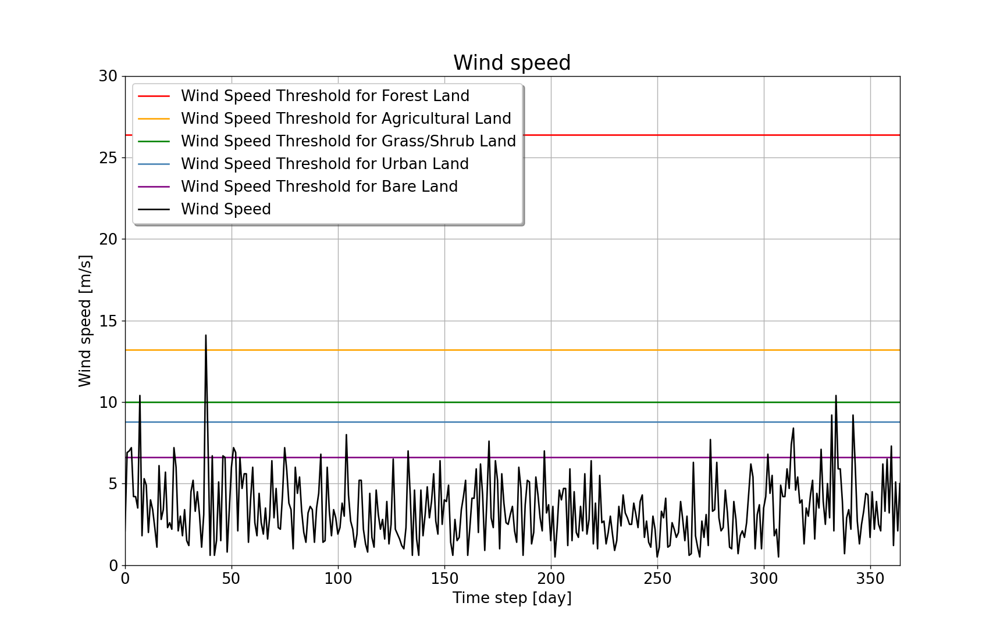

In [36]:
# Make a graph showing the wind speed value for each time step and the wind speed threshold values for the 5 types of 
# land use:

# Create a new figure:
plt.figure(figsize=[11,7])

# Title for the plot:
plt.title("Wind speed", size = 20)

# Add grid lines:
plt.grid()

# Plot the wind speed threshold values:
plt.plot(Time, W_T_F_value, color = 'red')
plt.plot(Time, W_T_A_value, color = 'orange')
plt.plot(Time, W_T_G_value, color = 'green')
plt.plot(Time, W_T_U_value, color = 'steelblue')
plt.plot(Time, W_T_B_value, color = 'purple')

# Plot the wind speed values:
plt.plot(Time, w_speed_value, color = 'black')

# Add a legend:
plt.legend(('Wind Speed Threshold for Forest Land', 'Wind Speed Threshold for Agricultural Land', \
            'Wind Speed Threshold for Grass/Shrub Land', 'Wind Speed Threshold for Urban Land', \
            'Wind Speed Threshold for Bare Land', 'Wind Speed'), prop={'size': 15}, loc = 2, shadow = True)

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize=15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('Wind speed [m/s]', size = 15)

# Limits of the axes:
plt.xlim([ 0, 364])
plt.ylim([0, 30])

# Show the plot:
plt.show()

In [37]:
# Here we use data on wind directions recorded by the Royal Netherlands Meteorological Institute (KNMI):

# We use hourly averaged wind directions* recorded by weather station "De Bilt" (latitude: 52.1015441 ; longitude: 
# 5.1779992) in the period 1981-2000.

# * wind direction is reported by the direction from which it originates 
# 0 & 360 degrees = north, 90 degrees = east, etc.

# Data source: http://projects.knmi.nl/klimatologie/frequentietabellen/maand.cgi


# The hourly averaged wind direction falls in one of the following 37 wind direction classes:

# Wind direction class 1:     no wind (windstill) or the wind directions were highly varaible (no clear average direction)
# Wind direction class 2:     wind direction between   5     and   14    degrees
# Wind direction class 3:     wind direction between   15    and   24    degrees
# Wind direction class 4:     wind direction between   25    and   34    degrees
# Wind direction class 5:     wind direction between   35    and   44    degrees
# Wind direction class 6:     wind direction between   45    and   54    degrees
# Wind direction class 7:     wind direction between   55    and   64    degrees
# Wind direction class 8:     wind direction between   65    and   74    degrees
# Wind direction class 9:     wind direction between   75    and   84    degrees
# Wind direction class 10:    wind direction between   85    and   94    degrees
# Wind direction class 11:    wind direction between   95    and   104   degrees
# Wind direction class 12:    wind direction between   105   and   114   degrees
# Wind direction class 13:    wind direction between   115   and   124   degrees
# Wind direction class 14:    wind direction between   125   and   134   degrees
# Wind direction class 15:    wind direction between   135   and   144   degrees
# Wind direction class 16:    wind direction between   145   and   154   degrees
# Wind direction class 17:    wind direction between   155   and   164   degrees
# Wind direction class 18:    wind direction between   165   and   174   degrees
# Wind direction class 19:    wind direction between   175   and   184   degrees
# Wind direction class 20:    wind direction between   185   and   194   degrees
# Wind direction class 21:    wind direction between   195   and   204   degrees
# Wind direction class 22:    wind direction between   205   and   214   degrees
# Wind direction class 23:    wind direction between   215   and   224   degrees
# Wind direction class 24:    wind direction between   225   and   234   degrees
# Wind direction class 25:    wind direction between   235   and   244   degrees
# Wind direction class 26:    wind direction between   245   and   254   degrees
# Wind direction class 27:    wind direction between   255   and   264   degrees
# Wind direction class 28:    wind direction between   265   and   274   degrees
# Wind direction class 29:    wind direction between   275   and   284   degrees
# Wind direction class 30:    wind direction between   285   and   294   degrees
# Wind direction class 31:    wind direction between   295   and   304   degrees
# Wind direction class 32:    wind direction between   305   and   314   degrees
# Wind direction class 33:    wind direction between   315   and   324   degrees
# Wind direction class 34:    wind direction between   325   and   334   degrees
# Wind direction class 35:    wind direction between   335   and   344   degrees
# Wind direction class 36:    wind direction between   345   and   354   degrees
# Wind direction class 37:    wind direction between   355   and   4     degrees

W_dir_classes = np.arange(1,38,1)

print('W_dir_classes:')
print(W_dir_classes)

# The frequency with which wind directions fall in certain wind direction classes differs from month to month

# The following 12 arrays give for each month the frequency with which the wind direction falls in a wind direction class
# (e.g the first element in the array gives the frequency with which the hourly averaged wind direction comes from a 
# direction between 5 and 14 degrees for that month)


W_dir_freq_Jan = np.array([0.0319, 0.0074, 0.0088, 0.0149, 0.0231, 0.0223, 0.0161, 0.0219, 0.0258, 0.0171, 0.0120, \
                           0.0130, 0.0116, 0.0202, 0.0265, 0.0329, 0.0358, 0.0377, 0.0353, 0.0485, 0.0530, 0.0530, \
                           0.0638, 0.0729, 0.0594, 0.0388, 0.0338, 0.0303, 0.0249, 0.0198, 0.0173, 0.0159, 0.0157, \
                           0.0117, 0.0099, 0.0083, 0.0087])

W_dir_freq_Feb = np.array([0.0350, 0.0124, 0.0211, 0.0285, 0.0290, 0.0229, 0.0218, 0.0320, 0.0360, 0.0265, 0.0187, \
                           0.0153, 0.0122, 0.0196, 0.0194, 0.0198, 0.0299, 0.0350, 0.0287, 0.0372, 0.0476, 0.0469, \
                           0.0546, 0.0590, 0.0531, 0.0348, 0.0313, 0.0281, 0.0279, 0.0223, 0.0188, 0.0172, 0.0152, \
                           0.0125, 0.0105, 0.0088, 0.0104])

W_dir_freq_Mar = np.array([0.0395, 0.0112, 0.0175, 0.0226, 0.0212, 0.0148, 0.0138, 0.0169, 0.0190, 0.0224, 0.0170, \
                           0.0132, 0.0140, 0.0209, 0.0242, 0.0259, 0.0314, 0.0287, 0.0265, 0.0289, 0.0415, 0.0438, \
                           0.0476, 0.0576, 0.0644, 0.0501, 0.0407, 0.0364, 0.0328, 0.0272, 0.0231, 0.0276, 0.0220, \
                           0.0165, 0.0157, 0.0120, 0.0114])

W_dir_freq_Apr = np.array([0.0443, 0.0284, 0.0309, 0.0347, 0.0438, 0.0370, 0.0234, 0.0221, 0.0207, 0.0208, 0.0163, \
                           0.0163, 0.0148, 0.0206, 0.0249, 0.0256, 0.0303, 0.0289, 0.0242, 0.0275, 0.0311, 0.0284, \
                           0.0313, 0.0358, 0.0367, 0.0269, 0.0272, 0.0235, 0.0254, 0.0244, 0.0262, 0.0270, 0.0270, \
                           0.0251, 0.0223, 0.0238, 0.0224])

W_dir_freq_May = np.array([0.0589, 0.0288, 0.0335, 0.0411, 0.0404, 0.0325, 0.0234, 0.0255, 0.0300, 0.0279, 0.0233, \
                           0.0163, 0.0163, 0.0189, 0.0204, 0.0235, 0.0246, 0.0210, 0.0201, 0.0219, 0.0247, 0.0261, \
                           0.0317, 0.0344, 0.0368, 0.0253, 0.0210, 0.0252, 0.0223, 0.0190, 0.0200, 0.0237, 0.0296, \
                           0.0351, 0.0288, 0.0254, 0.0226])

W_dir_freq_Jun = np.array([0.0542, 0.0233, 0.0284, 0.0342, 0.0336, 0.0255, 0.0179, 0.0138, 0.0146, 0.0152, 0.0126, \
                           0.0129, 0.0111, 0.0107, 0.0156, 0.0174, 0.0196, 0.0164, 0.0157, 0.0233, 0.0304, 0.0337, \
                           0.0485, 0.0525, 0.0433, 0.0349, 0.0367, 0.0403, 0.0384, 0.0326, 0.0328, 0.0319, 0.0343, \
                           0.0309, 0.0228, 0.0194, 0.0206])

W_dir_freq_Jul = np.array([0.0637, 0.0152, 0.0216, 0.0343, 0.0338, 0.0202, 0.0148, 0.0149, 0.0165, 0.0150, 0.0147, \
                           0.0091, 0.0106, 0.0122, 0.0155, 0.0173, 0.0197, 0.0169, 0.0157, 0.0237, 0.0292, 0.0372, \
                           0.0443, 0.0505, 0.0458, 0.0366, 0.0384, 0.0439, 0.0376, 0.0313, 0.0349, 0.0358, 0.0392, \
                           0.0343, 0.0237, 0.0175, 0.0144])

W_dir_freq_Aug = np.array([0.0882, 0.0170, 0.0243, 0.0280, 0.0300, 0.0188, 0.0141, 0.0179, 0.0157, 0.0152, 0.0144, \
                           0.0135, 0.0123, 0.0124, 0.0185, 0.0226, 0.0263, 0.0231, 0.0210, 0.0299, 0.0351, 0.0384, \
                           0.0472, 0.0489, 0.0443, 0.0355, 0.0356, 0.0349, 0.0326, 0.0259, 0.0235, 0.0292, 0.0296, \
                           0.0267, 0.0195, 0.0159, 0.0140])

W_dir_freq_Sep = np.array([0.0780, 0.0110, 0.0152, 0.0219, 0.0275, 0.0205, 0.0167, 0.0156, 0.0162, 0.0167, 0.0183, \
                           0.0158, 0.0193, 0.0249, 0.0267, 0.0319, 0.0363, 0.0293, 0.0299, 0.0390, 0.0444, 0.0467, \
                           0.0514, 0.0522, 0.0422, 0.0291, 0.0301, 0.0313, 0.0258, 0.0197, 0.0173, 0.0185, 0.0228, \
                           0.0195, 0.0157, 0.0114, 0.0112])

W_dir_freq_Oct = np.array([0.0570, 0.0063, 0.0106, 0.0170, 0.0167, 0.0157, 0.0145, 0.0208, 0.0247, 0.0216, 0.0222, \
                           0.0188, 0.0182, 0.0245, 0.0344, 0.0401, 0.0483, 0.0438, 0.0359, 0.0475, 0.0558, 0.0585, \
                           0.0687, 0.0572, 0.0394, 0.0279, 0.0271, 0.0250, 0.0179, 0.0127, 0.0112, 0.0108, 0.0128, \
                           0.0114, 0.0075, 0.0087, 0.0088])

W_dir_freq_Nov = np.array([0.0460, 0.0071, 0.0078, 0.0153, 0.0153, 0.0172, 0.0161, 0.0158, 0.0196, 0.0201, 0.0190, \
                           0.0203, 0.0233, 0.0353, 0.0372, 0.0422, 0.0421, 0.0471, 0.0408, 0.0532, 0.0568, 0.0503, \
                           0.0576, 0.0552, 0.0397, 0.0291, 0.0281, 0.0283, 0.0233, 0.0142, 0.0138, 0.0165, 0.0121, \
                           0.0106, 0.0096, 0.0071, 0.0069])

W_dir_freq_Dec = np.array([0.0373, 0.0082, 0.0104, 0.0144, 0.0219, 0.0231, 0.0188, 0.0229, 0.0277, 0.0190, 0.0153, \
                           0.0150, 0.0142, 0.0207, 0.0268, 0.0298, 0.0351, 0.0357, 0.0358, 0.0489, 0.0543, 0.0563, \
                           0.0633, 0.0631, 0.0569, 0.0358, 0.0366, 0.0327, 0.0254, 0.0172, 0.0150, 0.0141, 0.0122, \
                           0.0134, 0.0080, 0.0076, 0.0071])


W_dir_classes:
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37]


In [38]:
# Here the code randomly picks a wind direction for each time step, whereby it takes the monthly wind direction frequencies
# into account:

w_dir_value = np.empty(Time_range)

for t in Time:
    
    if (t >= 0 and t <= 30):
        
        #print('t = ', t)
        #print('It is January!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Jan)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 31 and t <= 58): # not a leap year!
        
        #print('t = ', t)
        #print('It is February!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Feb)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 59 and t <= 89):
        
        #print('t = ', t)
        #print('It is March!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Mar)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 90 and t <= 119):
        
        #print('t = ', t)
        #print('It is April!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Apr)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 120 and t <= 150):
        
        #print('t = ', t)
        #print('It is May!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_May)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 151 and t <= 180):
        
        #print('t = ', t)
        #print('It is June!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Jun)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 181 and t <= 211):
        
        #print('t = ', t)
        #print('It is July!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Jul)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 212 and t <= 242):
        
        #print('t = ', t)
        #print('It is August!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Aug)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 243 and t <= 272):
        
        #print('t = ', t)
        #print('It is September!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Sep)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 273 and t <= 303):
        
        #print('t = ', t)
        #print('It is October!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Oct)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 304 and t <= 333):
        
        #print('t = ', t)
        #print('It is November!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Nov)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    if (t >= 334 and t <= 364):
        
        #print('t = ', t)
        #print('It is December!')
        
        w_dir_class = np.random.choice(W_dir_classes, p = W_dir_freq_Dec)
        
        #print('For t =', t, 'the randomly picked wind direction class is:', w_dir_class)
    
    #-----------------------------------------------------------------------------------------------------------------------
    
    if (w_dir_class == 1):
        
        aa = np.random.randint(low = 1, high = 361)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
        
    if (w_dir_class == 2):
        
        aa = np.random.randint(low = 5, high = 15)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
        
    if (w_dir_class == 3):
        
        aa = np.random.randint(low = 15, high = 25)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 4):
        
        aa = np.random.randint(low = 25, high = 35)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 5):
        
        aa = np.random.randint(low = 35, high = 45)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 6):
        
        aa = np.random.randint(low = 45, high = 55)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 7):
        
        aa = np.random.randint(low = 55, high = 65)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 8):
        
        aa = np.random.randint(low = 65, high = 75)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 9):
        
        aa = np.random.randint(low = 75, high = 85)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 10):
        
        aa = np.random.randint(low = 85, high = 95)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 11):
        
        aa = np.random.randint(low = 95, high = 105)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 12):
        
        aa = np.random.randint(low = 105, high = 115)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 13):
        
        aa = np.random.randint(low = 115, high = 125)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 14):
        
        aa = np.random.randint(low = 125, high = 135)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 15):
        
        aa = np.random.randint(low = 135, high = 145)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 16):
        
        aa = np.random.randint(low = 145, high = 155)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 17):
        
        aa = np.random.randint(low = 155, high = 165)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 18):
        
        aa = np.random.randint(low = 165, high = 175)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 19):
        
        aa = np.random.randint(low = 175, high = 185)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 20):
        
        aa = np.random.randint(low = 185, high = 195)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 21):
        
        aa = np.random.randint(low = 195, high = 205)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 22):
        
        aa = np.random.randint(low = 205, high = 215)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 23):
        
        aa = np.random.randint(low = 215, high = 225)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 24):
        
        aa = np.random.randint(low = 225, high = 235)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 25):
        
        aa = np.random.randint(low = 235, high = 245)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 26):
        
        aa = np.random.randint(low = 245, high = 255)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 27):
        
        aa = np.random.randint(low = 255, high = 265)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 28):
        
        aa = np.random.randint(low = 265, high = 275)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 29):
        
        aa = np.random.randint(low = 275, high = 285)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 30):
        
        aa = np.random.randint(low = 285, high = 295)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 31):
        
        aa = np.random.randint(low = 295, high = 305)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 32):
        
        aa = np.random.randint(low = 305, high = 315)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 33):
        
        aa = np.random.randint(low = 315, high = 325)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 34):
        
        aa = np.random.randint(low = 325, high = 335)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 35):
        
        aa = np.random.randint(low = 335, high = 345)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 36):
        
        aa = np.random.randint(low = 345, high = 355)
        #print('aa =', aa)
        
        w_dir_value[t] = aa
                
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
    if (w_dir_class == 37):
        
        aa = np.random.randint(low = 355, high = 361)
        #print('aa =', aa)
        bb = np.random.randint(low = 1, high = 5)
        #print('bb =', bb)
        
        aa_or_bb = np.random.randint(2, size = 1)
        
        if (aa_or_bb == 0):
            
            w_dir_value[t] = aa
        
        else:
            
            w_dir_value[t] = bb
                     
        #print('Then a random wind direction was chosen between the limits of this wind direction class (w_dir_value =)', \
              #w_dir_value[t])
    
      
    #-----------------------------------------------------------------------------------------------------------------------

print('w_dir_value: ')
print(w_dir_value)

w_dir_value: 
[332. 234.  79. 194. 175. 166. 189. 306. 291. 142. 265. 259. 181. 268.
 168. 277. 208. 186. 248.  78.  36. 158. 105. 161. 257. 219. 252. 285.
 268. 253. 189. 202. 150. 220. 220. 244. 117.  45. 326. 239.  24. 168.
 121.  34. 213. 233.  35. 100. 295.  90. 176. 360. 227. 228. 100. 121.
 179. 266.  73. 201. 327. 228. 320. 125.  30. 226.  67. 170. 274. 250.
 193. 343. 153. 239. 324.  24. 353. 128. 204. 240. 157. 305. 208.  57.
 153.   3. 225. 190. 266. 243. 108.   5. 148.  34.  54. 147. 302.  74.
  52.  45.  91. 313. 302. 358. 159.  49.  24. 315. 184.  77. 161. 277.
 160. 352. 210.  17. 234.  34.  51. 106. 112. 239. 219.  26. 337. 133.
 138. 110. 267. 282. 144. 140. 267. 161.  29. 305. 323. 184.  46. 166.
 238. 134.  26. 246. 257. 149.  92. 354. 348. 327.  35. 145.  77. 252.
 310. 217. 212.  25. 279.  53. 317. 248. 219. 289. 116.  25. 276. 263.
   3. 272.  20. 179. 303. 169.  90. 233.  92. 176. 290. 353. 333. 211.
 305. 315.  99. 337. 239. 124. 215.  64. 327. 264. 314.   3. 29

In [39]:
# Here the wind transport directions are calculated from the wind directions:

# First of all the wind directions are restricted to 8 in our model (see User's Manual)

# This is how the wind directions (in degrees) are converted to the 8 directions of motion used in the model:

# Wind directions between 292.5 - 337.5  [deg]  -->  wind direction: the wind comes FROM the northwest
# Wind directions between 337.5 - 22.5   [deg]  -->  wind direction: the wind comes FROM the north
# Wind directions between 22.5  - 67.5   [deg]  -->  wind direction: the wind comes FROM the northeast
# Wind directions between 67.5  - 112.5  [deg]  -->  wind direction: the wind comes FROM the east
# Wind directions between 112.5 - 157.5  [deg]  -->  wind direction: the wind comes FROM the southeast
# Wind directions between 157.5 - 202.5  [deg]  -->  wind direction: the wind comes FROM the south
# Wind directions between 202.5 - 247.5  [deg]  -->  wind direction: the wind comes FROM the southwest
# Wind directions between 247.5 - 292.5  [deg]  -->  wind direction: the wind comes FROM the west

############################################################################################################################

# Additionally note that wind directions indicate the direction from which the wind originates, this means that plastic 
# particles are transported in the opposite direction (i.e. +180 degrees), e.g. wind blowing FROM the north, displaces 
# particles TO the south! So the 'wind transport direction' is opposite of the 'wind direction'

# Labels for the wind transport directions in which a plastic particle located in grid cell 'x' is blown to due to the wind:

#                 WIND DIRECTION                      WIND TRANSPORT DIRECTION
# 2000    the wind comes FROM the southeast   and blows particles TOWARDS the northwest
# 2001    the wind comes FROM the south       and blows particles TOWARDS the north
# 2002    the wind comes FROM the southwest   and blows particles TOWARDS the northeast
# 2003    the wind comes FROM the west        and blows particles TOWARDS the east
# 2004    the wind comes FROM the northwest   and blows particles TOWARDS the southeast
# 2005    the wind comes FROM the north       and blows particles TOWARDS the south
# 2006    the wind comes FROM the northeast   and blows particles TOWARDS the southwest
# 2007    the wind comes FROM the east        and blows particles TOWARDS the west

#   |--------|--------|--------|
#   |        |        |        |
#   |  2000  |  2001  |  2002  |
#   |        |        |        |
#   |--------|--------|--------|
#   |        |        |        |
#   |  2007  |   x    |  2003  |
#   |        |        |        |
#   |--------|--------|--------|
#   |        |        |        |
#   |  2006  |  2005  |  2004  |
#   |        |        |        |
#   |--------|--------|--------|

############################################################################################################################


# The 'w_dir_value' array contains the wind directions from which the Wind_displacement_dir array is computed as follows:


Wind_displacement_dir = np.zeros(Time_range)   # contains the wind TRANSPORT directions

for t in Time:

    if (w_dir_value[t] >= 292.5 and w_dir_value[t] < 337.5):
        
        Wind_displacement_dir[t] = 2004
    
    if (w_dir_value[t] >= 337.5 and w_dir_value[t] <= 360):
        
        Wind_displacement_dir[t] = 2005
    
    if (w_dir_value[t] >= 1 and w_dir_value[t] < 22.5):
        
        Wind_displacement_dir[t] = 2005
      
    if (w_dir_value[t] >= 22.5 and w_dir_value[t] < 67.5):
        
        Wind_displacement_dir[t] = 2006
    
    if (w_dir_value[t] >= 67.5 and w_dir_value[t] < 112.5):
        
        Wind_displacement_dir[t] = 2007
    
    if (w_dir_value[t] >= 112.5 and w_dir_value[t] < 157.5):
        
        Wind_displacement_dir[t] = 2000
    
    if (w_dir_value[t] >= 157.5 and w_dir_value[t] < 202.5):
        
        Wind_displacement_dir[t] = 2001
    
    if (w_dir_value[t] >= 202.5 and w_dir_value[t] < 247.5):
        
        Wind_displacement_dir[t] = 2002
    
    if (w_dir_value[t] >= 247.5 and w_dir_value[t] < 292.5):
        
        Wind_displacement_dir[t] = 2003
    
Wind_displacement_dir[t] = np.round(Wind_displacement_dir[t], 0)
    
print('Wind_displacement_dir:')    
print(Wind_displacement_dir)
            

Wind_displacement_dir:
[2004. 2002. 2007. 2001. 2001. 2001. 2001. 2004. 2003. 2000. 2003. 2003.
 2001. 2003. 2001. 2003. 2002. 2001. 2003. 2007. 2006. 2001. 2007. 2001.
 2003. 2002. 2003. 2003. 2003. 2003. 2001. 2001. 2000. 2002. 2002. 2002.
 2000. 2006. 2004. 2002. 2006. 2001. 2000. 2006. 2002. 2002. 2006. 2007.
 2004. 2007. 2001. 2005. 2002. 2002. 2007. 2000. 2001. 2003. 2007. 2001.
 2004. 2002. 2004. 2000. 2006. 2002. 2006. 2001. 2003. 2003. 2001. 2005.
 2000. 2002. 2004. 2006. 2005. 2000. 2002. 2002. 2000. 2004. 2002. 2006.
 2000. 2005. 2002. 2001. 2003. 2002. 2007. 2005. 2000. 2006. 2006. 2000.
 2004. 2007. 2006. 2006. 2007. 2004. 2004. 2005. 2001. 2006. 2006. 2004.
 2001. 2007. 2001. 2003. 2001. 2005. 2002. 2005. 2002. 2006. 2006. 2007.
 2007. 2002. 2002. 2006. 2004. 2000. 2000. 2007. 2003. 2003. 2000. 2000.
 2003. 2001. 2006. 2004. 2004. 2001. 2006. 2001. 2002. 2000. 2006. 2002.
 2003. 2000. 2007. 2005. 2005. 2004. 2006. 2000. 2007. 2003. 2004. 2002.
 2002. 2006. 2003. 2006. 200

In [40]:
# Make simple wind transport direction array for each timestep:

# Here we assume the wind direction to be the same in the whole domain during 1 timestep

# Make a 3D array that contains all the wind direction maps for all timesteps --> W_dir[latitude,longitude,time]

W_dir = np.empty((n_row,n_col,Time_range))

for t in Time:
      
    for i in np.arange(0,n_row,1):
                
        for j in np.arange(0,n_col,1):
            
            W_dir[i,j,t] = Wind_displacement_dir[t]


In [41]:
# Make a vector field for the wind directions, in which u contains the zonal components of the vectors and v the meridional:

u = np.empty((n_row,n_col,Time_range))
v = np.empty((n_row,n_col,Time_range))

for t in Time:

    for i in np.arange(0,n_row,1):
        
        for j in np.arange(0,n_col,1):
        
            if (W_dir[i,j,t] == 2000):
                u[i,j,t] = -1
                v[i,j,t] = 1
            if (W_dir[i,j,t] == 2001):
                u[i,j,t] = 0
                v[i,j,t] = 1
            if (W_dir[i,j,t] == 2002):
                u[i,j,t] = 1
                v[i,j,t] = 1
            if (W_dir[i,j,t] == 2003):
                u[i,j,t] = 1
                v[i,j,t] = 0
            if (W_dir[i,j,t] == 2004):
                u[i,j,t] = 1
                v[i,j,t] = -1
            if (W_dir[i,j,t] == 2005):
                u[i,j,t] = 0
                v[i,j,t] = -1
            if (W_dir[i,j,t] == 2006):
                u[i,j,t] = -1
                v[i,j,t] = -1
            if (W_dir[i,j,t] == 2007):
                u[i,j,t] = -1
                v[i,j,t] = 0


In [42]:
# Make a movie showing the wind speed and wind transport direction maps through time:

fig, ax = plt.subplots(figsize=[9,7])

def W_dir_animate(t):
    
    # Give title to the plot:
    ax.set_title('Wind speeds and wind transport directions at t = %d' %(t), size = 20)
    
    # Create a mesh:
    xx, yy = np.meshgrid(lon_arc, lat_arc)

    # Plot the mesh:
    ax.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')
    
    # Plot colors that correspond to the wind speed at t:
    c = ax.pcolormesh(x, y, W_speed[:,:,t], edgecolors='black', linewidths=1, vmin=np.min(W_speed), vmax=np.max(W_speed), cmap='Blues')

    # Colorbar:
    div = make_axes_locatable(ax)
    cax1 = div.append_axes('right', size='5%', pad=0.5)
    cbar = plt.colorbar(c, cax=cax1)
    cbar.set_label('Wind speed [m/s]', size = 15)
    
    # Plot vectors that correspond to the wind transport directions:
    ax.quiver(xx, yy, u[:,:,t], v[:,:,t], color = 'black', pivot='tail', scale = 20)
            
    # Step sizes for the axes:
    ax.set_xticks(lon_arc)
    ax.set_yticks(lat_arc)

    # Titels for the axes: 
    ax.set_xlabel('Longitude  [arcseconds]', size = 15)
    ax.set_ylabel('Latitude  [arcseconds]', size = 15)
    
    return ax

anim = matplotlib.animation.FuncAnimation(fig, W_dir_animate, frames = Time)

plt.show()

#anim.save('Wind_speed_&_direction.gif')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


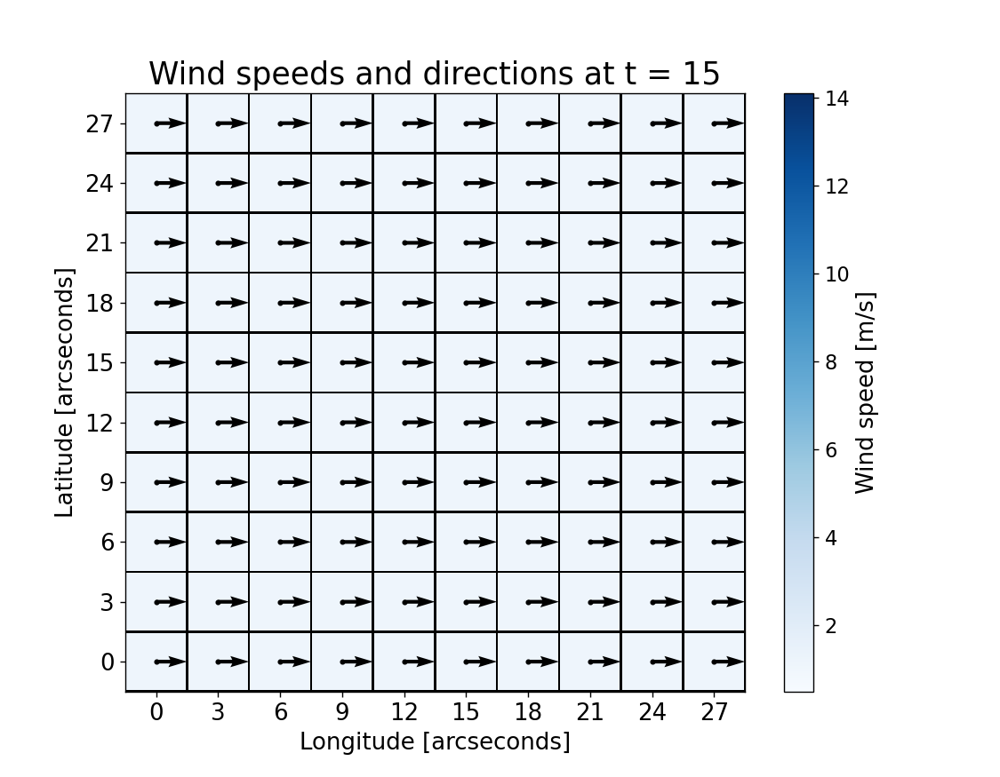

In [43]:
# Make a plot showing the wind speed and wind transport direction for a single time step:

# Create a new figure:
plt.figure(figsize=[9,7])

t = 15

# Title for the plot:
plt.title('Wind speeds and directions at t = %d' %(t), size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the steepest (downhill) terrain slope magnitude:
c = plt.pcolormesh(x, y, W_speed[:,:,t], edgecolors='black', vmin=np.min(W_speed), vmax=np.max(W_speed), linewidths=1, cmap = 'Blues')

# Add a color scale bar:
cbar = plt.colorbar()

# Assign labels to the color scale bar:
cbar.set_label('Wind speed [m/s]', size = 15)
cbar.ax.tick_params(labelsize = 13)

# Plot vectors that correspond to the slope directions:
plt.quiver(xx, yy, u[:,:,t], v[:,:,t], color = 'black', pivot='tail', scale = 20)

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [44]:
############################################################################################################################
############################################## W I N D  T H R E S H O L D S ################################################
############################################################################################################################

In [45]:
# Here, the 'W_T_lu' array is created, which contains the wind thresholds that only depend on the type of land use:

# The wind threshold map contains for each grid cell in the domain the critical wind speed required to mobilise and 
# transport macroplastics

# The wind speed threshold values are stored in ParVal[0] to ParVal[5] at the top of the program and can be set by the user

W_T_lu = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if(LU[i,j] == 0):
            W_T_lu[i,j] = W_T_R        # River
        if(LU[i,j] == 100):
            W_T_lu[i,j] = W_T_B        # Bare land
        if(LU[i,j] == 200):
            W_T_lu[i,j] = W_T_F        # Forest
        if(LU[i,j] == 300):
            W_T_lu[i,j] = W_T_A        # Agricultural land
        if(LU[i,j] == 400):
            W_T_lu[i,j] = W_T_U        # Urban land
        if(LU[i,j] == 500):
            W_T_lu[i,j] = W_T_G        # Grass/shrubland

print('W_T_lu:')
print(W_T_lu)


W_T_lu:
[[ 6.6  6.6  6.6  6.6 30.  30.   6.6  6.6  6.6  6.6]
 [13.2 13.2 26.4 26.4 30.  30.  13.2  8.8  8.8  8.8]
 [ 8.8  8.8 26.4 30.  30.  30.  13.2  8.8  8.8  8.8]
 [ 8.8  8.8 30.  30.  30.  30.  13.2 13.2 13.2 13.2]
 [10.  30.  30.  10.  30.  30.  30.  10.  10.  10. ]
 [10.  30.  30.  10.  30.  30.  30.  30.  10.  10. ]
 [30.  30.  10.  10.  30.  30.  26.4 30.  30.  10. ]
 [30.  13.2  8.8  8.8 30.  30.  26.4 26.4 30.  30. ]
 [30.  13.2  8.8  8.8 30.  30.  26.4  8.8  8.8 30. ]
 [26.4 13.2 13.2 13.2 30.  30.  26.4  8.8  8.8 13.2]]


<IPython.core.display.Javascript object>


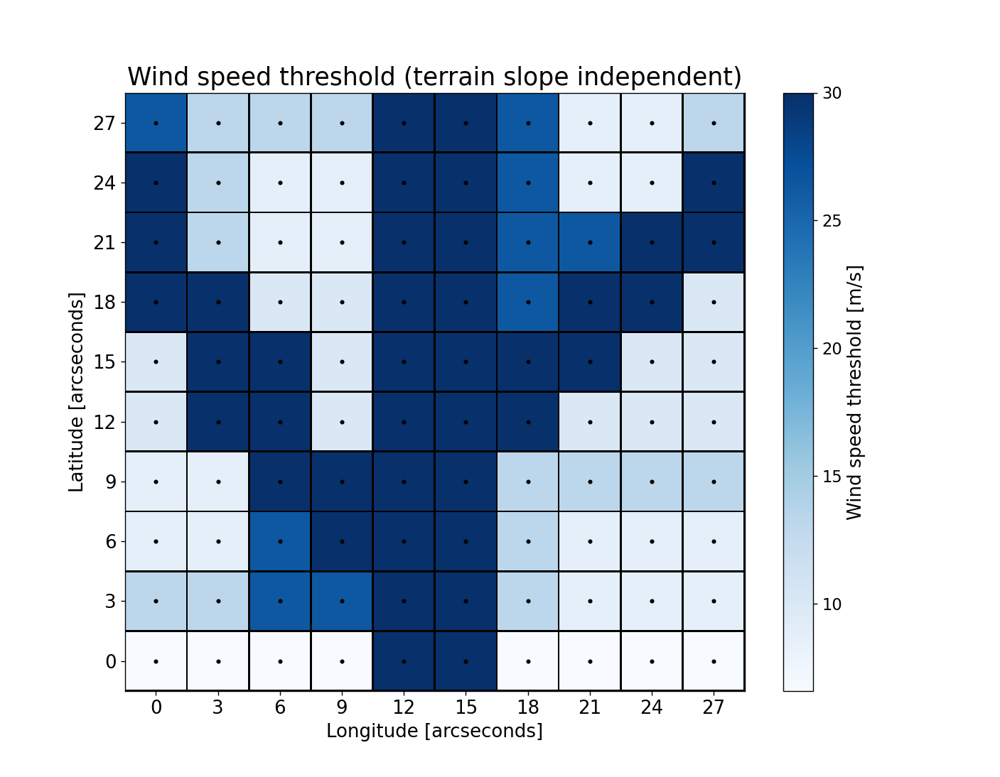

In [46]:
# Make a plot showing the wind speed thresholds map:

# Create a new figure:
plt.figure(figsize=[9,7])

# Title for the plot:
plt.title("Wind speed threshold (terrain slope independent)", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the land use dependent wind speed threshold values:
c = plt.pcolormesh(x, y, W_T_lu, edgecolors='black', linewidths=1, vmin=np.min(W_T_lu), vmax=np.max(W_T_lu),\
                   cmap = 'Blues')

# Add a color scale bar:
cbar = plt.colorbar()

# Assign a label to the color scale bar:
cbar.set_label('Wind speed threshold [m/s]', size = 15)
cbar.ax.tick_params(labelsize = 13)

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [47]:
# Here, the 'W_T_lus' array is created, which contains the wind thresholds that depend on both the type of land use and
# the terrain slope:

# Calculate for each grid cell the wind threshold by considering the terrain slope in the transport direction of the wind 
# for that cell. E.g. if the wind in cell i is towards the east, then use the topography gradient between cell i and the 
# cell to the right of cell i in order to calculate the final wind threshold. 

# Add 4.20 m/s to the slope independent wind threshold value (see ParVal[0] to ParVal[5] at the top of the program) for 
# each radian of slope angle if the wind blows uphill, or subtract 4.20 m/s from the wind trehshold value for each radian 
# of slope angle if the wind blows downhill. The explaination of the value 4.20 (m/s) can be found in the User's manual.
# This value is called deltaTW and is set by the user in ParVal[7]

W_T_lus = np.empty((n_row,n_col,Time_range))

for t in Time:

    for i in np.arange(0,n_row,1):

        for j in np.arange(0,n_col,1):      

    ########################################################################################################################

            # Cell in the lower left corner of the domain:
            if (i == 0 and j == 0):    

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    dwd          = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    dwd          = (Z[i+1,j+1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    dwd          = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

    ########################################################################################################################

            # Cell in the upper left corner of the domain:        
            elif (i == (n_row-1) and j == 0):    

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    dwd          = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east:
                    dwd          = (Z[i-1,j+1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    dwd          = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

    ########################################################################################################################

            # Cell in the upper right corner of the domain:
            elif (i == (n_row-1) and j == (n_col-1)):

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    dwd          = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    dwd          = (Z[i-1,j]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    dwd          = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

    ########################################################################################################################

            # Cell in the lower right corner of the domain:
            elif (i == 0 and j == (n_col-1)):    

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    dwd          = (Z[i+1,j-1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    dwd          = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    dwd          = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

    ########################################################################################################################

            # Cells along the western boundary of the domain:
            elif (i != 0 and i != (n_row-1) and j == 0):    

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    dwd          = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    dwd          = (Z[i+1,j+1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    dwd          = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east:
                    dwd          = (Z[i-1,j+1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    dwd          = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

    ########################################################################################################################

            # Cells along the northern boundary of the domain:
            elif (i == (n_row-1) and j != 0 and j != (n_col-1)):    

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    dwd          = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east:
                    dwd          = (Z[i-1,j+1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    dwd          = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    dwd          = (Z[i-1,j]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    dwd          = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

    ########################################################################################################################

            # Cells along the eastern boundary of the domain:
            elif (i != 0 and i != (n_row-1) and j == (n_col-1)):    

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    dwd          = (Z[i+1,j-1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    dwd          = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    dwd          = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    dwd          = (Z[i-1,j]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    dwd          = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

    ########################################################################################################################

            # Cells along the southern boundary of the domain:
            elif (i == 0 and j != 0 and j != (n_col-1)): 

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    dwd          = (Z[i+1,j-1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    dwd          = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    dwd          = (Z[i+1,j+1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    dwd          = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    W_T_lus[i,j,t] = W_T_lu[i,j]

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    dwd          = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

    ########################################################################################################################

            # Cells in the interior of the domain:       
            else:

                if(W_dir[i,j,t] == 2000):
                    # Topography gradient when moving towards the cell to the north-west:
                    dwd          = (Z[i+1,j-1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2001):
                    # Topography gradient when moving towards the cell to the north: 
                    dwd          = (Z[i+1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2002):
                    # Topography gradient when moving towards the cell to the north-east:
                    dwd          = (Z[i+1,j+1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2003):
                    # Topography gradient when moving towards the cell to the east:
                    dwd          = (Z[i,j+1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2004):
                    # Topography gradient when moving towards the cell to the south-east tadataaa:
                    dwd          = (Z[i-1,j+1]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2005):
                    # Topography gradient when moving towards the cell to the south:
                    dwd          = (Z[i-1,j]-Z[i,j])/(Lat_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2006):
                    # Topography gradient when moving towards the cell to the south-west:
                    dwd          = (Z[i-1,j]-Z[i,j])/(d_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)

                if(W_dir[i,j,t] == 2007):
                    # Topography gradient when moving towards the cell to the west:
                    dwd          = (Z[i,j-1]-Z[i,j])/(Lon_res_m)
                    slope_rad    = np.arctan(dwd)
                    if(slope_rad == 0):
                        W_T_lus[i,j,t] = W_T_lu[i,j]
                    else:
                        W_T_lus[i,j,t] = W_T_lu[i,j] + ((slope_rad)*deltaTW)


In [48]:
# Make a movie showing the wind speed thresholds maps through time:

fig, ax = plt.subplots(figsize=[9,7])

def W_T_lus_animate(t):
    
    # Give title to the plot:
    ax.set_title('Wind speed threshold (terrain slope dependent) at t = %d' %(t), size = 20)
       
    # Create a mesh:
    xx, yy = np.meshgrid(lon_arc, lat_arc)

    # Plot the mesh:
    ax.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')
      
    # Plot colors that correspond to the land use AND slope dependent wind speed threshold values at t:
    c = ax.pcolormesh(x, y, W_T_lus[:,:,t], edgecolors='black', linewidths=1, vmin=np.min(W_T_lus), vmax=np.max(W_T_lus), \
                      cmap='Blues')

    # Colorbar:
    div = make_axes_locatable(ax)
    cax1 = div.append_axes('right', size='5%', pad=0.5)
    cbar = plt.colorbar(c, cax=cax1)
    cbar.set_label('Wind speed threshold [m/s]', size = 15)
      
    # Step sizes for the axes:
    ax.set_xticks(lon_arc)
    ax.set_yticks(lat_arc)

    # Titels for the axes: 
    ax.set_xlabel('Longitude  [arcseconds]', size = 15)
    ax.set_ylabel('Latitude  [arcseconds]', size = 15)
    
    return ax

anim = matplotlib.animation.FuncAnimation(fig, W_T_lus_animate, frames = Time)

plt.show()

<IPython.core.display.Javascript object>

In [49]:
############################################################################################################################
############################################ S U R F A C E   R U N O F F ###################################################
############################################################################################################################

In [50]:
# Here we use data on rainfall recorded by the Royal Netherlands Meteorological Institute (KNMI):

# The weather station "De Bilt" (latitude: 52.1015441 ; longitude: 5.1779992) recorded the total amount of rainfall (in mm)
# for each hour in the period 1981-2000. 

# Data source: http://projects.knmi.nl/klimatologie/uurgegevens/selectie.cgi

# For each day we added these 24 hour values to obtain a total amount of rainfall (in mm) per day. This resulted in 7305 
# rainfall values. Next we created 23 rainfall classes:

# The total amount of rainfall in mm per day falls in one of the following 23 rainfall classes:

# Rainfall class 1:    no rainfall      0.000                  mm
# Rainfall class 2:    rainfall from    0.001    to   0.100    mm
# Rainfall class 3:    rainfall from    0.101    to   1.000    mm
# Rainfall class 4:    rainfall from    1.001    to   2.000    mm
# Rainfall class 5:    rainfall from    2.001    to   3.000    mm
# Rainfall class 6:    rainfall from    3.001    to   4.000    mm
# Rainfall class 7:    rainfall from    4.001    to   5.000    mm
# Rainfall class 8:    rainfall from    5.001    to   6.000    mm
# Rainfall class 9:    rainfall from    6.001    to   7.000    mm
# Rainfall class 10:   rainfall from    7.001    to   8.000    mm
# Rainfall class 11:   rainfall from    8.001    to   9.000    mm
# Rainfall class 12:   rainfall from    9.001    to   10.000   mm
# Rainfall class 13:   rainfall from    10.001   to   11.000   mm
# Rainfall class 14:   rainfall from    11.001   to   12.000   mm
# Rainfall class 15:   rainfall from    12.001   to   13.000   mm
# Rainfall class 16:   rainfall from    13.001   to   14.000   mm
# Rainfall class 17:   rainfall from    14.001   to   15.000   mm
# Rainfall class 18:   rainfall from    15.001   to   16.000   mm
# Rainfall class 19:   rainfall from    16.001   to   17.000   mm
# Rainfall class 20:   rainfall from    17.001   to   18.000   mm
# Rainfall class 21:   rainfall from    18.001   to   19.000   mm
# Rainfall class 22:   rainfall from    19.001   to   20.000   mm
# Rainfall class 23:   rainfall from    > 20.001               mm

Rainfall_classes = np.arange(1,24,1)

print('Rainfall_classes:')
print(Rainfall_classes)

# The frequency with which the amount of daily rainfall falls in certain rainfall class is given in the following array 
# (note that we do not take monlty variations in rainfall intensities in account!)

Rainfall_freq = np.array([0.3247, 0.1771, 0.1396, 0.0758, 0.0531, 0.0393, 0.0342, 0.0256, 0.0203, 0.0179, 0.0155, \
                          0.0134, 0.0100, 0.0086, 0.0060, 0.0055, 0.0059, 0.0045, 0.0029, 0.0033, 0.0038, 0.0018, \
                          0.0112])

print(' ')
print('Rainfall_freq:')
print(Rainfall_freq)


Rainfall_classes:
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
 
Rainfall_freq:
[0.3247 0.1771 0.1396 0.0758 0.0531 0.0393 0.0342 0.0256 0.0203 0.0179
 0.0155 0.0134 0.01   0.0086 0.006  0.0055 0.0059 0.0045 0.0029 0.0033
 0.0038 0.0018 0.0112]


In [51]:
# Here the code randomly picks a rainfall value for each time step, whereby it takes the monthly rainfall frequencies
# into account:

rainfall_value = np.empty(Time_range)

for t in Time:
    
    rainfall_class = np.random.choice(Rainfall_classes, p = Rainfall_freq)
        
    #print('For t =', t, 'the randomly picked rainfall class is:', rainfall_class)
    
    #-----------------------------------------------------------------------------------------------------------------------
    
    if (rainfall_class == 1):
        
        rainfall_value[t] = 0.0
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 2):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 0.010 + ( (0.100-0.010)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 3):
        
        aaa = np.random.randint(low = 1, high = 10)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 0.200 + ( (1.000-0.200)*(aaa-1) / (9-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 4):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 1.100 + ( (2.000-1.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 5):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 2.100 + ( (3.000-2.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 6):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 3.100 + ( (4.000-3.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 7):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 4.100 + ( (5.000-4.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 8):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 5.100 + ( (6.000-5.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 9):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 6.100 + ( (7.000-6.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 10):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 7.100 + ( (8.000-7.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 11):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 8.100 + ( (9.000-8.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 12):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 9.100 + ( (10.000-9.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 13):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 10.100 + ( (11.000-10.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 14):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 11.100 + ( (12.000-11.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 15):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 12.100 + ( (13.000-12.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 16):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 13.100 + ( (14.000-13.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 17):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 14.100 + ( (15.000-14.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random wind speed was chosen between the limits of this wind speed class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 18):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 15.100 + ( (16.000-15.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 19):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 16.100 + ( (17.000-16.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
        
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 20):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =',aa a)
        
        rainfall_value[t] = 17.100 + ( (18.000-17.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
            
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 21):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 18.100 + ( (19.000-18.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
            
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
    
    if (rainfall_class == 22):
        
        aaa = np.random.randint(low = 1, high = 11)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 19.100 + ( (20.000-19.100)*(aaa-1) / (10-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
            
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
        
    if (rainfall_class == 23):
        
        aaa = np.random.randint(low = 1, high = 301)
        #print('aaa =', aaa)
        
        rainfall_value[t] = 20.100 + ( (50.000-20.100)*(aaa-1) / (300-1) )
        rainfall_value[t] = np.round(rainfall_value[t], 3)
            
        #print('Then a random rainfall was chosen between the limits of this rainfall class (rainfall_value =)', \
              #rainfall_value[t])
      
    #-----------------------------------------------------------------------------------------------------------------------


np.set_printoptions(suppress=True)
print('rainfall_value (in mm per day):')
print(rainfall_value)

rainfall_value (in mm per day):
[ 8.6   0.03  0.    0.7   1.2   3.7   0.    0.6   0.2   0.    0.09  0.
  0.    7.1   0.09  3.8   1.4   0.6   2.4   0.07  0.4   0.    7.3   0.4
  1.3   0.02  0.    2.3   0.4   0.    6.7   0.05  0.04  0.    1.4  14.9
  0.7   0.    0.07  4.9   0.03  0.03  0.    0.05  0.6   0.    8.7   0.05
  0.    0.    0.    0.    2.9   0.    0.    0.    0.6   0.07  0.    0.3
  1.7   0.    3.8   1.8   0.7   0.8   0.04 11.2   0.04  0.4   8.5   2.1
  0.08  0.    0.09  0.    0.    0.   11.2   4.8   0.    4.3   0.    0.
  0.8   0.    0.    3.5   4.6   0.01  0.09  0.    2.7   1.6   8.2   8.4
  0.06  0.08  0.    1.2   0.   22.4   0.    0.09  0.    0.02  0.4   0.
  1.3   4.9   0.4   6.3   0.    4.3   0.    0.    0.    0.4   1.8  16.2
  0.    4.5   0.1   2.7   0.    2.6  15.8   4.    0.    0.    0.2   0.5
  1.4   0.5   0.9   0.08  2.7   1.8   0.3   0.9   0.    3.7   0.08  0.
  2.8   7.8  10.1   0.9   2.6  11.8   0.02  7.8   0.    1.7   0.05  0.
  0.   12.6   0.    0.6   0.7   5.  

In [52]:
# Place the 6 runoff coefficient values (see ParVal[59] to ParVal[64] at the top of the program), one for each type of
# land use in arrays:

RC_river_value   = np.empty((Time_span))
RC_bare_value    = np.empty((Time_span))
RC_forest_value  = np.empty((Time_span))
RC_agricul_value = np.empty((Time_span))
RC_urban_value   = np.empty((Time_span))
RC_grass_value   = np.empty((Time_span))


RC_river_value[:]   = RC_river
RC_bare_value[:]    = RC_bare
RC_forest_value[:]  = RC_forest
RC_agricul_value[:] = RC_agricul
RC_urban_value[:]   = RC_urban
RC_grass_value[:]   = RC_grass

<IPython.core.display.Javascript object>


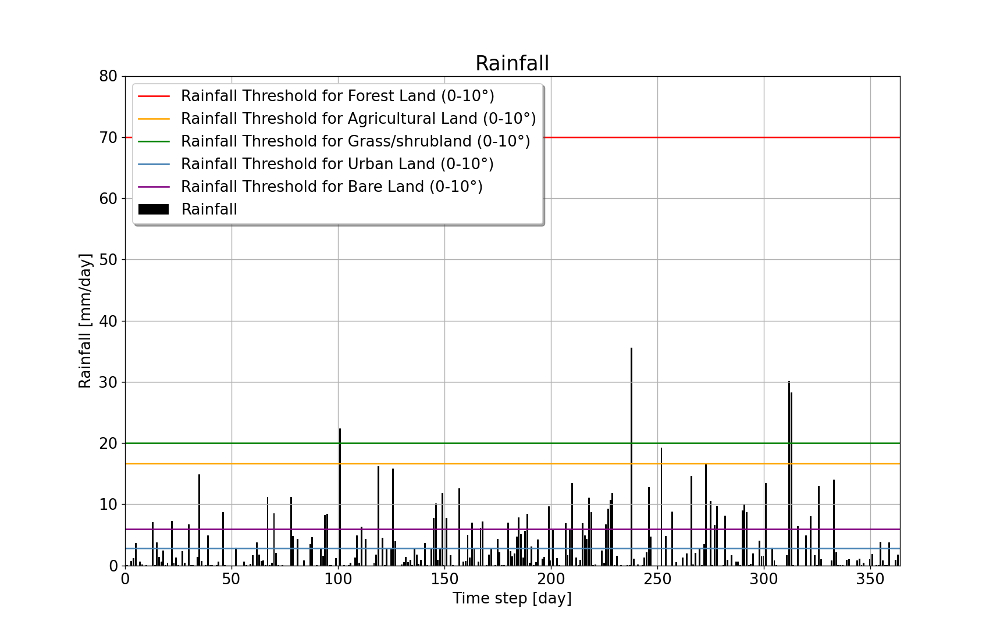

In [53]:
# Create a new figure:
plt.figure(figsize=[11,7])

# Title for the plot:
plt.title("Rainfall", size = 20)

# Add grid lines: 
plt.grid()

# Plot the rainfall values:
plt.bar(Time, rainfall_value, color = 'black')

# Plot the rainfall threshold values for each type of land use with terrain slopes between 0 and 10°:
plt.plot(Time, (R_T_F_1/RC_forest_value), color = 'red')
plt.plot(Time, (R_T_A_1/RC_agricul_value), color = 'orange')
plt.plot(Time, (R_T_G_1/RC_grass_value), color = 'green')
plt.plot(Time, (R_T_U_1/RC_urban_value), color = 'steelblue')
plt.plot(Time, (R_T_B_1/RC_bare_value), color = 'purple')

# Add a legend:
plt.legend(('Rainfall Threshold for Forest Land (0-10°)', 'Rainfall Threshold for Agricultural Land (0-10°)', \
            'Rainfall Threshold for Grass/shrubland (0-10°)', 'Rainfall Threshold for Urban Land (0-10°)', \
            'Rainfall Threshold for Bare Land (0-10°)', 'Rainfall'), prop={'size': 15}, loc = 2, shadow = True)

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize=15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('Rainfall [mm/day]', size = 15)

# Limits of the axes:
plt.xlim([ 0, 364])
plt.ylim([0, 80])

# Show the plot:
plt.show()

In [54]:
# Make a 3D R_speed[i,j,t] array using the surface runoff coefficients, which translate the rainfall values into surface
# runoff values:

R_speed = np.empty((n_row,n_col,Time_range))

for t in Time:
      
    for i in np.arange(0,n_row,1):
                
        for j in np.arange(0,n_col,1):
            
            if(LU[i,j] == 0):              # River
                
                R_speed[i,j,t] = 0       
            
            if(LU[i,j] == 100):            # Bare land
                
                R_speed[i,j,t] = rainfall_value[t] * RC_bare
            
            if(LU[i,j] == 200):            # Forest
                        
                R_speed[i,j,t] = rainfall_value[t] * RC_forest
            
            if(LU[i,j] == 300):            # Agricultural land
            
                R_speed[i,j,t] = rainfall_value[t] * RC_agricul
            
            if(LU[i,j] == 400):            # Urban land
            
                R_speed[i,j,t] = rainfall_value[t] * RC_urban
            
            if(LU[i,j] == 500):            # Grass/shrubland
                
                R_speed[i,j,t] = rainfall_value[t] * RC_grass


In [55]:
# Make a movie showing the surface runoff speed maps through time:

fig, ax = plt.subplots(figsize=[9,7])

def R_speed_animate(t):
    
    # Give title to the plot:
    ax.set_title('Surface runoff fluxes at t = %d' %(t), size = 20)
        
    # Create a mesh:
    xx, yy = np.meshgrid(lon_arc, lat_arc)

    # Plot the mesh:
    ax.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')
      
    # Plot colors that correspond to the surface runoff values at t:
    c = ax.pcolormesh(x, y, R_speed[:,:,t], edgecolors='black', linewidths=1, vmin=np.min(R_speed), vmax=np.max(R_speed), \
                      cmap='Reds')

    # Colorbar:
    div = make_axes_locatable(ax)
    cax1 = div.append_axes('right', size='5%', pad=0.5)
    cbar = plt.colorbar(c, cax=cax1)
    cbar.set_label('Surface runoff flux [mm/day]', size = 15)
    
    # Step sizes for the axes:
    ax.set_xticks(lon_arc)
    ax.set_yticks(lat_arc)

    # Titels for the axes: 
    ax.set_xlabel('Longitude  [arcseconds]', size = 15)
    ax.set_ylabel('Latitude  [arcseconds]', size = 15)
    
    return ax

anim = matplotlib.animation.FuncAnimation(fig, R_speed_animate, frames = Time)

plt.show()

<IPython.core.display.Javascript object>

In [56]:
# Make a surface runoff direction array by simply copying the surface runoff directions on land (from the q array) and assign
# zero's to the river grid cells. We assign zero's to the river grid cells, because the Plastic PathFinder is not designed to 
# simulate plastic transport in the river.

R_dir = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (LU[i,j] == 0):           # River grid cells are coded with LU = 0
            R_dir[i,j] = 0           # no surface runoff        
        else:
            R_dir[i,j] = q[i,j]

print('R_dir:')
print(R_dir)


R_dir:
[[1003. 1003. 1003. 1003.    0.    0. 1007. 1007. 1007. 1007.]
 [1005. 1005. 1002. 1003.    0.    0. 1007. 1005. 1005. 1005.]
 [1003. 1002. 1003.    0.    0.    0. 1007. 1007. 1000. 1000.]
 [1002. 1003.    0.    0.    0.    0. 1007. 1000. 1007. 1007.]
 [1003.    0.    0. 1007.    0.    0.    0. 1007. 1000. 1007.]
 [1003.    0.    0. 1007.    0.    0.    0.    0. 1007. 1000.]
 [   0.    0. 1007. 1003.    0.    0. 1007.    0.    0. 1001.]
 [   0. 1007. 1003. 1003.    0.    0. 1007. 1005.    0.    0.]
 [   0. 1007. 1003. 1003.    0.    0. 1007. 1004. 1005.    0.]
 [1005. 1004. 1003. 1003.    0.    0. 1007. 1007. 1004. 1005.]]


In [57]:
# Make a movie showing the surface runoff speed and direction maps through time:

fig, ax = plt.subplots(figsize=[9,7])

def R_speed_animate(t):
    
    # Give title to the plot:
    ax.set_title('Surface runoff fluxes at t = %d' %(t), size = 20)
    
    # Create a mesh:
    xx, yy = np.meshgrid(lon_arc, lat_arc)

    # Plot the mesh:
    ax.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')
    
    # Plot colors that correspond to the surface runoff values at t:
    c = ax.pcolormesh(x, y, R_speed[:,:,t], edgecolors='black', linewidths=1, vmin=np.min(R_speed), vmax=np.max(R_speed), \
                      cmap='Reds')

    # Colorbar:
    div = make_axes_locatable(ax)
    cax1 = div.append_axes('right', size='5%', pad=0.5)
    cbar = plt.colorbar(c, cax=cax1)
    cbar.set_label('Surface runoff flux [mm/day]', size = 15)
    
    # Plot vectors that correspond to the surface runoff directions:
    ax.quiver(xx, yy, U, V, color = 'black', pivot='tail', scale = 20)
         
    # Define the step sizes on the x and y axes:
    ax.set_xticks(lon_arc)
    ax.set_yticks(lat_arc)

    # Titels for the axes: 
    ax.set_xlabel('Longitude  [arcseconds]', size = 15)
    ax.set_ylabel('Latitude  [arcseconds]', size = 15)
    
    return ax

anim = matplotlib.animation.FuncAnimation(fig, R_speed_animate, frames = Time)

plt.show()

<IPython.core.display.Javascript object>

In [58]:
############################################################################################################################
#################################### S U R F A C E  R U N O F F  T H R E S H O L D S #######################################
############################################################################################################################

In [59]:
# Here the Surface runoff Thresholds (R_T) are calculated:

# The surface runoff threshold values are stored in ParVal[9] to ParVal[58] at the top of the program and can be set by
# the user

R_T_lus = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        slope_rad    = np.arctan(Q[i,j])
        
        # River:
        if(LU[i,j] == 0):              
            R_T_lus[i,j] = R_T_R        
        
        # Bare land:
        if(LU[i,j] == 100):                      
            if(slope_rad >= 0): # cell is surrounded by cells with higher topographies
                R_T_lus[i,j] = R_T_B_0
            if(slope_rad >= -0.17 and slope_rad < 0):
                R_T_lus[i,j] = R_T_B_1
            if(slope_rad >= -0.35 and slope_rad < -0.17):
                R_T_lus[i,j] = R_T_B_2
            if(slope_rad >= -0.52 and slope_rad < -0.35):
                R_T_lus[i,j] = R_T_B_3
            if(slope_rad >= -0.70 and slope_rad < -0.52):
                R_T_lus[i,j] = R_T_B_4
            if(slope_rad >= -0.87 and slope_rad < -0.70):
                R_T_lus[i,j] = R_T_B_5
            if(slope_rad >= -1.05 and slope_rad < -0.87):
                R_T_lus[i,j] = R_T_B_6
            if(slope_rad >= -1.22 and slope_rad < -1.05):
                R_T_lus[i,j] = R_T_B_7
            if(slope_rad >= -1.40 and slope_rad < -1.22):
                R_T_lus[i,j] = R_T_B_8
            if(slope_rad >= -1.57 and slope_rad < -1.40):
                R_T_lus[i,j] = R_T_B_9
        
        # Forest:
        if(LU[i,j] == 200):            
            if(slope_rad >= 0): # cell is surrounded by cells with higher topographies
                R_T_lus[i,j] = R_T_F_0
            if(slope_rad >= -0.17 and slope_rad < 0):
                R_T_lus[i,j] = R_T_F_1
            if(slope_rad >= -0.35 and slope_rad < -0.17):
                R_T_lus[i,j] = R_T_F_2
            if(slope_rad >= -0.52 and slope_rad < -0.35):
                R_T_lus[i,j] = R_T_F_3
            if(slope_rad >= -0.70 and slope_rad < -0.52):
                R_T_lus[i,j] = R_T_F_4
            if(slope_rad >= -0.87 and slope_rad < -0.70):
                R_T_lus[i,j] = R_T_F_5
            if(slope_rad >= -1.05 and slope_rad < -0.87):
                R_T_lus[i,j] = R_T_F_6
            if(slope_rad >= -1.22 and slope_rad < -1.05):
                R_T_lus[i,j] = R_T_F_7
            if(slope_rad >= -1.40 and slope_rad < -1.22):
                R_T_lus[i,j] = R_T_F_8
            if(slope_rad >= -1.57 and slope_rad < -1.40):
                R_T_lus[i,j] = R_T_F_9        
        
        # Agricultural land:
        if(LU[i,j] == 300):            
            if(slope_rad >= 0): # cell is surrounded by cells with higher topographies
                R_T_lus[i,j] = R_T_A_0
            if(slope_rad >= -0.17 and slope_rad < 0):
                R_T_lus[i,j] = R_T_A_1
            if(slope_rad >= -0.35 and slope_rad < -0.17):
                R_T_lus[i,j] = R_T_A_2
            if(slope_rad >= -0.52 and slope_rad < -0.35):
                R_T_lus[i,j] = R_T_A_3
            if(slope_rad >= -0.70 and slope_rad < -0.52):
                R_T_lus[i,j] = R_T_A_4
            if(slope_rad >= -0.87 and slope_rad < -0.70):
                R_T_lus[i,j] = R_T_A_5
            if(slope_rad >= -1.05 and slope_rad < -0.87):
                R_T_lus[i,j] = R_T_A_6
            if(slope_rad >= -1.22 and slope_rad < -1.05):
                R_T_lus[i,j] = R_T_A_7
            if(slope_rad >= -1.40 and slope_rad < -1.22):
                R_T_lus[i,j] = R_T_A_8
            if(slope_rad >= -1.57 and slope_rad < -1.40):
                R_T_lus[i,j] = R_T_A_9        
        
        # Urban land:
        if(LU[i,j] == 400):            
            if(slope_rad >= 0): # cell is surrounded by cells with higher topographies
                R_T_lus[i,j] = R_T_U_0
            if(slope_rad >= -0.17 and slope_rad < 0):
                R_T_lus[i,j] = R_T_U_1
            if(slope_rad >= -0.35 and slope_rad < -0.17):
                R_T_lus[i,j] = R_T_U_2
            if(slope_rad >= -0.52 and slope_rad < -0.35):
                R_T_lus[i,j] = R_T_U_3
            if(slope_rad >= -0.70 and slope_rad < -0.52):
                R_T_lus[i,j] = R_T_U_4
            if(slope_rad >= -0.87 and slope_rad < -0.70):
                R_T_lus[i,j] = R_T_U_5
            if(slope_rad >= -1.05 and slope_rad < -0.87):
                R_T_lus[i,j] = R_T_U_6
            if(slope_rad >= -1.22 and slope_rad < -1.05):
                R_T_lus[i,j] = R_T_U_7
            if(slope_rad >= -1.40 and slope_rad < -1.22):
                R_T_lus[i,j] = R_T_U_8
            if(slope_rad >= -1.57 and slope_rad < -1.40):
                R_T_lus[i,j] = R_T_U_9        
        
        # Grass/shrubland:
        if(LU[i,j] == 500):            
            if(slope_rad >= 0): # cell is surrounded by cells with higher topographies
                R_T_lus[i,j] = R_T_G_0
            if(slope_rad >= -0.17 and slope_rad < 0):
                R_T_lus[i,j] = R_T_G_1
            if(slope_rad >= -0.35 and slope_rad < -0.17):
                R_T_lus[i,j] = R_T_G_2
            if(slope_rad >= -0.52 and slope_rad < -0.35):
                R_T_lus[i,j] = R_T_G_3
            if(slope_rad >= -0.70 and slope_rad < -0.52):
                R_T_lus[i,j] = R_T_G_4
            if(slope_rad >= -0.87 and slope_rad < -0.70):
                R_T_lus[i,j] = R_T_G_5
            if(slope_rad >= -1.05 and slope_rad < -0.87):
                R_T_lus[i,j] = R_T_G_6
            if(slope_rad >= -1.22 and slope_rad < -1.05):
                R_T_lus[i,j] = R_T_G_7
            if(slope_rad >= -1.40 and slope_rad < -1.22):
                R_T_lus[i,j] = R_T_G_8
            if(slope_rad >= -1.57 and slope_rad < -1.40):
                R_T_lus[i,j] = R_T_G_9        

print('R_T_lus:')
print(R_T_lus)

R_T_lus:
[[3. 3. 3. 3. 0. 0. 3. 3. 3. 3.]
 [5. 5. 7. 7. 0. 0. 5. 2. 2. 2.]
 [2. 2. 7. 0. 0. 0. 5. 2. 2. 2.]
 [2. 2. 0. 0. 0. 0. 5. 5. 5. 5.]
 [4. 0. 0. 4. 0. 0. 0. 4. 4. 4.]
 [4. 0. 0. 4. 0. 0. 0. 0. 4. 4.]
 [0. 0. 4. 4. 0. 0. 7. 0. 0. 4.]
 [0. 5. 2. 2. 0. 0. 7. 7. 0. 0.]
 [0. 5. 2. 2. 0. 0. 7. 2. 2. 0.]
 [7. 5. 5. 5. 0. 0. 7. 2. 2. 5.]]


<IPython.core.display.Javascript object>


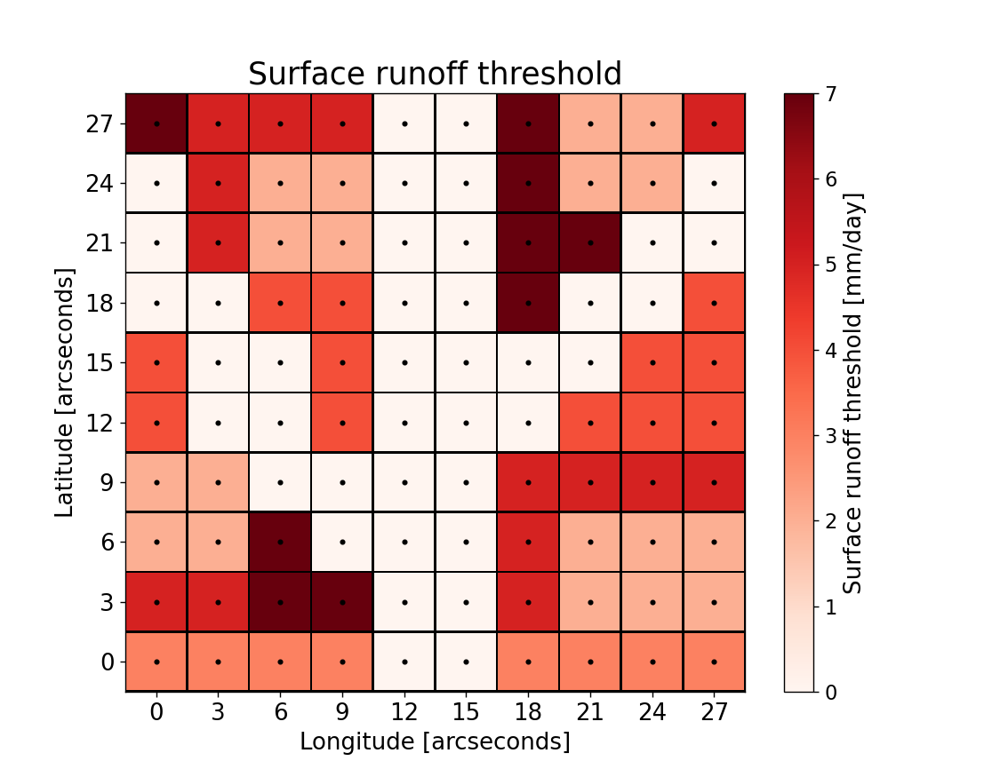

In [60]:
# Make a plot showing the surface runoff thresholds map:

# Create a new figure:
plt.figure(figsize=[9,7])

# Title for the plot:
plt.title("Surface runoff threshold", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the surface runoff threshold values:
c = plt.pcolormesh(x, y, R_T_lus, edgecolors='black', linewidths=1, vmin=np.min(R_T_lus), vmax=np.max(R_T_lus), cmap = 'Reds')

# Add a color scale bar:
cbar = plt.colorbar()

# Assign a label to the color scale bar:
cbar.set_label('Surface runoff threshold [mm/day]', size = 15)
cbar.ax.tick_params(labelsize = 13)

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [61]:
###########################################################################################################################
### Wind and (rainfall) surface runoff conditions combined in one movie and graph #########################################
###########################################################################################################################

In [62]:
# Make a movie showing the wind and surface runoff directions through time:

fig, ax = plt.subplots(figsize=[9,9])

def W_and_R_dir_animate(t):
    
    # Give title to the plot:
    ax.set_title('Wind transport directions (black) and surface runoff directions (blue) at t = %d' %(t), size = 15)
    
    # Create a mesh:
    xx, yy = np.meshgrid(lon_arc, lat_arc)

    # Plot the mesh:
    ax.plot(xx, yy, marker = '.', markersize = 5, color = 'black', linestyle = 'none')
    
    # Plot colors that correspond to land use id's:
    c = plt.pcolormesh(x, y, LU, edgecolors = 'black', linewidths = 1, cmap = 'tab10')
        
    # Plot vectors that correspond to the wind transport directions on t:
    ax.quiver(xx, yy, u[:,:,t], v[:,:,t], color = 'black', pivot = 'tail', scale = 20)
    
    # Plot vectors that correspond to the surface runoff directions on land (i.e. the steepest terrain slope directions):
    ax.quiver(xx, yy, U, V, color = 'blue', pivot = 'tail', scale = 20)
    
    # Step sizes for the axes:
    ax.set_xticks(lon_arc)
    ax.set_yticks(lat_arc)

    # Titels for the axes: 
    ax.set_xlabel('Longitude  [arcseconds]', size = 15)
    ax.set_ylabel('Latitude  [arcseconds]', size = 15)
    
    return ax

anim = matplotlib.animation.FuncAnimation(fig, W_and_R_dir_animate, frames = Time)

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


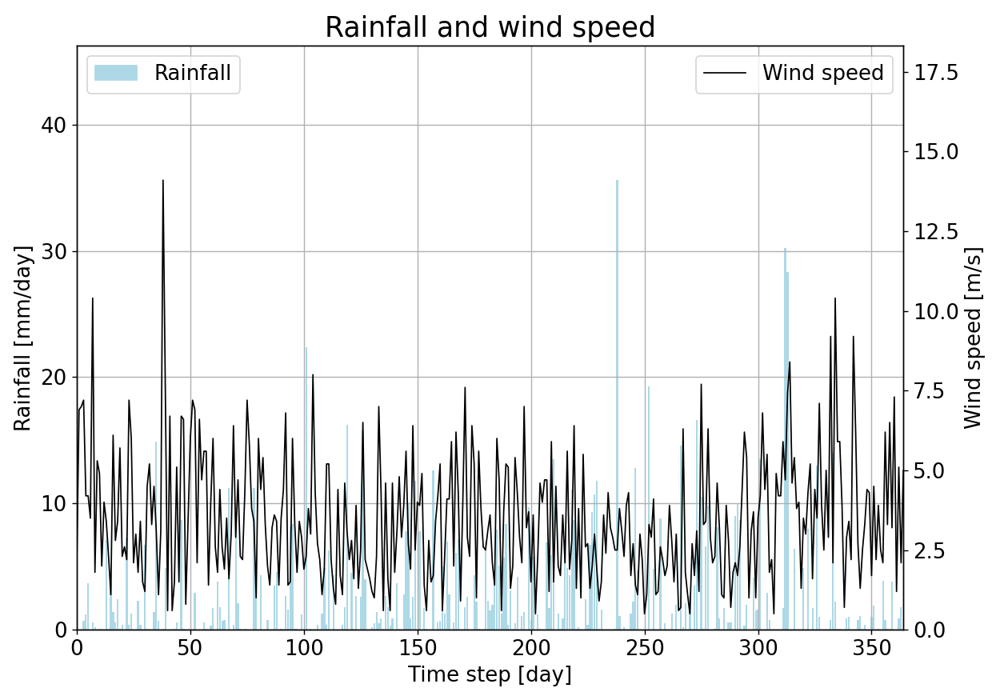

In [63]:
# Create a new figure:
fig, ax1 = plt.subplots(figsize=[10,7])

# Title for the plot:
plt.title("Rainfall and wind speed", size = 20)

# Add grid lines:
plt.grid()

#-------------------------------------------------------------------------------------------------

# For the common x-axis:

# Title x-axis:
ax1.set_xlabel('Time step [day]', size = 15)

# Step sizes x-axis:
ax1.tick_params(axis = 'x', labelsize = 15, labelcolor = 'black')

# Limits the the x-axis:
ax1.set_xlim(0, 364)

#-------------------------------------------------------------------------------------------------

# For the left y-axis:

# Title for left y-axis:
ax1.set_ylabel('Rainfall [mm/day]', size = 15, color = 'black')

# Plot the rainfall values:
ax1.bar(Time, rainfall_value, color = 'lightblue', linewidth = 1)

# Step sizes for left y-axis:
ax1.tick_params(axis = 'y', labelsize = 15, labelcolor = 'black')

# Limits of the left y-axis:
ax1.set_ylim(0, (np.max(rainfall_value)+0.3*np.max(rainfall_value)))

#-------------------------------------------------------------------------------------------------

# Re-use the x-axis:
ax2 = ax1.twinx()

#-------------------------------------------------------------------------------------------------

# For the right y-axis:

# Title for right y-axis:
ax2.set_ylabel('Wind speed [m/s]', size = 15, color = 'black')

# Plot the wind speed values:
ax2.plot(Time, w_speed_value, color = 'black', linewidth = 1 )

# Step sizes for right y-axis:
ax2.tick_params(axis = 'y', labelsize = 15, labelcolor = 'black')

# Limits of the right y-axis:
ax2.set_ylim(0, (np.max(w_speed_value)+0.3*np.max(w_speed_value)))

#-------------------------------------------------------------------------------------------------

fig.tight_layout()

# Add a legend:
#plt.legend(['Wind speed'] , prop = {'size': 15}, loc = 1)

#colors = {'Rainfall':'lightblue'}         
#labels = list(colors.keys())
#handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
#plt.legend(handles, labels, prop = {'size': 15}, loc = 2)

legend1 = plt.legend(['Wind speed'] , prop = {'size': 15}, loc = 1)
colors = {'Rainfall':'lightblue'}         
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels, prop = {'size': 15}, loc = 2)
plt.gca().add_artist(legend1)

# Show the plot:
plt.show()

In [64]:
############################################################################################################################
########################################## M O B I L I S A T I O N  M A P S ################################################
############################################################################################################################

In [65]:
# Check where and at which time steps the wind and/or surface runoff thresholds are passed:

Check = np.zeros((n_row, n_col, Time_range))

for t in Time:

    for i in np.arange(0,n_row,1):

        for j in np.arange(0,n_col,1):

            if (LU[i,j] == 0):          # in river
                
                Check[i,j,t] = 0
            
            else:
            
                if(W_T == 1):     # the wind threshold only depends on the land use (use 'W_T_lu' array)

                    if(W_speed[i,j,t] >= W_T_lu[i,j] and R_speed[i,j,t] < R_T_lus[i,j]):        # the wind threshold is passed
                        Check[i,j,t] = 10
                        continue

                    if(R_speed[i,j,t] >= R_T_lus[i,j] and W_speed[i,j,t] < W_T_lu[i,j]):        # the surface runoff threshold is passed
                        Check[i,j,t] = 20
                        continue

                    if(W_speed[i,j,t] >= W_T_lu[i,j] and R_speed[i,j,t] >= R_T_lus[i,j]):       # both thresholds are passed
                        Check[i,j,t] = 30
                        continue

                    if(W_speed[i,j,t] < W_T_lu[i,j] and R_speed[i,j,t] < R_T_lus[i,j]):         # no thresholds are passed
                        Check[i,j,t] = 40
                        continue


                if(W_T == 2):   # the wind threshold depends on both the land use and the slope (use 'W_T_lus' array)

                    if(W_speed[i,j,t] >= W_T_lus[i,j,t] and R_speed[i,j,t] < R_T_lus[i,j]):     # the wind threshold is passed
                        Check[i,j,t] = 10
                        continue

                    if(R_speed[i,j,t] >= R_T_lus[i,j] and W_speed[i,j,t] < W_T_lus[i,j,t]):     # the runoff threshold is passed
                        Check[i,j,t] = 20
                        continue

                    if(W_speed[i,j,t] >= W_T_lus[i,j,t] and R_speed[i,j,t] >= R_T_lus[i,j]):    # both thresholds are passed
                        Check[i,j,t] = 30
                        continue

                    if(W_speed[i,j,t] < W_T_lus[i,j,t] and R_speed[i,j,t] < R_T_lus[i,j]):      # no thresholds are passed
                        Check[i,j,t] = 40
                        continue

In [66]:
# Make a movie showing the mobilisation maps through time:

fig, ax = plt.subplots(figsize=[9,7])

def W_and_R_thresholds_animate(t):
    
    # Give title to the plot:
    ax.set_title('Which threshold values are passed at t = %d?' %(t), size = 20)
    
    # Create a mesh:
    xx, yy = np.meshgrid(lon_arc, lat_arc)

    # Plot the mesh:
    ax.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')
    
    # Plot colors that correspond to the Check values at t:
    c = ax.pcolormesh(x, y, Check[:,:,t], edgecolors='black', linewidths=1, cmap='tab20c')

    # Colorbar:
    div = make_axes_locatable(ax)
    cax1 = div.append_axes('right', size='5%', pad=0.5)
    cbar = plt.colorbar(c, cax=cax1)
    cbar.set_label('10 = only wind, 20 = only surface runoff, 30 = both, 40 = none', size = 15)
    
    # Step sizes for the axes:
    ax.set_xticks(lon_arc)
    ax.set_yticks(lat_arc)

    # Titels for the axes: 
    ax.set_xlabel('Longitude  [arcseconds]', size = 15)
    ax.set_ylabel('Latitude  [arcseconds]', size = 15)
    
    return ax

anim = matplotlib.animation.FuncAnimation(fig, W_and_R_thresholds_animate, frames = Time)

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


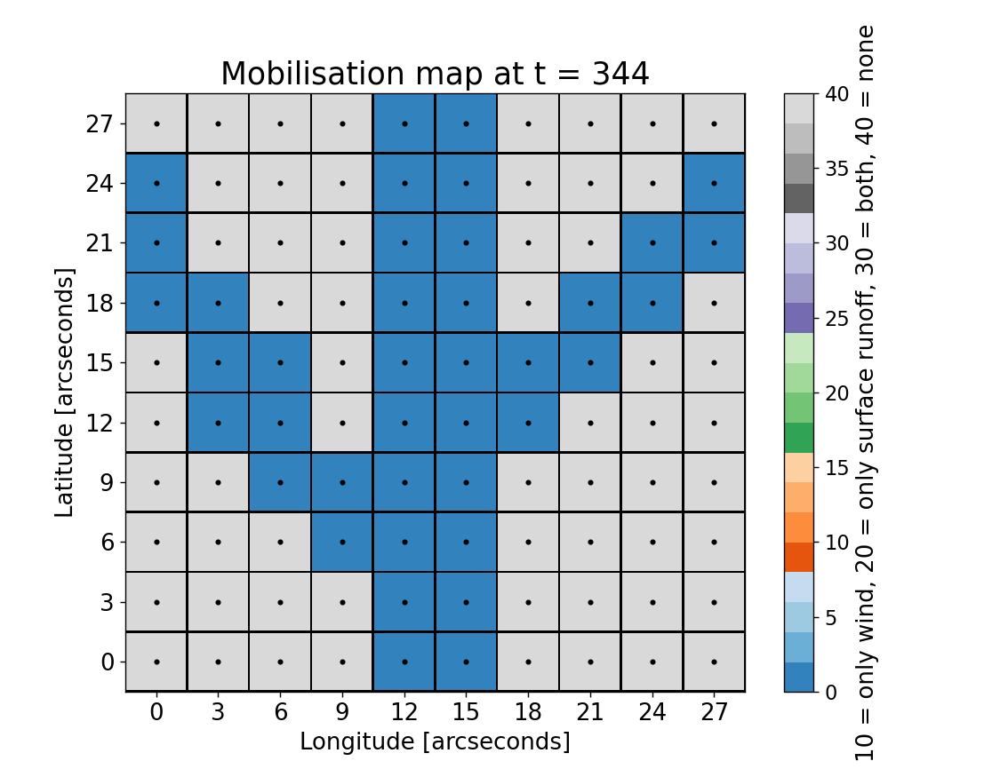

In [67]:
# Make a plot showing the mobilisation map for a single time step:

# Create a new figure:
plt.figure(figsize=[9,7])

t = 344

# Title for the plot:
plt.title('Mobilisation map at t = %d' %(t), size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the Check values at t:
c = plt.pcolormesh(x, y, Check[:,:,t], edgecolors='black', linewidths=1, cmap='tab20c')

# Add a color scale bar:
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize = 13)

# Assign labels to the color scale bar:
cbar.set_label('10 = only wind, 20 = only surface runoff, 30 = both, 40 = none', size = 15)

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [68]:
############################################################################################################################
######################## M I S M A N A G E D  P L A S T I C  W A S T E  G E N E R A T I O N ################################
############################################################################################################################

In [69]:
# We use a simple equation introduced by Lebreton and Andrady (2019) to calculate for each grid cell the mass of
# Mismanaged Plastic Waste (MPW):

# Total plastic waste generated in grid cell x in 1 year, A(x), is calcuated as follows:

# A_yearly(x) = PP  *  MSW_capita  *  Y(x)

# where PP is the average Proportion of Plastic in solid waste 
# MSW_capita is the amount of Municipal Solid Waste (MSW) generated per capita per year
# Y(x) is the number of people living in grid cell x


# Only a fraction of A_yearly(x) is MISMANAGED, i.e. enters the natural environment, we call this the MPW production of 
# grid cell x in 1 year and is calculated as follows:

# MPW_yearly(x) = MWF  *  A_yearly(x)

# where MWF is the Mismanaged Waste Fraction

# Here, we use (see ParVal array at the top of the program):
# PP          = 0.19                --> which is the plastic fraction value for the Netherlands (Lebreton & Andrady, 2019)
# MSW_capita  = 526 kg per year     --> which is the MS_c value for the Netherlands             (Lebreton & Andrady, 2019)
# MWF         = 0.01                --> which is the mismanaged fraction for the Netherlands    (Lebreton & Andrady, 2019)


# In order to obtain the MPW production in grid cell x per day:

# MPW(x) = MPW_yearly(x) / 365


#---------------------------------------------------------------------------------------------------------------------------

# ASSUMPTIONS!!!

# As mentioned by Lebreton and Andrady, the amount of municipal solid waste generated per capita differs between urban
# and rural areas. However, the dataset that they made available only contains one MS_c value per country and not the
# MS_c for rural and the MS_c for urban areas... Therefore, our model does not distuinshing between the MSW generation
# in urban or rural areas and assumes that all people, regardless of where they live, generate the same amount of 
# municipal solid waste.
    
# We assume that the amount of MPW generated in 1 grid cell is the same each day. We divided the total amount of MPW
# generated in 1 grid cell in 1 year by 365 to obtain the daily MPW production. This means that the MPW input is the
# same for each time step.

#---------------------------------------------------------------------------------------------------------------------------

MPW_input_map = np.zeros((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
            
            MPW_input_map[i,j] = ( MWF * PP * MSW_capita * Y[i,j] )  /  ( 365 )

MPW_input_map = np.round(MPW_input_map, 2)            

print('Daily MPW_input_map:')
print(MPW_input_map[:,:])

Daily MPW_input_map:
[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.01 0.   0.   0.   0.   0.   0.01 0.11 0.14 0.14]
 [0.08 0.08 0.   0.   0.   0.   0.   0.11 0.11 0.11]
 [0.08 0.08 0.   0.   0.   0.   0.   0.   0.01 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.05 0.05 0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.05 0.05 0.   0.   0.   0.03 0.03 0.  ]
 [0.   0.01 0.   0.01 0.   0.   0.   0.03 0.03 0.  ]]


In [70]:
# Make 3D array that contains the plastic input arrays for all timesteps:

p_conc_INPUT = np.empty((n_row,n_col,Time_range))

for t in Time:
          
    p_conc_INPUT[:,:,t] = MPW_input_map[:,:]    # we assume that the MPW input is the same for each time step!

print('MPW generation map for t = 100:')
print(p_conc_INPUT[:,:,100])

MPW generation map for t = 100:
[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.01 0.   0.   0.   0.   0.   0.01 0.11 0.14 0.14]
 [0.08 0.08 0.   0.   0.   0.   0.   0.11 0.11 0.11]
 [0.08 0.08 0.   0.   0.   0.   0.   0.   0.01 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.05 0.05 0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.05 0.05 0.   0.   0.   0.03 0.03 0.  ]
 [0.   0.01 0.   0.01 0.   0.   0.   0.03 0.03 0.  ]]


<IPython.core.display.Javascript object>


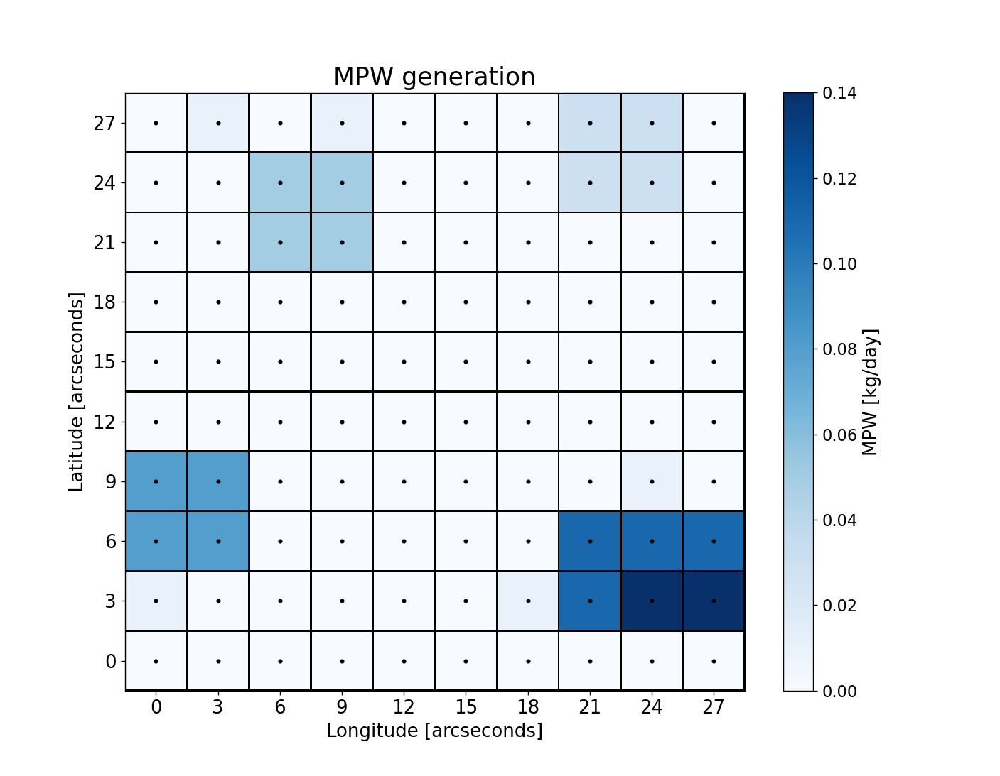

In [71]:
# Make a plot showing the MPW input map:

# Create a new figure:
plt.figure(figsize=[9,7])

# Title for the plot:
plt.title("MPW generation", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
plt.plot(xx, yy, marker='.', markersize=5, color='black', linestyle='none')

# Plot colors that correspond to the MPW input values:
c = plt.pcolormesh(x, y, MPW_input_map[:,:], edgecolors='black', linewidths=1, vmin=np.min(MPW_input_map), \
                   vmax=np.max(MPW_input_map), cmap = 'Blues')

# Add a color scale bar:
cbar = plt.colorbar()

# Assign labels to the color scale bar:
cbar.set_label('MPW [kg/day]', size = 15)
cbar.ax.tick_params(labelsize = 13)

# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [72]:
IN = np.empty(Time_range)

for t in Time:
          
    IN[t] = np.sum(MPW_input_map[:,:])

<IPython.core.display.Javascript object>


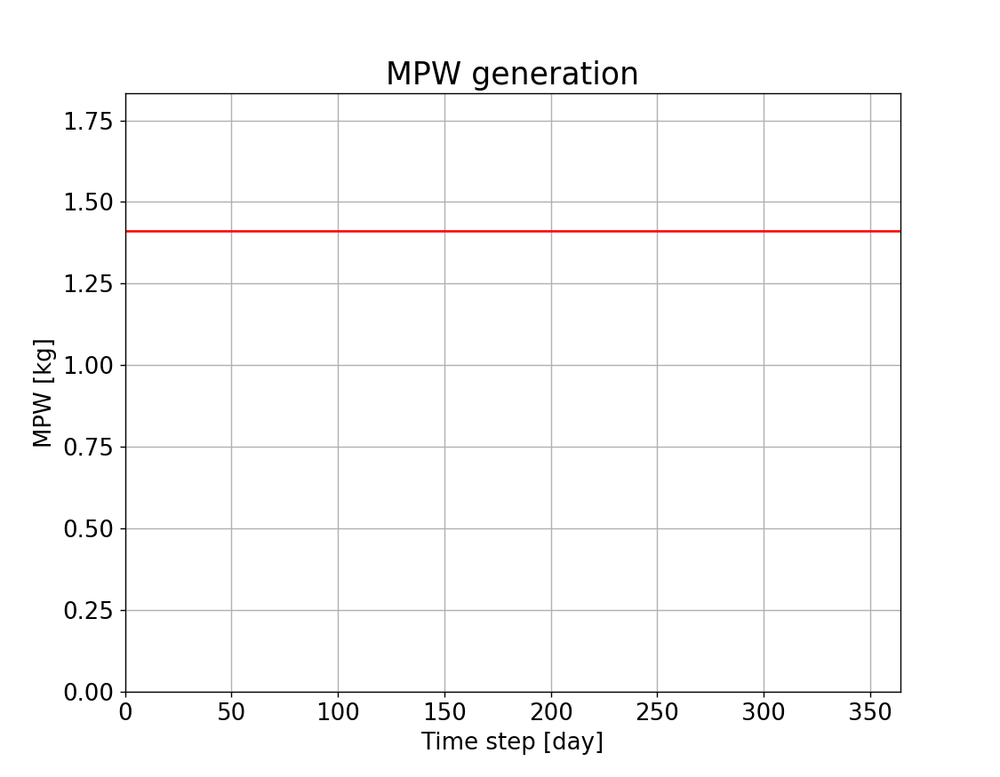

In [73]:
# Make a graph showing the MPW input for each time step:

# Create a new figure:
plt.figure(figsize= [9,7])

# Title for the plot:
plt.title("MPW generation", size = 20)

# Add grid lines:
plt.grid()

# Plot the MPW daily input values:
plt.plot(Time, IN, color = 'red')

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize = 15)
plt.tick_params(axis='both', which='minor', labelsize = 15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('MPW [kg]', size = 15)

# Limits of the axes:
plt.xlim([ 0, 364])
plt.ylim([0, (np.max(IN)+0.3*np.max(IN))])

# Show the plot:
plt.show()

In [74]:
IN_cum = np.empty(Time_range)
IN_cum = np.cumsum(IN)

<IPython.core.display.Javascript object>


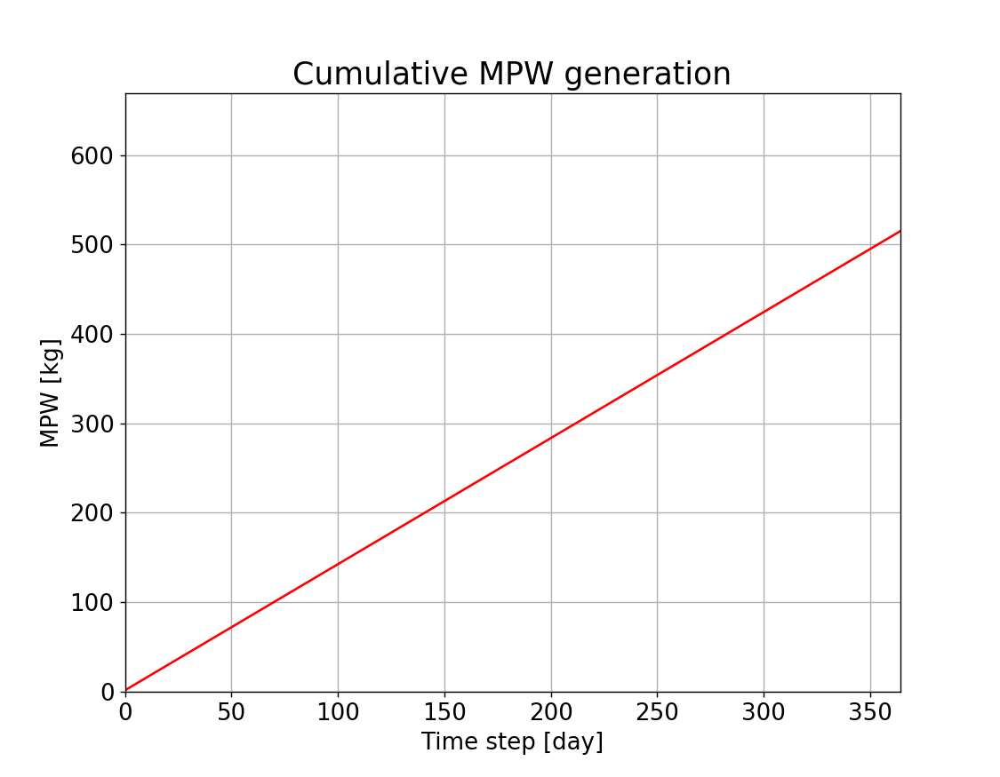

In [75]:
# Make a graph showing the cumulative MPW input for each time step:

# Create a new figure and give it a title:
plt.figure(figsize=[9,7])

# Title for the plot:
plt.title("Cumulative MPW generation", size = 20)

# Add grid lines:
plt.grid()

# Plot the cumulative MPW input values:
plt.plot(Time, IN_cum, color = 'red')

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('MPW [kg]', size = 15)

# Limits of the axes:
plt.xlim([ 0, 364])
plt.ylim([0, (np.max(IN_cum)+0.3*np.max(IN_cum))])

# Show the plot:
plt.show()

In [76]:
############################################################################################################################
############################################################################################################################
############################################################################################################################
############################################################################################################################
######################################### F I N D  T H E  P L A S T I C  P A T H ###########################################
############################################################################################################################
############################################################################################################################
############################################################################################################################
############################################################################################################################

In [77]:
# See User's manual for detailed explaination of the computation of the MPW movements and distributions

p_conc_start        = np.zeros((n_row, n_col, Time_range))
p_conc_end          = np.zeros((n_row, n_col, Time_range))

# For each time step and for each grid cell we will plot the Transport Arrow (TA)
# The zonal component of the TA is stored in the array 'TA_u'
# The meridional component of the TA is stored in the array 'TA_v'
TA_u                = np.zeros((n_row, n_col, Time_range))
TA_v                = np.zeros((n_row, n_col, Time_range))

move_to             = np.empty((n_row, n_col, Time_range))

OUT_coast           = np.zeros(Time_range)
OUT_land            = np.zeros(Time_range)
OUT_total           = np.zeros(Time_range)

Riverine_plastic    = np.zeros(Time_range)
Terrestrial_plastic = np.zeros(Time_range)


for t in Time:

    print('######################################################################################################')
    print('t =', t)
    print('######################################################################################################')

    if (t == 0):
        p_conc_start[:,:,t] = p_conc_INPUT[:,:,t]
        
        print('---------------------------------------------------------------------------------------------')
        print('Start map for t =', t)
        print(p_conc_start[:,:,t])
        print('---------------------------------------------------------------------------------------------')
        
    else:
        p_conc_start[:,:,t] = p_conc_end[:,:,(t-1)] + p_conc_INPUT[:,:,t]

        print('---------------------------------------------------------------------------------------------')
        print('Start map for t =', t)
        print(p_conc_start[:,:,t])
        print('---------------------------------------------------------------------------------------------')
        
    for i in np.arange(0, n_row, 1):

        print(' ')
        print(' ')
        print('i =', i)
        
        for j in np.arange(0, n_col, 1):
            
            print(' ')
            print('j =', j)
            
            if (p_conc_start[i,j,t] == 0):
                
                print('No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.')
                
                # As there is no trash cluster present in this grid cell, there is no Transport Arrow:
                TA_u[i,j,t] = 0
                TA_v[i,j,t] = 0
                
                # As there is no trash cluster present in this grid cell, there is no movement:
                move_to[i,j,t] = 8
                
                continue
            
            else:
                           
                if (LU[i,j] == 0):                     # in river

                    print('This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.')
                    
                    move_to[i,j,t] = 8
            
                else:                                  # on land

                    print('This trash cluster lies on land')
                    print('Wind speed at t =', t, '      :', W_speed[i,j,t])
                    print('Wind speed threshold       :', W_T_lu[i,j])
                    print('Surface runoff at t =', t, ':', R_speed[i,j,t])
                    print('Surface runnoff threshold          :', R_T_lus[i,j])
                
                
                    # Only the wind threshold value is passed:

                    if (Check[i,j,t] == 10):

                        move_to[i,j,t] = W_dir[i,j,t] - 2000

                        print('As you can see, only the wind treshold value is passed during t =', t)


                    # Only the surface runoff threshold value is passed:

                    elif (Check[i,j,t] == 20):

                        move_to[i,j,t] = R_dir[i,j] - 1000

                        print('As you can see, only the surface runoff treshold value is passed here at t =', t)


                    # Both the wind and the surface runoff threshold value are passed:

                    elif (Check[i,j,t] == 30):

                        print('As you can see, both the wind and the surface runoff threshold values are passed here at t =', t)

                        M3 = np.random.randint(2, size=1)

                        print('  M3 =', M3)

                        if (M3 == 0):
                            move_to[i,j,t] = W_dir[i,j,t] - 2000

                        else:
                            move_to[i,j,t] = R_dir[i,j] - 1000

                    # Neither the wind nor the surface runoff threshold value is passed:

                    else:

                        print('As you can see, neither the wind nor the surface runoff treshold value is passed here at t =', t,'go to the next cell')   

                        move_to[i,j,t] = 8

                ############################################################################################################
                
                # Calculate the new location of the trash cluster:

                # READ ME! IMPORTANT! (See User's Manual for detailed explaination) 

                # The changes (+/- 1) for the i and j values that you see below may seem counterintuitive, but remember
                # they are mirrored over the 0 axis, because all data arrays that we use are flipped over the 0 axis! This
                # is because numpy sees the upper left location in an array as i = 0 & j = 0, which does not correspond with 
                # latitude = 0 & longitude = 0. So the i_new and j_new values are "flipped" (and therefore a bit counter-
                # intuitive) because the p_conc map is also a "flipped" array. Later when we plot the "flipped" array, you
                # will see that it results in the correct distribution on a longitude,latitude map.

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 0):
                # The trash cluster moves to the cell in the northwest        

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = -1
                    TA_v[i,j,t] = 1
                    
                    # And the new location indices are:
                    i_new = i + 1
                    j_new = j - 1

                    print('--> During time step', t, 'the trash moves to the cell in the northwest')
                    
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 1):
                # The trash cluster moves to the cell in the north

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = 0
                    TA_v[i,j,t] = 1
                    
                    # And the new location indices are:
                    i_new = i + 1
                    j_new = j

                    print('--> During time step', t, 'the trash moves to the cell in the north')
                                        
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 2):
                # The trash cluster moves to the cell in the northeast        

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = 1
                    TA_v[i,j,t] = 1
                    
                    # And the new location indices are:
                    i_new = i + 1
                    j_new = j + 1

                    print('--> During time step', t, 'the trash moves to the cell in the northeast')
                    
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 3):
                # The trash cluster moves to the cell in the east

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = 1
                    TA_v[i,j,t] = 0
                    
                    # And the new location indices are:
                    i_new = i
                    j_new = j + 1

                    print('--> During time step', t, 'the trash moves to the cell in the east')
                    
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 4):
                # The trash cluster moves to the cell in the southeast

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = 1
                    TA_v[i,j,t] = -1
                    
                    # And the new location indices are:
                    i_new = i - 1
                    j_new = j + 1

                    print('--> During time step', t, 'the trash moves to the cell in the southeast')
                    
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 5):
                # The trash cluster moves to the cell in the south

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = 0
                    TA_v[i,j,t] = -1
                    
                    # And the new location indices are:
                    i_new = i - 1
                    j_new = j

                    print('--> During time step', t, 'the trash moves to the cell in the south')
                    
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 6):
                # The trash cluster moves to the cell in the southwest

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = -1
                    TA_v[i,j,t] = -1
                    
                    # And the new location indices are:
                    i_new = i - 1
                    j_new = j - 1

                    print('--> During time step', t, 'the trash moves to the cell in the southwest')
                    
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 7):
                # The trash cluster moves to the cell in the west

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = -1
                    TA_v[i,j,t] = 0
                    
                    # And the new location indices are:
                    i_new = i
                    j_new = j - 1

                    print('--> During time step', t, 'the trash moves to the cell in the west')
                    
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                if (move_to[i,j,t] == 8):
                # The trash cluster does not move

                    # Thus the components of the Transport Arrow are:
                    TA_u[i,j,t] = 0
                    TA_v[i,j,t] = 0
                    
                    # And the new location indices are the same as the old location indices:
                    i_new = i
                    j_new = j

                    print('--> During time step', t, 'the trash does not move, i.e. remains at its current location')
                    
                    print('TA_u  = ', TA_u[i,j,t])
                    print('TA_v  = ', TA_v[i,j,t])
                    
                    print('i_new = ', i_new)
                    print('j_new = ', j_new)

                #-----------------------------------------------------------------------------------------------------------

                ############################################################################################################
                
                # Check if the new location of the plastic (i_new, j_new) falls in- or outside the model domain:

                # The trash cluster leaves the domain:
                if((i_new < 0) or (i_new > (n_row - 1)) or (j_new < 0) or (j_new > (n_col - 1))):

                    print('The trash cluster has left the domain during time step', t)
                    print(' ')

                    # There are 2 ways in which the plastic trash can leave the domain:
                    #  1. it can be emitted to the ocean via the coast     --> OUT_coast
                    #  3. it can be emitted to the adjacent land           --> OUT_land

                    # because the ocean lies in the south (i.e. i = -1) in this toy model:
                    if(i_new == -1):      

                        print('The trash cluster is emitted to the ocean via the COAST during timestep', t)
                        
                        OUT_coast[t] = OUT_coast[t] + p_conc_start[i,j,t]

                    else:

                        print('The trash cluster is emitted to adjacent LAND during timestep', t)
                        
                        OUT_land[t] = OUT_land[t] + p_conc_start[i,j,t]

                    continue        # Go to the next grid cell

                    
                # If the trash remains in the domain, place its new location in the end plastic concentration map of 
                # this timestep:
                              
                else:

                    p_conc_end[i_new,j_new,t]  = p_conc_end[i_new,j_new,t] + p_conc_start[i,j,t]

                    if(LU[i_new, j_new] == 0):

                        print('At the end of time step', t, ', this trash cluster lies in a river grid cell')

                        Riverine_plastic[t] = Riverine_plastic[t] + p_conc_start[i,j,t]

                    else:

                        print('At the end of time step', t, ', this trash cluster lies on a land grid cell')

                        Terrestrial_plastic[t] = Terrestrial_plastic[t] + p_conc_start[i,j,t]

############################################################################################################################                        
                        
    print('End map for t =', t, ':')
    print(p_conc_end[:,:,t])
                        
############################################################################################################################

print(' ')    
print('OUT_coast:')
print(OUT_coast[:])
print(' ')    
print('OUT_land:')
print(OUT_land[:])
print(' ')

for t in Time:
    
    OUT_total[t] = OUT_coast[t] + OUT_land[t]
    
print('OUT_total:')
print(OUT_total[:])

############################################################################################################################

OUT_coast_cum = np.empty(Time_range)
OUT_land_cum  = np.empty(Time_range)
OUT_total_cum = np.empty(Time_range)

OUT_coast_cum = np.cumsum(OUT_coast)
OUT_land_cum  = np.cumsum(OUT_land)
OUT_total_cum = np.cumsum(OUT_total)

print(' ')
print(' ')    
print('OUT_coast_cum:')
print(OUT_coast_cum[:])
print(' ')    
print('OUT_land_cum:')
print(OUT_land_cum[:])
print(' ')
print('OUT_total_cum:')
print(OUT_total_cum[:])

############################################################################################################################

print(' ')
print(' ')
print('Riverine_plastic:')
print(Riverine_plastic[:])
print(' ')
print('Terrestrial_plastic:')
print(Terrestrial_plastic[:])

############################################################################################################################

Present_in_river_basin = np.empty(Time_range)

for t in Time:
    
    Present_in_river_basin[t] = IN_cum[t] - OUT_total_cum[t]

print(' ')
print(' ')
print('Present_in_river_basin:')
print(Present_in_river_basin[:])

######################################################################################################
t = 0
######################################################################################################
---------------------------------------------------------------------------------------------
Start map for t = 0
[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.01 0.   0.   0.   0.   0.   0.01 0.11 0.14 0.14]
 [0.08 0.08 0.   0.   0.   0.   0.   0.11 0.11 0.11]
 [0.08 0.08 0.   0.   0.   0.   0.   0.   0.01 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.05 0.05 0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.05 0.05 0.   0.   0.   0.03 0.03 0.  ]
 [0.   0.01 0.   0.01 0.   0.   0.   0.03 0.03 0.  ]]
---------------------------------------------------------------------------------------------
 
 
i = 0
 
j = 0
No trash cluster present in thi

At the end of time step 2 , this trash cluster lies in a river grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 2       : 7.0
Wind speed threshold       : 13.2
Surface runoff at t = 2 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 2 go to the next cell
--> During time step 2 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  7
At the end of time step 2 , this trash cluster lies on a land grid

At the end of time step 5 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 5       : 4.2
Wind speed threshold       : 8.8
Surface runoff at t = 5 : 2.59
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 5
--> During time step 5 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  8
At the end of time step 5 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 5       : 4.2
Wind speed threshold       : 8.8
Surface runoff at t = 5 : 2.59
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 5
--> During time step 5 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  9
At the end of time step 5 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on l

As you can see, only the wind treshold value is passed during t = 7
--> During time step 7 the trash moves to the cell in the southeast
TA_u  =  1.0
TA_v  =  -1.0
i_new =  7
j_new =  3
At the end of time step 7 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 7       : 10.4
Wind speed threshold       : 8.8
Surface runoff at t = 7 : 0.42
Surface runnoff threshold          : 2.0
As you can see, only the wind treshold value is passed during t = 7
--> During time step 7 the trash moves to the cell in the southeast
TA_u  =  1.0
TA_v  =  -1.0
i_new =  7
j_new =  4
At the end of time step 7 , this trash cluster lies in a river grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 7 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 7

--> During time step 10 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  1
At the end of time step 10 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 10       : 4.9
Wind speed threshold       : 26.4
Surface runoff at t = 10 : 0.009
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 10 go to the next cell
--> During time step 10 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  2
At the end of time step 10 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of 

--> During time step 12 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  2
At the end of time step 12 , this trash cluster lies in a river grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 12       : 4.0
Wind speed threshold       : 13.2
Surface runoff at t = 12 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 12 go to the next cell
--> During time step 12 the trash does not move, i.e. remains

TA_v  =  0.0
i_new =  3
j_new =  2
At the end of time step 14 , this trash cluster lies in a river grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 14       : 2.3
Wind speed threshold       : 13.2
Surface runoff at t = 14 : 0.027
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 14 go to the next cell
--> During time step 14 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  7
At the end of time step 

j = 3
This trash cluster lies on land
Wind speed at t = 16       : 6.1
Wind speed threshold       : 8.8
Surface runoff at t = 16 : 0.9799999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 16 go to the next cell
--> During time step 16 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  3
At the end of time step 16 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 16 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 16 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash clu

Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 19 go to the next cell
--> During time step 19 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  9
At the end of time step 19 , this trash cluster lies on a land grid cell
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 19       : 5.7
Wind speed threshold       : 13.2
Surface runoff at t = 19 : 0.021
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 19 go to the next cell
--> During time step 19 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  0
At the end of time step 19 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 19       : 5.7
Wind speed threshold       : 13.2
Surface runoff 

Wind speed threshold       : 8.8
Surface runoff at t = 21 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 21 go to the next cell
--> During time step 21 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 21 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 21       : 2.6
Wind speed threshold       : 8.8
Surface runoff at t = 21 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 21 go to the next cell
--> During time step 21 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 21 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 21 

i_new =  8
j_new =  9
At the end of time step 23 , this trash cluster lies in a river grid cell
 
 
i = 9
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies on land
Wind speed at t = 23       : 7.2
Wind speed threshold       : 13.2
Surface runoff at t = 23 : 0.12
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 23 go to the next cell
--> During time step 23 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  1
At the end of time step 23 , this trash cluster lies on a land grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
This trash cluster lies on land
Wind speed at t = 23       : 7.2
Wind speed threshold       : 13.2
Surface runoff at t = 23 : 0.12
Surface runnoff threshold         

Surface runoff at t = 26 : 0.0
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 26 go to the next cell
--> During time step 26 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  2
At the end of time step 26 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 26       : 3.0
Wind speed threshold       : 13.2
Surface runoff at t = 26 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 26 go 

j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No 

No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 7
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 30       : 1.2
Wind speed threshold       : 8.8
Surface runoff at t = 30 : 4.6899999999999995
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 30
--> During time step 30 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 30 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 30       : 1.2
Wind speed threshold       : 8.

j_new =  3
At the end of time step 32 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 32 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  6
j_new =  4
At the end of time step 32 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 7
 
j 

j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 34       : 4.5
Wind speed threshold       : 26.4
Surface runoff at t = 34 : 0.13999999999999999
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 34 go to the next cell
--> During time step 34 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 34 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 34       : 4.5
Wind speed threshold       : 8.8
Surface runoff at t = 34 : 0.9799999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 34 go to the next cell
--> During time step 34 the trash does not move, i.e. remains at i

 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
N

TA_v  =  -1.0
i_new =  7
j_new =  8
At the end of time step 38 , this trash cluster lies in a river grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 38       : 14.1
Wind speed threshold       : 8.8
Surface runoff at t = 38 : 0.049
Surface runnoff threshold          : 2.0
As you can see, only the wind treshold value is passed during t = 38
--> During time step 38 the trash moves to the cell in the southeast
TA_u  =  1.0
TA_v  =  -1.0
i_new =  7
j_new =  9
At the end of time step 38 , this trash cluster lies in a river grid cell
 
j = 9
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 38 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  9
At the end of time step 38 , this trash cluster lies in a river grid cell
 
 
i = 9
 
j = 0
No trash cluster present in this grid cell at the beginning of this time 

--> During time step 41 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  7
At the end of time step 41 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 41       : 6.7
Wind speed threshold       : 8.8
Surface runoff at t = 41 : 0.020999999999999998
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 41 go to the next cell
--> During time step 41 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  8
At the end of time step 41 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 41       : 6.7
Wind speed threshold       : 8.8
Surface runoff at t = 41 : 0.020999999999999998
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed

--> During time step 43 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  1
At the end of time step 43 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 43 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  2
At the end of time step 43 , this trash cluster lies in a river grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.


This trash cluster lies on land
Wind speed at t = 45       : 1.5
Wind speed threshold       : 8.8
Surface runoff at t = 45 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 45 go to the next cell
--> During time step 45 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 45 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 45 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 45 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this 

Surface runoff at t = 47 : 0.034999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 47 go to the next cell
--> During time step 47 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  3
At the end of time step 47 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 47 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 47 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This 

TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 49 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 49 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 49 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 49 the trash does not move, i.e. remai

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 51 go to the next cell
--> During time step 51 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  8
At the end of time step 51 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 4
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 51 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  1
At the end of time step 51 , this trash cluster lies in a river grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to

j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 53       : 2.1
Wind speed threshold       : 13.2
Surface runoff at t = 53 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 53 go to the next cell
--> During time step 53 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  6
At the end of time step 53 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 53       : 2.1
Wind speed threshold       : 8.8
Surface runoff at t = 53 : 0.0
Surface runnoff threshold          :

TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  8
At the end of time step 55 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 4
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 55 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  1
At the end of time step 55 , this trash cluster lies in a river grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this 

Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 57 go to the next cell
--> During time step 57 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  1
At the end of time step 57 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 57       : 5.6
Wind speed threshold       : 26.4
Surface runoff at t = 57 : 0.007000000000000001
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 57 go to the next cell
--> During time step 57 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  2
At the end of time step 57 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 57       : 5.6
Wind speed threshold       : 26.4
Surface ru

Surface runoff at t = 59 : 0.03
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 59 go to the next cell
--> During time step 59 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  3
At the end of time step 59 , this trash cluster lies on a land grid cell
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 59       : 4.0
Wind speed threshold       : 13.2
Surface runoff at t = 59 : 0.09
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 59 go to the next cell
--> During time step 59 the trash does not move, i.e. remains at its current location
TA_u

i_new =  6
j_new =  3
At the end of time step 60 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 60 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  6
j_new =  4
At the end of time step 60 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 

As you can see, only the surface runoff treshold value is passed here at t = 62
--> During time step 62 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  8
At the end of time step 62 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 62       : 1.8
Wind speed threshold       : 8.8
Surface runoff at t = 62 : 2.6599999999999997
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 62
--> During time step 62 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  9
At the end of time step 62 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on land
Wind speed at t = 62       : 1.8
Wind speed threshold       : 8.8
Surface runoff at t = 62 : 2.6599999999999997
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here 

j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 6
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
This trash cluster lies on land
Wind speed at t = 63       : 4.4
Wind speed threshold       : 10.0
Surface runoff at t = 63 : 0.36000000000000004
Surface runnoff threshold          : 4.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 63 go to the next cell
--> During time step 63 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  6
j_new =  3
At the end of time step 63 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the

At the end of time step 65 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 65       : 1.9
Wind speed threshold       : 13.2
Surface runoff at t = 65 : 0.24
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 65 go to the next cell
--> During time step 65 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  1
At the end of time step 65 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 65       : 1.9
Wind speed threshold       : 26.4
Surface runoff at t = 65 : 0.08000000000000002
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 65 go to the next cell
--> During time step 65 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i

Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 67
--> During time step 67 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  8
At the end of time step 67 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 67       : 1.6
Wind speed threshold       : 8.8
Surface runoff at t = 67 : 7.839999999999999
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 67
--> During time step 67 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  9
At the end of time step 67 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on land
Wind speed at t = 67       : 1.6
Wind speed threshold       : 8.8
Surface runoff at t = 67 : 7.839999999999999
Surface runnoff threshold          : 2.0
As you can see, only the surfac

i_new =  3
j_new =  8
At the end of time step 68 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 4
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 68 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  1
At the end of time step 68 , this trash cluster lies in a river grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid

--> During time step 69 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  2
At the end of time step 69 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 69       : 6.4
Wind speed threshold       : 8.8
Surface runoff at t = 69 : 0.27999999999999997
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 69 go to the next cell
--> During time step 69 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  3
At the end of time step 69 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 69 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_ne

Surface runoff at t = 70 : 2.55
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 70 go to the next cell
--> During time step 70 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  3
At the end of time step 70 , this trash cluster lies on a land grid cell
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 70       : 2.9
Wind speed threshold       : 26.4
Surface runoff at t = 70 : 0.8500000000000001
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 70 go to the next cell
--> During time step 70 the trash does not move, i.e. remains at its current

At the end of time step 72 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on land
Wind speed at t = 72       : 2.3
Wind speed threshold       : 8.8
Surface runoff at t = 72 : 0.055999999999999994
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 72 go to the next cell
--> During time step 72 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  0
At the end of time step 72 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 72       : 2.3
Wind speed threshold       : 8.8
Surface runoff at t = 72 : 0.055999999999999994
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 72 go to the next cell
--> During time step 72 the trash does not move, i.e. remains at its current location
TA

--> During time step 74 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  1
At the end of time step 74 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 74       : 4.3
Wind speed threshold       : 26.4
Surface runoff at t = 74 : 0.009
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 74 go to the next cell
--> During time step 74 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  2
At the end of time step 74 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 74       : 4.3
Wind speed threshold       : 26.4
Surface runoff at t = 74 : 0.009
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 74 go to the ne

i_new =  9
j_new =  6
At the end of time step 75 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 75       : 7.2
Wind speed threshold       : 8.8
Surface runoff at t = 75 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 75 go to the next cell
--> During time step 75 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  7
At the end of time step 75 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 75       : 7.2
Wind speed threshold       : 8.8
Surface runoff at t = 75 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 75 go to the next cell
--> During time step 75 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.

j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
This trash cluster lies on land
Wind speed at t = 77       : 3.8
Wind speed threshold       : 10.0
Surface runoff at t = 77 : 0.0
Surface runnoff threshold          : 4.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 77 go to the next cell
--> During time step 77 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  6
j_new =  3
At the end of time step 77 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 77 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  6
j_new =  4
At the end of time step 77 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present i

 
j = 7
This trash cluster lies on land
Wind speed at t = 79       : 1.0
Wind speed threshold       : 8.8
Surface runoff at t = 79 : 3.36
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 79
--> During time step 79 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  7
At the end of time step 79 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 79       : 1.0
Wind speed threshold       : 8.8
Surface runoff at t = 79 : 3.36
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 79
--> During time step 79 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  8
At the end of time step 79 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 79       : 1.0
Wind speed threshold       : 8.8
Su

TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  8
At the end of time step 81 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 81       : 4.4
Wind speed threshold       : 6.6
Surface runoff at t = 81 : 2.15
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 81 go to the next cell
--> During time step 81 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  9
At the end of time step 81 , this trash cluster lies on a land grid cell
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 81       : 4.4
Wind speed threshold       : 13.2
Surface runoff at t = 81 : 1.2899999999999998
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 81 go to the next cell
--> During time step 81 the trash does not move, i.e. rem

At the end of time step 83 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 83       : 3.3
Wind speed threshold       : 26.4
Surface runoff at t = 83 : 0.0
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 83 go to the next cell
--> During time step 83 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  2
At the end of time step 83 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 83       : 3.3
Wind speed threshold     

Surface runoff at t = 85 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 85 go to the next cell
--> During time step 85 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 85 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 85       : 1.4
Wind speed threshold       : 8.8
Surface runoff at t = 85 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 85 go to the next cell
--> During time step 85 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 85 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 85       : 1.4
Wind speed threshold 

--> During time step 87 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 87 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 87       : 3.6
Wind speed threshold       : 8.8
Surface runoff at t = 87 : 2.4499999999999997
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 87
--> During time step 87 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =  1.0
i_new =  3
j_new =  2
At the end of time step 87 , this trash cluster lies in a river grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 87       : 3.6
Wind speed threshold       : 26.4
Surface runoff at t = 87 : 0.35000000000000003
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 87 go to the next cell
--> During time step 87 the trash does n

j = 9
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 88 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  9
At the end of time step 88 , this trash cluster lies in a river grid cell
 
 
i = 9
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies on land
Wind speed at t = 88       : 3.4
Wind speed threshold       : 13.2
Surface runoff at t = 88 : 1.38
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 88 go to the next cell
--> During time step 88 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  1
At the end of time step 88 , this trash cluster lies on a land grid cell
 
j = 2
No trash cluste

At the end of time step 90 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
End map for t = 90 :
[[ 0.    0.    0.    0.    0.    2.6   0.    1.98  2.52  2.52]
 [ 0.52  0.24  1.59  0.16  0.    0.    0.52  0.22  0.28  0.28]
 [ 0.16  0.24  0.4   0.    0.    0.    5.5   0.22  0.22  0.22]
 [ 0.16  0.16 19.68  0.    0.    0.    0.    9.24 10.15  0.  ]
 [ 0.    6.72  0.    0.    0.    0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.15  0.75  0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.1   0.15  8.85  0.    0.    0.    5.34  0.15]
 [ 0.    0.    0.1   0.15  8.63  0.    0.    0.06  0.06  2.67]
 [ 0.    0.52  0.    0.52  0.    0.    2.52  0.06  0.06  0.  ]]
######################################################################################################
t = 91
########################################################

j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 93 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  5
At the end of time step 93 , this trash cluster lies in a river grid cell
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next gr

Wind speed at t = 95       : 6.0
Wind speed threshold       : 6.6
Surface runoff at t = 95 : 4.2
Surface runnoff threshold          : 3.0
As you can see, only the surface runoff treshold value is passed here at t = 95
--> During time step 95 the trash moves to the cell in the west
TA_u  =  -1.0
TA_v  =  0.0
i_new =  0
j_new =  6
At the end of time step 95 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 95       : 6.0
Wind speed threshold       : 6.6
Surface runoff at t = 95 : 4.2
Surface runnoff threshold          : 3.0
As you can see, only the surface runoff treshold value is passed here at t = 95
--> During time step 95 the trash moves to the cell in the west
TA_u  =  -1.0
TA_v  =  0.0
i_new =  0
j_new =  7
At the end of time step 95 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 95       : 6.0
Wind speed threshold       : 6.6
Surface runoff at t = 95 : 4.2
Surface runnoff

j_new =  3
At the end of time step 97 , this trash cluster lies on a land grid cell
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 97       : 1.8
Wind speed threshold       : 13.2
Surface runoff at t = 97 : 0.024
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 97 go to the next cell
--> During time step 97 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  6
At the end of time step 97 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 97       : 1.8
Wind speed threshold       : 8.8
Surface runoff at t = 97 : 0.055999999999999994
Surface runnoff threshold          : 2.0

j = 0
This trash cluster lies on land
Wind speed at t = 99       : 2.9
Wind speed threshold       : 8.8
Surface runoff at t = 99 : 0.84
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 99 go to the next cell
--> During time step 99 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  0
At the end of time step 99 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 99       : 2.9
Wind speed threshold       : 8.8
Surface runoff at t = 99 : 0.84
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 99 go to the next cell
--> During time step 99 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 99 , this trash cluster lies on a land grid cel

Surface runoff at t = 101 : 15.679999999999998
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 101
--> During time step 101 the trash moves to the cell in the northwest
TA_u  =  -1.0
TA_v  =  1.0
i_new =  3
j_new =  8
At the end of time step 101 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 101       : 2.3
Wind speed threshold       : 8.8
Surface runoff at t = 101 : 15.679999999999998
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 101
--> During time step 101 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =  1.0
i_new =  4
j_new =  1
At the end of time step 101 , this trash cluster lies in a river grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 101       : 2.3
Wind speed threshold       : 8.8
Surface runoff at t = 101 : 15.679999999999998
Surfa

TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 103 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 103       : 3.0
Wind speed threshold       : 8.8
Surface runoff at t = 103 : 0.063
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 103 go to the next cell
--> During time step 103 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 103 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 103       : 3.0
Wind speed threshold       : 8.8
Surface runoff at t = 103 : 0.063
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 103 go to the next cell
--> During time step 103 the trash does not move, i.e. remain

j_new =  4
At the end of time step 105 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 6
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present

j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 107 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  5
j_new =  4
At the end of time step 107 , this trash cluster lies 

Wind speed threshold       : 8.8
Surface runoff at t = 109 : 3.43
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 109
--> During time step 109 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 109 , this trash cluster lies in a river grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 109 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 109 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid c

i_new =  2
j_new =  2
At the end of time step 111 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 111 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  5
At the end of time step 111 , this trash cluster lies in a river grid cell
 
j = 6
This trash cluster lies on land
Wind speed at t = 111       : 5.2
Wind speed threshold       : 13.2
Surface runoff at t = 111 : 1.89
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 111 go to the next cell
--> During time step 111 the

--> During time step 113 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 113 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 113       : 1.3
Wind speed threshold       : 8.8
Surface runoff at t = 113 : 3.01
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 113
--> During time step 113 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =  1.0
i_new =  3
j_new =  2
At the end of time step 113 , this trash cluster lies in a river grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 113       : 1.3
Wind speed threshold       : 26.4
Surface runoff at t = 113 : 0.43
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 113 go to the next cell
--> During time step 113 the trash does not move, i.e. rema

TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  6
At the end of time step 115 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic 

--> During time step 117 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 117 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 117 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 117 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic t

 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 119 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  5
j_new =  4
At the end of time step 119 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 6
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step.

TA_v  =  0.0
i_new =  4
j_new =  6
At the end of time step 121 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. Th

 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 6
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 123 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  6
j_new =  4
At the end of time step 123 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step.

i_new =  4
j_new =  1
At the end of time step 125 , this trash cluster lies in a river grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 125 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  6
At the end of time step 125 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.

This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 127 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  1
At the end of time step 127 , this trash cluster lies in a river grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 127 the trash does not move, i.e. remains a

j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 6
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
Thi

j = 9
This trash cluster lies on land
Wind speed at t = 131       : 1.0
Wind speed threshold       : 6.6
Surface runoff at t = 131 : 0.25
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 131 go to the next cell
--> During time step 131 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  9
At the end of time step 131 , this trash cluster lies on a land grid cell
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 131       : 1.0
Wind speed threshold       : 13.2
Surface runoff at t = 131 : 0.15
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 131 go to the next cell
--> During time step 131 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  0
At the end of time step 131 , this trash cluster li

j_new =  4
At the end of time step 132 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 132       : 2.3
Wind speed threshold       : 26.4
Surface runoff at t = 132 : 0.13999999999999999
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 132 go to the next cell
--> During time step 132 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 132 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 132       : 2.3
Wind speed threshold       : 8.8
Surface runoff at t = 132 : 0.9799999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here a

TA_v  =  0.0
i_new =  8
j_new =  7
At the end of time step 134 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 134       : 4.3
Wind speed threshold       : 8.8
Surface runoff at t = 134 : 0.63
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 134 go to the next cell
--> During time step 134 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  8
At the end of time step 134 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 134 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  9
At the end of time step 134 , this trash cluster lies in a river grid cell
 
 
i = 9
 
j = 0
No tras

 [ 0.    0.35  0.    0.35  0.63  0.    3.69  0.27  0.27  0.  ]]
######################################################################################################
t = 137
######################################################################################################
---------------------------------------------------------------------------------------------
Start map for t = 137
[[ 0.    0.    0.    0.    0.   10.84  0.    0.    0.    0.  ]
 [ 0.99  0.24  1.59  0.16  0.    2.61  7.23  3.44  3.36  2.24]
 [ 0.8   0.88  0.4   0.    0.    6.27  3.52  1.1   1.1   1.1 ]
 [ 0.8   0.8  29.04  0.    0.    0.    0.   14.55  3.88  0.  ]
 [ 0.    9.84  0.    0.    0.    0.   10.01  0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.9   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.5   0.55 12.75  0.    0.    0.    7.68  0.15]
 [ 0.    0.    0.5   0.55 13.16  0.    0.    0.3   0.3   3.84]
 [ 0.    0.36  0.    0.36  0.63  0.    

Wind speed at t = 138       : 0.6
Wind speed threshold       : 8.8
Surface runoff at t = 138 : 0.21
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 138 go to the next cell
--> During time step 138 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  3
At the end of time step 138 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 138 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 138 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginni

[[ 0.    0.    0.    0.    0.   10.84  0.    0.    0.    0.  ]
 [ 1.02  0.24  1.59  0.16  0.    2.61  7.26  3.77  3.78  2.66]
 [ 1.04  1.12  0.4   0.    0.    6.27  3.52  1.43  1.43  1.43]
 [ 1.04  1.04 29.04  0.    0.    0.    0.   14.55  3.91  0.  ]
 [ 0.    9.84  0.    0.    0.    0.   10.01  0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.9   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.65  0.7  12.75  0.    0.    0.    7.68  0.15]
 [ 0.    0.    0.65  0.7  13.16  0.    0.    0.39  0.39  3.84]
 [ 0.    0.39  0.    0.39  0.63  0.    3.69  0.39  0.39  0.  ]]
######################################################################################################
t = 141
######################################################################################################
---------------------------------------------------------------------------------------------
Start map for t = 141
[[ 0.    0.    0.    0.    0.   10.84  

Wind speed at t = 142       : 4.8
Wind speed threshold       : 8.8
Surface runoff at t = 142 : 0.055999999999999994
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 142 go to the next cell
--> During time step 142 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 142 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 142 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 142 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cel

j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies on land
Wind speed at t = 144       : 3.9
Wind speed threshold       : 13.2
Surface runoff at t = 144 : 0.84
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 144 go to the next cell
--> During time step 144 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  1
At the end of time step 144 , this trash cluster lies on a land grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
This trash cluster lies on land
Wind speed at t = 144       : 3.9
Wind speed threshold       : 13.2
Surface runoff at t = 144 : 0.84
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 1

TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  9
At the end of time step 146 , this trash cluster lies in a river grid cell
 
 
i = 8
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 146       : 2.7
Wind speed threshold       : 8.8
Surface runoff at t = 146 : 7.069999999999999
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 146
--> During time step 146 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  8
j_new =  3
At the end of time step 146 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 146       : 2.7
Wind speed threshold       : 8.8
Surface runoff at t = 146 : 7.069999999999999
Surface runnoff threshold         

At the end of time step 148 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
-->

j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 7
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 150       : 4.0
Wind speed threshold       : 8.8
Surface runoff at t = 150 : 0.013999999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind

j_new =  9
At the end of time step 152 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on land
Wind speed at t = 152       : 4.9
Wind speed threshold       : 8.8
Surface runoff at t = 152 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 152 go to the next cell
--> During time step 152 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  0
At the end of time step 152 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 152       : 4.9
Wind speed threshold       : 8.8
Surface runoff at t = 152 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 152 go to the next cell
--> During time step 152 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA

j_new =  8
At the end of time step 154 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 154       : 0.6
Wind speed threshold       : 8.8
Surface runoff at t = 154 : 0.034999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 154 go to the next cell
--> During time step 154 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 154 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 154       : 0.6
Wind speed threshold       : 8.8
Surface runoff at t = 154 : 0.034999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 154 go to the next cell
--> During time step 154 the trash does not move, i.e. remains at it

i_new =  4
j_new =  1
At the end of time step 156 , this trash cluster lies in a river grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 156 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  6
At the end of time step 156 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.

j = 2
This trash cluster lies on land
Wind speed at t = 157       : 1.7
Wind speed threshold       : 8.8
Surface runoff at t = 157 : 8.819999999999999
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 157
--> During time step 157 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  8
j_new =  3
At the end of time step 157 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 157       : 1.7
Wind speed threshold       : 8.8
Surface runoff at t = 157 : 8.819999999999999
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 157
--> During time step 157 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 157 , this trash cluster lies in a river grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not

 
j = 2
This trash cluster lies on land
Wind speed at t = 159       : 4.2
Wind speed threshold       : 26.4
Surface runoff at t = 159 : 0.06
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 159 go to the next cell
--> During time step 159 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  2
At the end of time step 159 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 159 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j

Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 161
--> During time step 161 the trash moves to the cell in the west
TA_u  =  -1.0
TA_v  =  0.0
i_new =  2
j_new =  6
At the end of time step 161 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 161       : 0.6
Wind speed threshold       : 8.8
Surface runoff at t = 161 : 3.5
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 161
--> During time step 161 the trash moves to the cell in the northwest
TA_u  =  -1.0
TA_v  =  1.0
i_new =  3
j_new =  7
At the end of time step 161 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 161       : 0.6
Wind speed threshold       : 8.8
Surface runoff at t = 161 : 3.5
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value i

--> During time step 163 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =  1.0
i_new =  3
j_new =  2
At the end of time step 163 , this trash cluster lies in a river grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 163       : 4.1
Wind speed threshold       : 26.4
Surface runoff at t = 163 : 0.7000000000000001
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 163 go to the next cell
--> During time step 163 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  2
At the end of time step 163 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinde

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 165 go to the next cell
--> During time step 165 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  2
At the end of time step 165 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 165       : 5.9
Wind speed threshold       : 26.4
Surface runoff at t = 165 : 0.0
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 165 go to the next cell
--> During time step 165 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  3
At the end of time step 165 , this trash cluster lies on a land grid cell
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic 

--> During time step 167 the trash moves to the cell in the west
TA_u  =  -1.0
TA_v  =  0.0
i_new =  0
j_new =  7
At the end of time step 167 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 167       : 6.2
Wind speed threshold       : 6.6
Surface runoff at t = 167 : 3.05
Surface runnoff threshold          : 3.0
As you can see, only the surface runoff treshold value is passed here at t = 167
--> During time step 167 the trash moves to the cell in the west
TA_u  =  -1.0
TA_v  =  0.0
i_new =  0
j_new =  8
At the end of time step 167 , this trash cluster lies on a land grid cell
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 167       : 6.2
Wind speed threshold       : 13.2
Surface runoff at t = 167 : 1.8299999999999998
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 167 go to the next cell
--> During time step 167 the trash does

At the end of time step 168 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 168       : 4.3
Wind speed threshold       : 8.8
Surface runoff at t = 168 : 5.04
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 168
--> During time step 168 the trash moves to the cell in the west
TA_u  =  -1.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 168 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 168       : 4.3
Wind speed threshold       : 8.8
Surface runoff at t = 168 : 5.04
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 168
--> During time step 168 the trash moves to the cell in the southeast
TA_u  =  1.0
TA_v  =  -1.0
i_new =  8
j_new =  9
At the end of time step 168 , this trash cluster lies in a river grid cell
 
j = 9
No trash clu

---------------------------------------------------------------------------------------------
Start map for t = 171
[[ 0.    0.    0.    0.    0.   28.06  2.12  0.95  0.7   0.14]
 [ 1.33  0.24  1.59  0.16  0.    2.61  7.57  0.33  0.42  0.42]
 [ 0.24  0.32  0.4   0.    0.    6.27  8.03  0.33  0.33  0.33]
 [ 0.24  0.24 38.88  0.    0.    0.    0.   19.06  8.73  0.  ]
 [ 0.   13.12  0.    0.    0.    0.   10.01  0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.9   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.15  0.2  16.85  0.    0.    0.   10.14  0.15]
 [ 0.    0.    0.15  0.2  17.26  0.    0.    0.09  0.09  5.07]
 [ 0.    0.7   0.    0.7   0.63  0.    4.92  0.09  0.09  0.  ]]
---------------------------------------------------------------------------------------------
 
 
i = 0
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this

j = 8
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 172 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  8
At the end of time step 172 , this trash cluster lies in a river grid cell
 
j = 9
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 172 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  9
At the end of time step 172 , this trash cluster lies in a river grid cell
 
 
i = 8
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t 

 
 
i = 0
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 175 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  5
At the end of time step 175 , this trash cluster lies in a river grid cell
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step.

Wind speed at t = 176       : 1.0
Wind speed threshold       : 13.2
Surface runoff at t = 176 : 0.66
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 176 go to the next cell
--> During time step 176 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  3
At the end of time step 176 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 176 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  4
At the end of time step 176 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 176   

TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  2
At the end of time step 178 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 178       : 3.8
Wind speed threshold       : 8.8
Surface runoff at t = 178 : 0.013999999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 178 go to the next cell
--> During time step 178 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 178 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 178 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 178 , this trash cluster lies in a river grid c

j_new =  1
At the end of time step 180 , this trash cluster lies in a river grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 180 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  6
At the end of time step 180 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No

 
j = 8
This trash cluster lies on land
Wind speed at t = 182       : 3.6
Wind speed threshold       : 8.8
Surface runoff at t = 182 : 1.0499999999999998
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 182 go to the next cell
--> During time step 182 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 182 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 182       : 3.6
Wind speed threshold       : 8.8
Surface runoff at t = 182 : 1.0499999999999998
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 182 go to the next cell
--> During time step 182 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 182 , th

 
j = 0
This trash cluster lies on land
Wind speed at t = 184       : 1.4
Wind speed threshold       : 8.8
Surface runoff at t = 184 : 3.29
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 184
--> During time step 184 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 184 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 184       : 1.4
Wind speed threshold       : 8.8
Surface runoff at t = 184 : 3.29
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 184
--> During time step 184 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =  1.0
i_new =  3
j_new =  2
At the end of time step 184 , this trash cluster lies in a river grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 184       : 1.4
Wind speed threshold  

As you can see, only the surface runoff treshold value is passed here at t = 186
--> During time step 186 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 186 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 186       : 4.7
Wind speed threshold       : 8.8
Surface runoff at t = 186 : 3.5699999999999994
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 186
--> During time step 186 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =  1.0
i_new =  3
j_new =  2
At the end of time step 186 , this trash cluster lies in a river grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 186       : 4.7
Wind speed threshold       : 26.4
Surface runoff at t = 186 : 0.51
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed 

Wind speed threshold       : 8.8
Surface runoff at t = 188 : 3.9899999999999998
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 188
--> During time step 188 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  8
At the end of time step 188 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 188       : 3.7
Wind speed threshold       : 8.8
Surface runoff at t = 188 : 3.9899999999999998
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 188
--> During time step 188 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  9
At the end of time step 188 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on land
Wind speed at t = 188       : 3.7
Wind speed threshold       : 8.8
Surface runoff at t = 188 :

Wind speed at t = 190       : 5.1
Wind speed threshold       : 13.2
Surface runoff at t = 190 : 0.12
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 190 go to the next cell
--> During time step 190 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  6
At the end of time step 190 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 190       : 5.1
Wind speed threshold       : 8.8
Surface runoff at t = 190 : 0.27999999999999997
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 190 go to the next cell
--> During time step 190 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  7
At the end of time step 190 , this trash cluster lies on a land grid cell
 
j = 8
Th

--> During time step 191 the trash moves to the cell in the west
TA_u  =  -1.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 191 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 191       : 1.3
Wind speed threshold       : 8.8
Surface runoff at t = 191 : 2.17
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 191
--> During time step 191 the trash moves to the cell in the southeast
TA_u  =  1.0
TA_v  =  -1.0
i_new =  8
j_new =  9
At the end of time step 191 , this trash cluster lies in a river grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
End map for t = 191 :
[[ 0.    0.    0.    0.    0.   32.45  2.82  2.15  0.98  0.42]
 [ 1.53  0.24  1.59  0.16  0.    2.61  9.89  0.    0.    0.  ]
 [ 0.    0.16  0.4   0.    0.    6.27 10.56  0.    0.    0.  ]
 [ 0.    0.   44.32  0.    0.    0. 

Surface runoff at t = 193 : 0.15
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 193 go to the next cell
--> During time step 193 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  3
At the end of time step 193 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 193 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  4
At the end of time step 193 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 193       : 5.4
Wind speed threshold       : 26.4
Surface runoff at t = 19

Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 195 go to the next cell
--> During time step 195 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 195 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 195       : 2.9
Wind speed threshold       : 8.8
Surface runoff at t = 195 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 195 go to the next cell
--> During time step 195 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  7
At the end of time step 195 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 195       : 2.9
Wind speed threshold       : 8.8
Surface runoff at t 

[[ 0.    0.    0.    0.    0.   32.45  0.    2.82  2.48  1.4 ]
 [ 1.59  0.24  1.59  0.16  0.    2.61  9.95  0.33  0.42  0.42]
 [ 0.24  0.48  0.4   0.    0.    6.27 10.89  0.33  0.33  0.33]
 [ 0.24  0.24 44.96  0.    0.    0.    0.   21.92 11.85  0.  ]
 [ 0.   15.2   0.    0.    0.    0.   10.01  0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.9   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.15  0.3  19.35  0.    0.    0.   11.7   0.15]
 [ 0.    0.    0.15  0.3  19.76  0.    0.    0.09  0.09  5.85]
 [ 0.    0.96  0.    0.96  0.63  0.    5.7   0.09  0.09  0.  ]]
######################################################################################################
t = 198
######################################################################################################
---------------------------------------------------------------------------------------------
Start map for t = 198
[[ 0.    0.    0.    0.    0.   32.45  

TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  3
At the end of time step 199 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 199 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  4
At the end of time step 199 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 199       : 3.7
Wind speed threshold       : 26.4
Surface runoff at t = 199 : 0.97
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 199 go to the next cell
--> During time step 199 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.

j_new =  4
At the end of time step 201 , this trash cluster lies in a river grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 201 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 201 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 201       : 3.6
Wind speed threshold       : 8.8
Surface runoff at t = 201 : 4.06
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 201
--> During time step 201 the trash moves to the cell in the southeast
TA_u 

TA_v  =  0.0
i_new =  3
j_new =  7
At the end of time step 203 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 203       : 2.3
Wind speed threshold       : 13.2
Surface runoff at t = 203 : 0.36
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 203 go to the next cell
--> During time step 203 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  8
At the end of time step 203 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 4
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> Du

--> During time step 205 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  1
At the end of time step 205 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 205 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  2
At the end of time step 205 , this trash cluster lies in a river grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid ce

--> During time step 207 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  9
At the end of time step 207 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on land
Wind speed at t = 207       : 4.7
Wind speed threshold       : 8.8
Surface runoff at t = 207 : 4.83
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 207
--> During time step 207 the trash moves to the cell in the east
TA_u  =  1.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 207 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 207       : 4.7
Wind speed threshold       : 8.8
Surface runoff at t = 207 : 4.83
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 207
--> During time step 207 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =

j = 1
This trash cluster lies on land
Wind speed at t = 209       : 5.9
Wind speed threshold       : 8.8
Surface runoff at t = 209 : 4.13
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 209
--> During time step 209 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =  1.0
i_new =  3
j_new =  2
At the end of time step 209 , this trash cluster lies in a river grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 209       : 5.9
Wind speed threshold       : 26.4
Surface runoff at t = 209 : 0.5900000000000001
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 209 go to the next cell
--> During time step 209 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  2
At the end of time step 209 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster 

TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  5
At the end of time step 211 , this trash cluster lies in a river grid cell
 
j = 6
This trash cluster lies on land
Wind speed at t = 211       : 4.5
Wind speed threshold       : 6.6
Surface runoff at t = 211 : 0.0
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 211 go to the next cell
--> During time step 211 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  6
At the end of time step 211 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 211       : 4.5
Wind speed threshold       : 6.6
Surface runoff at t = 211 : 0.0
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 211 go to the next cell
--> During time step 211 the trash does not move, i.e. remains at its curr

At the end of time step 212 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 212       : 2.0
Wind speed threshold       : 8.8
Surface runoff at t = 212 : 0.9099999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 212 go to the next cell
--> During time step 212 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  7
At the end of time step 212 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 212       : 2.0
Wind speed threshold       : 8.8
Surface runoff at t = 212 : 0.9099999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 212 go to the next cell
--> During time step 212 the trash does not move, i.e. remains at its current location
TA_u  

i_new =  7
j_new =  2
At the end of time step 214 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 214       : 3.6
Wind speed threshold       : 8.8
Surface runoff at t = 214 : 0.63
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 214 go to the next cell
--> During time step 214 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 214 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 214 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 214 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in th

TA_v  =  0.0
i_new =  3
j_new =  8
At the end of time step 216 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 4
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 216 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  1
At the end of time step 216 , this trash cluster lies in a river grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step.

i_new =  2
j_new =  6
At the end of time step 218 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 218       : 2.8
Wind speed threshold       : 8.8
Surface runoff at t = 218 : 7.77
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 218
--> During time step 218 the trash moves to the cell in the northwest
TA_u  =  -1.0
TA_v  =  1.0
i_new =  3
j_new =  7
At the end of time step 218 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 218       : 2.8
Wind speed threshold       : 8.8
Surface runoff at t = 218 : 7.77
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 218
--> During time step 218 the trash moves to the cell in the northwest
TA_u  =  -1.0
TA_v  =  1.0
i_new =  3
j_new =  8
At the end of time step 218 , this trash cluster lies on a land grid

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 220 go to the next cell
--> During time step 220 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  8
At the end of time step 220 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 220       : 1.3
Wind speed threshold       : 8.8
Surface runoff at t = 220 : 0.041999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 220 go to the next cell
--> During time step 220 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  9
At the end of time step 220 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on land
Wind speed at t = 220       : 1.3
Wind speed threshold       : 8.8
Surface runoff at t = 220 : 0.0419

Surface runoff at t = 222 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 222 go to the next cell
--> During time step 222 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  6
At the end of time step 222 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 222       : 1.0
Wind speed threshold       : 8.8
Surface runoff at t = 222 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 222 go to the next cell
--> During time step 222 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  7
At the end of time step 222 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 222       : 1.0
Wind speed threshold 

This trash cluster lies on land
Wind speed at t = 224       : 2.6
Wind speed threshold       : 13.2
Surface runoff at t = 224 : 0.72
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 224 go to the next cell
--> During time step 224 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  1
At the end of time step 224 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 224       : 2.6
Wind speed threshold       : 26.4
Surface runoff at t = 224 : 0.24
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 224 go to the next cell
--> During time step 224 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  2
At the end of time step 224 , this trash cluster lies on a land gr

TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  7
At the end of time step 225 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 225       : 2.7
Wind speed threshold       : 8.8
Surface runoff at t = 225 : 0.27999999999999997
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 225 go to the next cell
--> During time step 225 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  8
At the end of time step 225 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
End map for t = 225 :
[[ 0.    0.    0.    0.    0.   46.02  1.23  1.23  0.28  0.14]
 [ 1.87  0.24  1.59  0.16  0.    2.61 10.23  0.66  0.84  0.84]
 [ 0.48  0.56  0.4   0.    0.    6.27 13.64  0.66  0.66  0.66]
 [ 0.48  0.48 51.12  0.    0.    0. 

j_new =  4
At the end of time step 227 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 227       : 2.0
Wind speed threshold       : 26.4
Surface runoff at t = 227 : 0.9300000000000002
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 227 go to the next cell
--> During time step 227 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 227 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 227       : 2.0
Wind speed threshold       : 8.8
Surface runoff at t = 227 : 6.51
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 227
--> During time step 

Surface runoff at t = 230 : 0.03
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 230 go to the next cell
--> During time step 230 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  9
At the end of time step 230 , this trash cluster lies on a land grid cell
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 230       : 0.9
Wind speed threshold       : 13.2
Surface runoff at t = 230 : 0.018
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 230 go to the next cell
--> During time step 230 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  0
At the end of time step 230 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 230       : 0.9
Wind sp

j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 231       : 1.5
Wind speed threshold       : 26.4
Surface runoff at t = 231 : 0.16000000000000003
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 231 go to the next cell
--> During time step 231 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 231 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 231       : 1.5
Wind speed threshold       : 8.8
Surface runoff at t = 231 : 1.1199999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 231 go to the next cell
--> During time step 231 the trash does not move, i.e. rem

j = 2
This trash cluster lies on land
Wind speed at t = 233       : 2.4
Wind speed threshold       : 8.8
Surface runoff at t = 233 : 0.027999999999999997
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 233 go to the next cell
--> During time step 233 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  2
At the end of time step 233 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 233       : 2.4
Wind speed threshold       : 8.8
Surface runoff at t = 233 : 0.027999999999999997
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 233 go to the next cell
--> During time step 233 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  3
At the end of time step 233 , 

 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 235       : 3.2
Wind speed threshold       : 8.8
Surface runoff at t = 235 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 235 go to the next cell
--> During time step 235 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  2
At the end of time step 235 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 235       : 3.2
Wind speed threshold       : 8.8
Surface runoff at t = 235 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 235 go to the next cell
--> During time step 235 the trash does not move, i.e. remains at its current location
T

TA_v  =  0.0
i_new =  7
j_new =  8
At the end of time step 237 , this trash cluster lies in a river grid cell
 
j = 9
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 237 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  9
At the end of time step 237 , this trash cluster lies in a river grid cell
 
 
i = 8
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 237       : 2.5
Wind speed threshold       : 8.8
Surface runoff at t = 237 : 0.034999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 237 go to the

j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 239 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  6
At the end of time step 239 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. G

Surface runoff at t = 241 : 0.13999999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 241 go to the next cell
--> During time step 241 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  0
At the end of time step 241 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 241       : 2.3
Wind speed threshold       : 8.8
Surface runoff at t = 241 : 0.13999999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 241 go to the next cell
--> During time step 241 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 241 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 241  

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 243 go to the next cell
--> During time step 243 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  6
At the end of time step 243 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 243       : 4.3
Wind speed threshold       : 8.8
Surface runoff at t = 243 : 0.027999999999999997
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 243 go to the next cell
--> During time step 243 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  7
At the end of time step 243 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 243       : 4.3
Wind speed threshold       : 8.8
Surface runoff at t = 243 : 0.02799999999999

i_new =  9
j_new =  4
At the end of time step 244 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 244       : 1.7
Wind speed threshold       : 26.4
Surface runoff at t = 244 : 0.13
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 244 go to the next cell
--> During time step 244 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 244 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 244       : 1.7
Wind speed threshold       : 8.8
Surface runoff at t = 244 : 0.9099999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t 

j_new =  4
At the end of time step 246 , this trash cluster lies in a river grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 246 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 246 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 246       : 1.4
Wind speed threshold       : 8.8
Surface runoff at t = 246 : 8.959999999999999
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 246
--> During time step 246 the trash moves to the cell in the so

Surface runoff at t = 248 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 248 go to the next cell
--> During time step 248 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  1
At the end of time step 248 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 248 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  2
At the end of time step 248 , this trash cluster lies in a river grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster

Wind speed threshold       : 8.8
Surface runoff at t = 250 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 250 go to the next cell
--> During time step 250 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 250 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 250       : 0.5
Wind speed threshold       : 8.8
Surface runoff at t = 250 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 250 go to the next cell
--> During time step 250 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 250 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed a

At the end of time step 252 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 252       : 3.3
Wind speed threshold       : 8.8
Surface runoff at t = 252 : 13.51
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 252
--> During time step 252 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  8
At the end of time step 252 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 252       : 3.3
Wind speed threshold       : 8.8
Surface runoff at t = 252 : 13.51
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 252
--> During time step 252 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  9
At the end of time step 252 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This

Surface runoff at t = 254 : 2.4
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 254 go to the next cell
--> During time step 254 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  7
At the end of time step 254 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 254       : 4.1
Wind speed threshold       : 6.6
Surface runoff at t = 254 : 2.4
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 254 go to the next cell
--> During time step 254 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  8
At the end of time step 254 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 254       : 4.1
Wind speed threshold 

j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies on land
Wind speed at t = 255       : 1.1
Wind speed threshold       : 13.2
Surface runoff at t = 255 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 255 go to the next cell
--> During time step 255 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  1
At the end of time step 255 , this trash cluster lies on a land grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
This trash cluster lies on land
Wind speed at t = 255       : 1.1
Wind speed threshold       : 13.2
Surface runoff at t = 255 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 255

TA_v  =  0.0
i_new =  6
j_new =  4
At the end of time step 257 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 7
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 257       : 2.6
Wind speed threshold       : 8.8
Surface ru

 
j = 3
This trash cluster lies on land
Wind speed at t = 259       : 1.7
Wind speed threshold       : 26.4
Surface runoff at t = 259 : 0.05
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 259 go to the next cell
--> During time step 259 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  3
At the end of time step 259 , this trash cluster lies on a land grid cell
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 259 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  5
At the end of time step 259 , this trash cluster lies in a river grid cell
 
j = 6
This trash clust

j_new =  9
At the end of time step 260 , this trash cluster lies in a river grid cell
 
 
i = 9
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies on land
Wind speed at t = 260       : 2.0
Wind speed threshold       : 13.2
Surface runoff at t = 260 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 260 go to the next cell
--> During time step 260 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  1
At the end of time step 260 , this trash cluster lies on a land grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
This trash cluster lies on land
Wind speed at t = 260       : 2.0
Wind speed threshold       : 13.2
Surface runoff at t = 260 : 0.0
Surface runnoff threshold          : 5.

TA_u  =  0.0
TA_v  =  0.0
i_new =  6
j_new =  4
At the end of time step 262 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 7
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 262       : 2.8
Wind speed threshold       : 8

Wind speed threshold       : 8.8
Surface runoff at t = 264 : 1.4
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 264 go to the next cell
--> During time step 264 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 264 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 264       : 3.0
Wind speed threshold       : 8.8
Surface runoff at t = 264 : 1.4
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 264 go to the next cell
--> During time step 264 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  0
At the end of time step 264 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed a

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 266 go to the next cell
--> During time step 266 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  6
At the end of time step 266 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 266       : 0.7
Wind speed threshold       : 8.8
Surface runoff at t = 266 : 10.219999999999999
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 266
--> During time step 266 the trash moves to the cell in the south
TA_u  =  0.0
TA_v  =  -1.0
i_new =  0
j_new =  7
At the end of time step 266 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 266       : 0.7
Wind speed threshold       : 8.8
Surface runoff at t = 266 : 10.219999999999999
Surface runnoff threshold          : 2.0
As you can see

No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 268 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  5
At the end of time step 268 , this trash cluster lies in a river grid cell
 
j = 6
This trash cluster lies on land
Wind speed at t = 268       : 1.8
Wind speed threshold       : 13.2
Surface runoff at t = 268 : 0.63
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 268 go to the next cell
--> During time step 268 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new = 

i_new =  1
j_new =  2
At the end of time step 270 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 270       : 0.5
Wind speed threshold       : 26.4
Surface runoff at t = 270 : 0.27
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 270 go to the next cell
--> During time step 270 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  3
At the end of time step 270 , this trash cluster lies on a land grid cell
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 270 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  5
At 

End map for t = 271 :
[[ 0.    0.    0.14  0.    2.24 59.33  2.57  2.39  1.68  1.26]
 [ 0.19  0.    1.59  0.16  0.   13.11  0.19  0.55  0.7   0.7 ]
 [ 0.4   1.12  0.4   0.    0.   22.99  2.09  0.55  0.55  0.55]
 [ 0.4   0.4  61.76  0.    0.    0.    0.    4.21  2.28  0.  ]
 [ 0.   20.96  0.    0.    0.    0.   53.87  0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.9   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.25  0.7  26.25  0.    0.    0.   16.02  0.15]
 [ 0.    0.    0.25  0.7  28.17  0.    0.    0.15  0.15  8.01]
 [ 0.    0.19  0.    0.19  2.14  0.    7.86  0.15  0.15  0.  ]]
######################################################################################################
t = 272
######################################################################################################
---------------------------------------------------------------------------------------------
Start map for t = 272
[[ 0.    0.    0.

 [ 0.    0.21  0.    0.21  2.14  0.    8.07  0.    0.    0.  ]]
######################################################################################################
t = 274
######################################################################################################
---------------------------------------------------------------------------------------------
Start map for t = 274
[[ 0.    0.    0.    0.14  2.24 61.9   3.05  2.63  2.24  0.14]
 [ 0.22  0.    1.59  0.16  0.   13.11  0.22  0.11  0.14  0.14]
 [ 0.08  0.16  0.4   0.    0.   22.99  2.86  0.11  0.11  0.11]
 [ 0.08  0.08 64.08  0.    0.    0.    0.    4.98  3.08  0.  ]
 [ 0.   21.52  0.    0.    0.    0.   53.87  0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.9   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.05  0.1  27.35  0.    0.    0.   16.44  0.15]
 [ 0.    0.    0.05  0.1  29.27  0.    0.    0.03  0.03  8.22]
 [ 0.    0.22  0.    0.22  2.14  0.    

At the end of time step 275 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 7
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 275       : 7.7
Wind speed threshold       : 8.8
Surface runoff at t = 275 : 7.35
Surface runn

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 277 go to the next cell
--> During time step 277 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  7
At the end of time step 277 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 277       : 3.4
Wind speed threshold       : 13.2
Surface runoff at t = 277 : 1.9799999999999998
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 277 go to the next cell
--> During time step 277 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  8
At the end of time step 277 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 4
 
j = 0
No trash cluster present 

Surface runoff at t = 279 : 0.006999999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 279 go to the next cell
--> During time step 279 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  7
At the end of time step 279 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 279       : 2.9
Wind speed threshold       : 8.8
Surface runoff at t = 279 : 0.006999999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 279 go to the next cell
--> During time step 279 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 279 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 279

At the end of time step 281 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 281       : 2.3
Wind speed threshold       : 8.8
Surface runoff at t = 281 : 0.041999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 281 go to the next cell
--> During time step 281 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  8
At the end of time step 281 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 281       : 2.3
Wind speed threshold       : 8.8
Surface runoff at t = 281 : 0.041999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 281 go to the next cell
--> During time step 281 the trash does not move, i.e. remains at its current location
TA

Wind speed at t = 283       : 3.2
Wind speed threshold       : 6.6
Surface runoff at t = 283 : 0.45
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 283 go to the next cell
--> During time step 283 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  9
At the end of time step 283 , this trash cluster lies on a land grid cell
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 283       : 3.2
Wind speed threshold       : 13.2
Surface runoff at t = 283 : 0.27
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 283 go to the next cell
--> During time step 283 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  0
At the end of time step 283 , this trash cluster lies on a land grid cell
 
j = 1
No tras

Wind speed at t = 285       : 1.0
Wind speed threshold       : 8.8
Surface runoff at t = 285 : 1.19
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 285 go to the next cell
--> During time step 285 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  9
At the end of time step 285 , this trash cluster lies on a land grid cell
 
 
i = 2
 
j = 0
This trash cluster lies on land
Wind speed at t = 285       : 1.0
Wind speed threshold       : 8.8
Surface runoff at t = 285 : 1.19
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 285 go to the next cell
--> During time step 285 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  0
At the end of time step 285 , this trash cluster lies on a land grid cell
 
j = 1
This tra

Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 286 go to the next cell
--> During time step 286 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  7
At the end of time step 286 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 286       : 3.9
Wind speed threshold       : 8.8
Surface runoff at t = 286 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 286 go to the next cell
--> During time step 286 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  8
At the end of time step 286 , this trash cluster lies on a land grid cell
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
End map for t = 28

 [ 0.    0.36  0.    0.36  2.14  0.    8.34  0.18  0.18  0.  ]]
######################################################################################################
t = 289
######################################################################################################
---------------------------------------------------------------------------------------------
Start map for t = 289
[[ 0.    0.    0.    0.    2.24 67.49  0.67  0.86  0.7   0.56]
 [ 0.37  0.    1.59  0.16  0.   13.11  0.37  0.77  0.98  0.98]
 [ 0.56  0.88  0.4   0.    0.   22.99  3.85  0.77  0.77  0.77]
 [ 0.56  0.56 66.    0.    0.    0.    0.    5.97  4.22  0.  ]
 [ 0.   22.24  0.    0.    0.    0.   53.87  0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.1   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.9   0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.35  0.55 28.1   0.    0.    0.   16.98  0.15]
 [ 0.    0.    0.35  0.55 30.02  0.    0.    0.21  0.21  8.49]
 [ 0.    0.37  0.    0.37  2.14  0.    

Wind speed at t = 290       : 2.1
Wind speed threshold       : 13.2
Surface runoff at t = 290 : 2.6999999999999997
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 290 go to the next cell
--> During time step 290 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  3
At the end of time step 290 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 290 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  4
At the end of time step 290 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed

--> During time step 293 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  4
At the end of time step 293 , this trash cluster lies in a river grid cell
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 293 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  5
At the end of time step 293 , this trash cluster lies in a river grid cell
 
j = 6
This trash cluster lies on land
Wind speed at t = 293       : 4.4
Wind speed threshold       : 6.6
Surface runoff at t = 293 : 0.01
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 293 go to the next cell
--> During time step 293 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  

 
i = 9
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies on land
Wind speed at t = 294       : 6.2
Wind speed threshold       : 13.2
Surface runoff at t = 294 : 0.09
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 294 go to the next cell
--> During time step 294 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  1
At the end of time step 294 , this trash cluster lies on a land grid cell
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
This trash cluster lies on land
Wind speed at t = 294       : 6.2
Wind speed threshold       : 13.2
Surface runoff at t = 294 : 0.09
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed her

j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 297 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  4
At the end of time step 297 , this trash cluster lies in a river grid cell
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 297 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  5
At the end of time step 297 , th

TA_u  =  0.0
TA_v  =  0.0
i_new =  4
j_new =  6
At the end of time step 298 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic 

 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 300       : 3.5
Wind speed threshold       : 13.2
Surface runoff at t = 300 : 0.48
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 300 go to the next cell
--> During time step 300 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  7
At the end of time step 300 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t 

j = 1
This trash cluster lies on land
Wind speed at t = 302       : 6.8
Wind speed threshold       : 8.8
Surface runoff at t = 302 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 302 go to the next cell
--> During time step 302 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 302 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 302       : 6.8
Wind speed threshold       : 26.4
Surface runoff at t = 302 : 0.0
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 302 go to the next cell
--> During time step 302 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  2
At the end of time step 302 , this trash cluster lies on a land

j_new =  1
At the end of time step 304 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 304       : 5.5
Wind speed threshold       : 8.8
Surface runoff at t = 304 : 2.03
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 304
--> During time step 304 the trash moves to the cell in the northeast
TA_u  =  1.0
TA_v  =  1.0
i_new =  3
j_new =  2
At the end of time step 304 , this trash cluster lies in a river grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 304       : 5.5
Wind speed threshold       : 26.4
Surface runoff at t = 304 : 0.29
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 304 go to the next cell
--> During time step 304 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  2
At the end of time step 30

At the end of time step 306 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 306       : 2.2
Wind speed threshold       : 6.6
Surface runoff at t = 306 : 0.015
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 306 go to the next cell
--> During time step 306 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  9
At the end of time step 306 , this trash cluster lies on a land grid cell
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 306       : 2.2
Wind speed threshold       : 13.2
Surface runoff at t = 306 : 0.009
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 306 go to the next cell
--> During time step 306 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  = 

j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 307       : 0.5
Wind speed threshold       : 8.8
Surface runoff at t = 307 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 307 go to the next cell
--> During time step 307 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  2
At the end of time step 307 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 307       : 0.5
Wind speed threshold       : 8.8
Surface runoff at t = 307 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 307 g

--> During time step 309 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  6
j_new =  4
At the end of time step 309 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 7
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This tras

TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  2
At the end of time step 311 , this trash cluster lies in a river grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 311       : 5.9
Wind speed threshold       : 13.2
Surface runoff at t = 311 : 0.51
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 311 go to the next cell
--> During time step 311 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  7
At the 

Wind speed at t = 313       : 7.4
Wind speed threshold       : 8.8
Surface runoff at t = 313 : 19.81
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 313
--> During time step 313 the trash moves to the cell in the northwest
TA_u  =  -1.0
TA_v  =  1.0
i_new =  3
j_new =  7
At the end of time step 313 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 313       : 7.4
Wind speed threshold       : 8.8
Surface runoff at t = 313 : 19.81
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold value is passed here at t = 313
--> During time step 313 the trash moves to the cell in the northwest
TA_u  =  -1.0
TA_v  =  1.0
i_new =  3
j_new =  8
At the end of time step 313 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 313       : 7.4
Wind speed threshold       : 8.8
Surface run

TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  4
At the end of time step 314 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
This trash cluster lies on land
Wind speed at t = 314       : 8.4
Wind speed threshold       : 26.4
Surface runoff at t = 314 : 0.004
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 314 go to the next cell
--> During time step 314 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 314 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 314       : 8.4
Wind speed threshold       : 8.8
Surface runoff at t = 314 : 0.027999999999999997
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff tresho

No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 316       : 5.4
Wind speed threshold       : 13.2
Surface runoff at t = 316 : 1.92
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 316 go to the next cell
--> During time step 316 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  7
At the end of time step 316 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 316       : 5.4
Wind speed threshold       : 13.2
Surface runoff at t = 316 : 1.92
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 316 go to the next cell
--> During time step 316 the trash does not move, i.e. remains at its current location
TA_u 

--> During time step 318 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  0
At the end of time step 318 , this trash cluster lies on a land grid cell
 
j = 1
This trash cluster lies on land
Wind speed at t = 318       : 4.0
Wind speed threshold       : 8.8
Surface runoff at t = 318 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 318 go to the next cell
--> During time step 318 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 318 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 318       : 4.0
Wind speed threshold       : 26.4
Surface runoff at t = 318 : 0.0
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 318 go to t

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 320 go to the next cell
--> During time step 320 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  9
At the end of time step 320 , this trash cluster lies on a land grid cell
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 320       : 3.5
Wind speed threshold       : 13.2
Surface runoff at t = 320 : 1.47
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 320 go to the next cell
--> During time step 320 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  0
At the end of time step 320 , this trash cluster lies on a land grid cell
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind sp

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 321 go to the next cell
--> During time step 321 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  8
At the end of time step 321 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 321 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  9
At the end of time step 321 , this trash cluster lies in a river grid cell
 
 
i = 9
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies on land
Wind speed at t = 321       : 3.0
Wind speed threshold       : 13.2
Surface runoff at t = 321 : 0.0
Surface runnoff threshold          : 5.0
As you can see,

Surface runoff at t = 323 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 323 go to the next cell
--> During time step 323 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 323 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 323       : 5.2
Wind speed threshold       : 8.8
Surface runoff at t = 323 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 323 go to the next cell
--> During time step 323 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 323 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 323       : 5.2
Wind speed 

--> During time step 325 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  7
At the end of time step 325 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 325       : 4.4
Wind speed threshold       : 6.6
Surface runoff at t = 325 : 0.02
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 325 go to the next cell
--> During time step 325 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  8
At the end of time step 325 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 325       : 4.4
Wind speed threshold       : 6.6
Surface runoff at t = 325 : 0.02
Surface runnoff threshold          : 3.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 325 go to 

j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 7
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 326       : 3.5
Wind speed threshold       : 8.8
Surface runoff at t = 326 : 9.1
Surface runnoff threshold          : 2.0
As you can see, only the surface runoff treshold 

j = 9
This trash cluster lies on land
Wind speed at t = 328       : 3.9
Wind speed threshold       : 8.8
Surface runoff at t = 328 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 328 go to the next cell
--> During time step 328 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 328 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 328       : 3.9
Wind speed threshold       : 8.8
Surface runoff at t = 328 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 328 go to the next cell
--> During time step 328 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  0
At the end of time step 328 , this trash cluster lies 

--> During time step 330 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  1
At the end of time step 330 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 330       : 5.0
Wind speed threshold       : 26.4
Surface runoff at t = 330 : 0.0
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 330 go to the next cell
--> During time step 330 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  2
At the end of time step 330 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFind

Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 332 go to the next cell
--> During time step 332 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  6
At the end of time step 332 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 332       : 9.2
Wind speed threshold       : 8.8
Surface runoff at t = 332 : 0.5599999999999999
Surface runnoff threshold          : 2.0
As you can see, only the wind treshold value is passed during t = 332
--> During time step 332 the trash moves to the cell in the north
TA_u  =  0.0
TA_v  =  1.0
i_new =  2
j_new =  7
At the end of time step 332 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 332       : 9.2
Wind speed threshold       : 8.8
Surface runoff at t = 332 : 0.5599999999999999
Surface runnoff threshold 

 
j = 0
This trash cluster lies on land
Wind speed at t = 334       : 10.4
Wind speed threshold       : 13.2
Surface runoff at t = 334 : 0.66
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 334 go to the next cell
--> During time step 334 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  1
j_new =  0
At the end of time step 334 , this trash cluster lies on a land grid cell
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
This trash cluster lies on land
Wind speed at t = 334       : 10.4
Wind speed threshold       : 26.4
Surface runoff at t = 334 : 0.22000000000000003
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 334 go to the next cell
--> During time step 334 the trash does not move, i.e. remains at i

j_new =  9
At the end of time step 335 , this trash cluster lies in a river grid cell
 
 
i = 9
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
This trash cluster lies on land
Wind speed at t = 335       : 5.9
Wind speed threshold       : 13.2
Surface runoff at t = 335 : 0.018
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 335 go to the next cell
--> During time step 335 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  1
At the end of time step 335 , this trash cluster lies on a land grid cell
 
j = 2
This trash cluster lies on land
Wind speed at t = 335       : 5.9
Wind speed threshold       : 13.2
Surface runoff at t = 335 : 0.018
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 335 go to 

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 337 go to the next cell
--> During time step 337 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  2
At the end of time step 337 , this trash cluster lies on a land grid cell
 
j = 3
This trash cluster lies on land
Wind speed at t = 337       : 3.9
Wind speed threshold       : 8.8
Surface runoff at t = 337 : 0.027999999999999997
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 337 go to the next cell
--> During time step 337 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 337 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--

 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 339       : 2.9
Wind speed threshold       : 13.2
Surface runoff at t = 339 : 0.27
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 339 go to the next cell
--> During time step 339 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  7
At the end of time step 339 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 339       : 2.9
Wind speed threshold       : 13.2
Surface runoff at t = 339 : 0.27
Surface runnoff threshol

Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 341 go to the next cell
--> During time step 341 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  2
At the end of time step 341 , this trash cluster lies on a land grid cell
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 5
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 341 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  5
At the end of time step 341 , this trash cluster lies in a river grid cell
 
j = 6
This trash cluster lies on land
Wind speed at t 

--> During time step 343 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  5
At the end of time step 343 , this trash cluster lies in a river grid cell
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 1
 
j = 0
This trash cluster lies on land
Wind speed at t = 343       : 6.2
Wind speed threshold       : 13.2
Surface runoff at t = 343 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 343 go to the next cell
--> During time step 343 the trash does not mo

j_new =  3
At the end of time step 344 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 344 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 344 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 344       : 2.7
Wind speed threshold       : 8.8
Surface runoff at t = 344 : 0.5599999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 344 go to the next cell
--> During time step 344 t

TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 346 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 346 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 346 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 346 the trash does not move, i.e. r

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 348 go to the next cell
--> During time step 348 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  7
At the end of time step 348 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 348       : 4.4
Wind speed threshold       : 8.8
Surface runoff at t = 348 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 348 go to the next cell
--> During time step 348 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 348 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 348       : 4.4
Wind speed threshold       : 8.8
Surface runoff at t = 348 : 0.0
Surface runnoff threshold    

j = 6
This trash cluster lies on land
Wind speed at t = 349       : 4.3
Wind speed threshold       : 26.4
Surface runoff at t = 349 : 0.0
Surface runnoff threshold          : 7.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 349 go to the next cell
--> During time step 349 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  6
At the end of time step 349 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 349       : 4.3
Wind speed threshold       : 8.8
Surface runoff at t = 349 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 349 go to the next cell
--> During time step 349 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  7
At the end of time step 349 , this trash cluster lies on a land

At the end of time step 351 , this trash cluster lies in a river grid cell
 
j = 7
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 8
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 9
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
 
i = 5
 
j = 0
This trash cluster lies on land
Wind speed at t = 351       : 4.5
Wind speed threshold       : 10.0
Surface runoff at t = 351 : 0.38
Surface runnoff threshold          : 4.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 351 go to the next cell
--> During time step 351 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  5
j_new =  0
At the end of time step 351 , this trash cluster lies on a land grid cell
 
j = 1
No trash cluster present in this grid cell at the beginning of this time

As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 353 go to the next cell
--> During time step 353 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  6
At the end of time step 353 , this trash cluster lies on a land grid cell
 
j = 7
This trash cluster lies on land
Wind speed at t = 353       : 3.9
Wind speed threshold       : 8.8
Surface runoff at t = 353 : 0.06999999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 353 go to the next cell
--> During time step 353 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  7
At the end of time step 353 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 353       : 3.9
Wind speed threshold       : 8.8
Surface runoff at t = 353 : 0.069999999999999

 [ 0.    0.42  0.35  1.77  3.25  0.    9.87  0.39  0.63  0.24]]
---------------------------------------------------------------------------------------------
 
 
i = 0
 
j = 0
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 1
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 2
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 3
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 355 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  0
j_new =  4
At the end of time step 355 , this trash cluster lies in a river grid cell
 
j = 5
This trash cluster lies in th

TA_v  =  0.0
i_new =  8
j_new =  4
At the end of time step 356 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 356       : 6.2
Wind speed threshold       : 8.8
Surface runoff at t = 356 : 0.5599999999999999
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 356 go to the next cell
--> During time step 356 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  8
j_new =  7
At the end of time step 356 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 356       : 6.2
Wind speed threshold       : 8.8
Surface runoff at t = 356 : 0.55999999999999

--> During time step 358 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  8
At the end of time step 358 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 358       : 6.5
Wind speed threshold       : 8.8
Surface runoff at t = 358 : 0.041999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 358 go to the next cell
--> During time step 358 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  2
j_new =  9
At the end of time step 358 , this trash cluster lies on a land grid cell
 
 
i = 3
 
j = 0
This trash cluster lies on land
Wind speed at t = 358       : 6.5
Wind speed threshold       : 8.8
Surface runoff at t = 358 : 0.041999999999999996
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff tresh

i_new =  0
j_new =  5
At the end of time step 360 , this trash cluster lies in a river grid cell
 
j = 6
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 7
This trash cluster lies on land
Wind speed at t = 360       : 7.3
Wind speed threshold       : 6.6
Surface runoff at t = 360 : 0.0
Surface runnoff threshold          : 3.0
As you can see, only the wind treshold value is passed during t = 360
--> During time step 360 the trash moves to the cell in the north
TA_u  =  0.0
TA_v  =  1.0
i_new =  1
j_new =  7
At the end of time step 360 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 360       : 7.3
Wind speed threshold       : 6.6
Surface runoff at t = 360 : 0.0
Surface runnoff threshold          : 3.0
As you can see, only the wind treshold value is passed during t = 360
--> During time step 360 the trash moves to the cell in the north
TA_u  =  0.0
TA_v  =  1.0
i_new =  1
j_n

j = 3
This trash cluster lies on land
Wind speed at t = 361       : 1.2
Wind speed threshold       : 8.8
Surface runoff at t = 361 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 361 go to the next cell
--> During time step 361 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  3
At the end of time step 361 , this trash cluster lies on a land grid cell
 
j = 4
This trash cluster lies in the river, the Plastic PathFinder does not simulate riverine plastic transport. This trash cluster does not move.
--> During time step 361 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  7
j_new =  4
At the end of time step 361 , this trash cluster lies in a river grid cell
 
j = 5
No trash cluster present in this grid cell at the beginning of this time step. Go to next grid cell.
 
j = 6
No trash cluster pre

--> During time step 363 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  7
At the end of time step 363 , this trash cluster lies on a land grid cell
 
j = 8
This trash cluster lies on land
Wind speed at t = 363       : 2.1
Wind speed threshold       : 13.2
Surface runoff at t = 363 : 0.54
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 363 go to the next cell
--> During time step 363 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  3
j_new =  8
At the end of time step 363 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 363       : 2.1
Wind speed threshold       : 13.2
Surface runoff at t = 363 : 0.54
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 363 go t

j = 8
This trash cluster lies on land
Wind speed at t = 364       : 5.0
Wind speed threshold       : 8.8
Surface runoff at t = 364 : 0.0
Surface runnoff threshold          : 2.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 364 go to the next cell
--> During time step 364 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  8
At the end of time step 364 , this trash cluster lies on a land grid cell
 
j = 9
This trash cluster lies on land
Wind speed at t = 364       : 5.0
Wind speed threshold       : 13.2
Surface runoff at t = 364 : 0.0
Surface runnoff threshold          : 5.0
As you can see, neither the wind nor the surface runoff treshold value is passed here at t = 364 go to the next cell
--> During time step 364 the trash does not move, i.e. remains at its current location
TA_u  =  0.0
TA_v  =  0.0
i_new =  9
j_new =  9
At the end of time step 364 , this trash cluster lies on a land

In [78]:
# Make arrays that contain for each grid cell the MPW in and out put for each time step:

IN_MPW_generation        = np.empty((n_row, n_col, Time_range))
IN_from_adj_cell         = np.empty((n_row, n_col, Time_range))
OUT_to_adj_cell          = np.empty((n_row, n_col, Time_range))

IN_total     = np.empty((n_row, n_col, Time_range))
OUT_total    = np.empty((n_row, n_col, Time_range))
 
# The daily MPW generation is added to the p_conc_end map of the previous time step and is included in the p_conc_start
# map.
# When MPW moves out of a grid cell, ALL(!) the MPW that is present in that grid cell at the start of the time step is moved
# --> no MPW stays behind!
# It is assumed that the MPW generation input is added at the earliest stage of the time step. Therefore, the MPW generation 
# input will be moved when transport occurs during a specific time step, but the MPW that arrives from adjacent grid cells 
# will not be moved in the transport process that (possibly) occurs during that time step.


for t in Time:
    
    for i in np.arange(0, n_row, 1):
        
        for j in np.arange(0, n_col, 1): 
    
            #--------------------------------------------------------------------------------------------------------------------

            # The grid cell loses more MPW to an adjacent grid cell than it gains from adjacent grid cells:
            if ( p_conc_start[i, j, t] > p_conc_end[i, j, t] ):

                IN_MPW_generation[i, j, t] = p_conc_INPUT[i, j, t]
                IN_from_adj_cell[i, j, t]  = p_conc_end[i, j, t]
                OUT_to_adj_cell[i, j, t]   = p_conc_start[i, j, t] 


            #--------------------------------------------------------------------------------------------------------------------

                if ( p_conc_start[i, j, t] == p_conc_end[i, j, t] ):

                    # The grid cell does not gain MPW from adjacent grid cells nor does it lose MPW to an adjacent grid cell:
                    if ( (move_to[i, j, t] == 8) ):

                        IN_MPW_generation[i, j, t] = p_conc_INPUT[i, j, t]
                        IN_from_adj_cell[i, j, t]  = 0
                        OUT_to_adj_cell[i, j, t]   = 0

                    # The grid cell loses the same amount of MPW to an adjacent grid cell as it gains from other adjacent grid cells:
                    else:

                        IN_MPW_generation[i, j, t] = p_conc_INPUT[i, j, t]
                        IN_from_adj_cell[i, j, t]  = p_conc_end[i, j, t]     # = p_conc_start[i, j, t]
                        OUT_to_adj_cell[i, j, t]   = p_conc_start[i, j, t]   # = p_conc_end[i, j, t]

            #--------------------------------------------------------------------------------------------------------------------

            else:

                # The grid cell gains MPW from adjacent grid cells and does not lose MPW to adjacent grid cells:
                if ( move_to[i, j, t] == 8 ):

                    IN_MPW_generation[i, j, t] = p_conc_INPUT[i, j, t]
                    IN_from_adj_cell[i, j, t]  = p_conc_end[i, j, t] - p_conc_start[i, j, t]
                    OUT_to_adj_cell[i, j, t]   = 0

                # The grid cell gains more MPW from adjacent grid cells than it loses to an adjacent grid cell:
                else:

                    IN_MPW_generation[i, j, t] = p_conc_INPUT[i, j, t]
                    IN_from_adj_cell[i, j, t]  = p_conc_end[i, j, t]
                    OUT_to_adj_cell[i, j, t]   = p_conc_start[i, j, t]

            #--------------------------------------------------------------------------------------------------------------------

            IN_total[i, j, t]  = IN_MPW_generation[i, j, t] + IN_from_adj_cell[i, j, t]
            OUT_total[i, j, t] = OUT_to_adj_cell[i, j, t]

            #--------------------------------------------------------------------------------------------------------------------

In [79]:
print('Lowest amount of MPW transport:', np.min(OUT_total[:,:,:]))
print('')
print('Highest amount of MPW transport:', np.max(OUT_total[:,:,:]))

Lowest amount of MPW transport: 0.0

Highest amount of MPW transport: 25.769999999999975


In [80]:
############################################################################################################################
######################### P O T E N T I A L  P L A S T I C  T R A N S P O R T  D I R E C T I O N S #########################
############################################################################################################################

In [81]:
# Here we calculate for each of the 8 directions (N, NE, E, SE, S, SW, W & NW) a tally array, which contains for each 
# grid cell in the domain how often plastics would be transported in that direction under the given terrain characteristics
# and weather condtions (see User's manual for detailed explaination):

# Prepare a tally array for direction 0 --> i.e. northwest:
tally_dir_0 = np.zeros((n_row, n_col, Time_range))

# Prepare a tally array for direction 1 --> i.e. north:
tally_dir_1 = np.zeros((n_row, n_col, Time_range))

# Prepare a tally array for direction 2 --> i.e. northeast:
tally_dir_2 = np.zeros((n_row, n_col, Time_range))

# Prepare a tally array for direction 3 --> i.e. east:
tally_dir_3 = np.zeros((n_row, n_col, Time_range))

# Prepare a tally array for direction 4 --> i.e. southeast:
tally_dir_4 = np.zeros((n_row, n_col, Time_range))

# Prepare a tally array for direction 5 --> i.e. south:
tally_dir_5 = np.zeros((n_row, n_col, Time_range))

# Prepare a tally array for direction 6 --> i.e. southwest:
tally_dir_6 = np.zeros((n_row, n_col, Time_range))

# Prepare a tally array for direction 7 --> i.e. west:
tally_dir_7 = np.zeros((n_row, n_col, Time_range))

# Prepare a tally array for "direction 8" --> NO MOVEMENT:
tally_dir_8 = np.zeros((n_row, n_col, Time_range))

############################################################################################################################

for t in Time:
    
    #print('###################################################################################################')
    #print('t =', t)
    #print('###################################################################################################')
    
    if (t == 0):
        
        tally_dir_0[:,:,t] = 0
        tally_dir_1[:,:,t] = 0
        tally_dir_2[:,:,t] = 0
        tally_dir_3[:,:,t] = 0
        tally_dir_4[:,:,t] = 0
        tally_dir_5[:,:,t] = 0
        tally_dir_6[:,:,t] = 0
        tally_dir_7[:,:,t] = 0
        tally_dir_8[:,:,t] = 0

    else:
        
        tally_dir_0[:,:,t] = tally_dir_0[:,:,(t-1)]
        tally_dir_1[:,:,t] = tally_dir_1[:,:,(t-1)]
        tally_dir_2[:,:,t] = tally_dir_2[:,:,(t-1)]
        tally_dir_3[:,:,t] = tally_dir_3[:,:,(t-1)]
        tally_dir_4[:,:,t] = tally_dir_4[:,:,(t-1)]
        tally_dir_5[:,:,t] = tally_dir_5[:,:,(t-1)]
        tally_dir_6[:,:,t] = tally_dir_6[:,:,(t-1)]
        tally_dir_7[:,:,t] = tally_dir_7[:,:,(t-1)]
        tally_dir_8[:,:,t] = tally_dir_8[:,:,(t-1)]
        
    for i in np.arange(0, n_row, 1):
            
        #print('i =', i)
        #print('')
            
        for j in np.arange(0, n_col, 1):
                
            #print('  j =', j)
                
            # Determine in which direction the plastic will move:

            #-----------------------------------------------------------------------------------------------------------

            # If the plastic is in the river:
            if (LU[i,j] == 0):
                move_to = R_dir[i,j] - 3000

                
            # If the plastic is on land:
            else:

                # Only the wind treshold value is passed:
                if (Check[i,j,t] == 10):
                    move_to = W_dir[i,j,t] - 2000
                        
                # Only the surface runoff treshold value is passed:
                elif (Check[i,j,t] == 20):
                    move_to = R_dir[i,j] - 1000
                         
                # Both the wind and the surface runoff treshold value are passed:
                elif (Check[i,j,t] == 30):

                    M3 = np.random.randint(2, size=1)
                        
                    # If M3 = 0 --> plastic moves in the direction of the wind:
                    if (M3 == 0):
                        move_to = W_dir[i,j,t] - 2000
                        
                    # If M3 = 1 --> plastic moves in the direction of the surface runoff:
                    else:
                        move_to = R_dir[i,j] - 1000

                # Neither the wind nor the surface runoff treshold value is passed:
                else:
                    #print('    On t =', t, 'the plastic in grid cell [i =', i, ', j =', j, '] does not move')
                    #print('')
                    move_to = 8

            #-----------------------------------------------------------------------------------------------------------
                
            # Add +1 to the grid cells of the corresponding direction arrays:
                
            #-----------------------------------------------------------------------------------------------------------
                
            # Movement in the northwest direction:
            if (move_to == 0):
                tally_dir_0[i,j,t] = tally_dir_0[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] moves to the cell in the northwest')
                #print('    Thus, tally_dir_0 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')

            # Movement in the north direction:
            if (move_to == 1):
                tally_dir_1[i,j,t] = tally_dir_1[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] moves to the cell in the north')
                #print('    Thus, tally_dir_1 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')
                        
            # Movement in the northeast direction:
            if (move_to == 2):
                tally_dir_2[i,j,t] = tally_dir_2[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] moves to the cell in the northeast')
                #print('    Thus, tally_dir_2 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')
               
            # Movement in the east direction:
            if (move_to == 3):
                tally_dir_3[i,j,t] = tally_dir_3[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] moves to the cell in the east')
                #print('    Thus, tally_dir_3 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')

            # Movement in the southeast direction:
            if (move_to == 4):
                tally_dir_4[i,j,t] = tally_dir_4[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] moves to the cell in the southeast')
                #print('    Thus, tally_dir_4 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')

            # Movement in the south direction:
            if (move_to == 5):
                tally_dir_5[i,j,t] = tally_dir_5[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] moves to the cell in the south')
                #print('    Thus, tally_dir_5 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')

            # Movement in the southwest direction:
            if (move_to == 6):
                tally_dir_6[i,j,t] = tally_dir_6[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] moves to the cell in the southwest')
                #print('    Thus, tally_dir_6 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')

            # Movement in the west direction:
            if (move_to == 7):
                tally_dir_7[i,j,t] = tally_dir_7[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] moves to the cell in the west')
                #print('    Thus, tally_dir_7 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')
            
            # No movement:
            if (move_to == 8):
                tally_dir_8[i,j,t] = tally_dir_8[i,j,t] + 1
                #print('    On t =', t, 'the plastic in grid cell [i,j] [i =', i, ', j =', j, '] does not move')
                #print('    Thus, tally_dir_8 [', i, ',', j, ',', t, '] becomes 1 higher w.r.t. the previous time step')
                #print('')
        
            #-----------------------------------------------------------------------------------------------------------
            
    #print('tally_dir_0:')
    #print(tally_dir_0[:,:,t])
        
    #print('tally_dir_1:')
    #print(tally_dir_1[:,:,t])
        
    #print('tally_dir_2:')
    #print(tally_dir_2[:,:,t])
        
    #print('tally_dir_3:')
    #print(tally_dir_3[:,:,t])
        
    #print('tally_dir_4:')
    #print(tally_dir_4[:,:,t])
        
    #print('tally_dir_5:')
    #print(tally_dir_5[:,:,t])
        
    #print('tally_dir_6:')
    #print(tally_dir_6[:,:,t])
        
    #print('tally_dir_7:')
    #print(tally_dir_7[:,:,t])
    
    #print('tally_dir_8:')
    #print(tally_dir_8[:,:,t])
    
##############################################################################################################################

# The tally arrays of the last time step are the ones with the cumulative counts for the whole model run.
# We are only interested in these final tally values. Therefore we write these values to new arrays called 
# 'tally_dir_..._cum':

last_time_step = Time[-1]

print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
print('Final (cumulative) tally maps:')
print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
print('')

tally_dir_0_cum = tally_dir_0[:,:,last_time_step]
print('tally_dir_0_cum (direction northwest):')
print(tally_dir_0_cum)
print('')
tally_dir_1_cum = tally_dir_1[:,:,last_time_step]
print('tally_dir_1_cum (direction north):')
print(tally_dir_1_cum)
print('')
tally_dir_2_cum = tally_dir_2[:,:,last_time_step]
print('tally_dir_2_cum (direction northeast):')
print(tally_dir_2_cum)
print('')
tally_dir_3_cum = tally_dir_3[:,:,last_time_step]
print('tally_dir_3_cum (direction east):')
print(tally_dir_3_cum)
print('')
tally_dir_4_cum = tally_dir_4[:,:,last_time_step]
print('tally_dir_4_cum (direction southeast):')
print(tally_dir_4_cum)
print('')
tally_dir_5_cum = tally_dir_5[:,:,last_time_step]
print('tally_dir_5_cum (direction south):')
print(tally_dir_5_cum)
print('')
tally_dir_6_cum = tally_dir_6[:,:,last_time_step]
print('tally_dir_6_cum (direction southwest):')
print(tally_dir_6_cum)
print('')
tally_dir_7_cum = tally_dir_7[:,:,last_time_step]
print('tally_dir_7_cum (direction west):')
print(tally_dir_7_cum)
print('')
tally_dir_8_cum = tally_dir_8[:,:,last_time_step]
print('tally_dir_8_cum (no movement):')
print(tally_dir_8_cum)


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Final (cumulative) tally maps:
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

tally_dir_0_cum (direction northwest):
[[ 1.  1.  1.  1.  0.  0.  1.  1.  1.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 89. 89.]
 [ 0.  0.  0.  0.  0.  0.  0.  5.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  4.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]]

tally_dir_1_cum (direction north):
[[10. 11. 10. 10.  0.  0. 11. 10. 11. 10.]
 [ 0.  0.  0.  0.  0.  0.  0.  2.  2.  2.]
 [ 2.  2.  0.  0.  0.  0.  0.  2.  2.  2.]
 [ 2.  2.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  1.  0.  0.  0.  1.  1.  1.]
 [ 1.  0.  0.  1.  0.  0.  0.  0.  1.  1.]
 [ 0.  0.  1.  1.  0.  0.  0.  0. 

In [82]:
# In order to make quiver plots for the tally map later on, the directions have to be converted to vectors with a 
# u and a v component:

# For example:
# dir_0_u contains for each grid cell in the domain the zonal component of the vector that represents direction 0
# dir_0_v contains for each grid cell in the domain the meridional component of the vector that represents direction 0

############################################################################################################################

# For tally_0 (direction northwest):

dir_0_u = np.empty((n_row,n_col))
dir_0_v = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (tally_dir_0_cum[i,j] == 0):
            dir_0_u[i,j] = 0
            dir_0_v[i,j] = 0
        
        else:
            dir_0_u[i,j] = -1
            dir_0_v[i,j] = 1
            
#---------------------------------------------------------------------------------------------------------------------------

# For tally_dir_1 (direction north):

dir_1_u = np.empty((n_row,n_col))
dir_1_v = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (tally_dir_1_cum[i,j] == 0):
            dir_1_u[i,j] = 0
            dir_1_v[i,j] = 0
        
        else:
            dir_1_u[i,j] = 0
            dir_1_v[i,j] = 1

#---------------------------------------------------------------------------------------------------------------------------
            
# For tally_dir_2 (direction northeast):

dir_2_u = np.empty((n_row,n_col))
dir_2_v = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (tally_dir_2_cum[i,j] == 0):
            dir_2_u[i,j] = 0
            dir_2_v[i,j] = 0
        
        else:
            dir_2_u[i,j] = 1
            dir_2_v[i,j] = 1
            
#---------------------------------------------------------------------------------------------------------------------------

# For tally_dir_3 (direction east):

dir_3_u = np.empty((n_row,n_col))
dir_3_v = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (tally_dir_3_cum[i,j] == 0):
            dir_3_u[i,j] = 0
            dir_3_v[i,j] = 0
        
        else:
            dir_3_u[i,j] = 1
            dir_3_v[i,j] = 0

#---------------------------------------------------------------------------------------------------------------------------

# For tally_dir_4 (direction southeast):

dir_4_u = np.empty((n_row,n_col))
dir_4_v = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (tally_dir_4_cum[i,j] == 0):
            dir_4_u[i,j] = 0
            dir_4_v[i,j] = 0
        
        else:
            dir_4_u[i,j] = 1
            dir_4_v[i,j] = -1

#---------------------------------------------------------------------------------------------------------------------------

# For tally_dir_5 (direction south):

dir_5_u = np.empty((n_row,n_col))
dir_5_v = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (tally_dir_5_cum[i,j] == 0):
            dir_5_u[i,j] = 0
            dir_5_v[i,j] = 0
        
        else:
            dir_5_u[i,j] = 0
            dir_5_v[i,j] = -1

#---------------------------------------------------------------------------------------------------------------------------

# For tally_dir_6 (direction southwest):

dir_6_u = np.empty((n_row,n_col))
dir_6_v = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (tally_dir_6_cum[i,j] == 0):
            dir_6_u[i,j] = 0
            dir_6_v[i,j] = 0
        
        else:
            dir_6_u[i,j] = -1
            dir_6_v[i,j] = -1

#---------------------------------------------------------------------------------------------------------------------------

# For tally_dir_7 (direction west):

dir_7_u = np.empty((n_row,n_col))
dir_7_v = np.empty((n_row,n_col))

for i in np.arange(0,n_row,1):
    
    for j in np.arange(0,n_col,1):
        
        if (tally_dir_7_cum[i,j] == 0):
            dir_7_u[i,j] = 0
            dir_7_v[i,j] = 0
        
        else:
            dir_7_u[i,j] = -1
            dir_7_v[i,j] = 0


In [83]:
#@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ P L O T T I N G  O U T P U T @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [84]:
# Examples of output (maps) that can be generated:

# 1. Spatiotemporal MPW distribution maps      
#    Maps that show the amount of MPW present in each grid cell at the end of each time step and for the grid cells in
#    which MPW transport occured during that time step, the transport directions are plotted.
#
# 2. MPW stock evolution in a selected cell
#    a) A graph that shows, for each time step, the amount of MPW present in a single cell (selected by you!) at the end of 
#       each time step.
#    b) A graph that shows, for each time step, the total MPW in- and output of MPW of ta single cell (slected by you!) during
#       during each time step.
#
# 3. Plastics in- & output graphs
#    Graphs that show for each time step the amount of MPW added to the river basin (i.e. mismanged plastic 
#    waste) and the amount of MPW that has left the river basin, through coastal emissions to the sea or land emissions
#    to other adjacent terrestrial domains.
#
# 4. Cumulative plastics in- & output graph
#    A graph that shows for each time step the cumulative amount of MPW that has been added to the river basin thus far
#    and the cumulative amount of MPW that has left the river basin thus far, through coastal or land-to-land emssions.
#
# 5. Land vs river plastic graph & pie chart
#    A graph that shows for each time step the total amount of MPW present in the whole river basin, the toal amount of MPW
#    that is on land and the total amount of MPW that is in the river.
#
# 6. Plastic in river
#    A graph that shows for each time step the amount of MPW that has leaked into the river
#
# 7. Potential trash routing map
#    A map that shows for each grid cell, for each of the 8 possible directions of motion (N, NE, E, SE, S, SW, W, NW) how 
#    often (macro)plastic trash is transported in that direction during one entire model run.
#

In [85]:
############################################################################################################################
######################## S P A T I O T E M P O R A L  M P W  D I S T R I B U T I O N  M A P S ##############################
############################################################################################################################

In [86]:
# Prepare an array that contains the widths of the transport arrows that will be plotted in the MPW distribution maps:

# The width of the transport arrow (w) linearly depends on the amount of MPW that is displaced. Play around with the values
# to get nice arrows in the MPW distribution maps

# Array that contains for each grid cell for each time step the width of the MPW transport arrow:
w1 = np.empty((n_row, n_col, Time_range))

# To get the width of the transport arrow, the amount of MPW transport, which is stored in the OUT_total[i,j,t] array, 
# must be multiplied with a factor (c1). This factor is determined by setting the arrow width of the higest MPW flux.
# In this case I choose a width of 0.04 for the maximum MPW flux:
x1 = np.max(OUT_total)      # maximum MPW flux
y1 = 0.04                   # arrow width that you want for the maximum MPW flux
c1 = y1 / x1                # factor that will be multiplied with the MPW flux to calculate the arrow width (see below)


for t in Time:
   
    for i in np.arange(0, n_row, 1):
        
        for j in np.arange(0, n_col, 1):
                        
            w1[i,j,t] = c1 * OUT_total[i,j,t]

In [87]:
# Make a movie showing the MPW distribution and scaled transport arrows through time:

fig, ax = plt.subplots(figsize=[9,7])

def plastic_concentration_maps_animate(t):

    # Give title to the plot:
    ax.set_title('MPW transport directions & MPW distribution at t = %d' %(t), size = 15)
    
    # Create a mesh:
    xx, yy = np.meshgrid(lon_arc, lat_arc)
    
    # Plot colors that correspond to the plastic concentration values at t:
    c = ax.pcolormesh(x, y, p_conc_end[:,:,t], edgecolors='black', linewidths=1, vmin = 0, \
                      vmax = np.max(p_conc_end[:,:,:]), cmap = 'Greens')
    
    # Colorbar:
    div = make_axes_locatable(ax)
    cax1 = div.append_axes('right', size='5%', pad=0.5)
    cbar = plt.colorbar(c, cax=cax1)
    
    # Assign a label to the color scale bar:
    cbar.set_label('MPW [kg]', size = 15)
    

    for i in np.arange(0, n_row, 1):
    
        for j in np.arange(0, n_col, 1):

            if (OUT_total[i,j,t] > 0 and OUT_total[i,j,t] <= 0.05):
            
                headw = 80.0
                headl = 40.0
                heada = 40.0

                ax.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                           headwidth = headw, headlength = headl, headaxislength = heada, \
                           pivot = 'tail', scale = 22)

            if (OUT_total[i,j,t] > 0.05 and OUT_total[i,j,t] <= 0.25):
            
                headw = 20.0
                headl = 10.0
                heada = 10.0

                ax.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                           headwidth = headw, headlength = headl, headaxislength = heada, \
                           pivot = 'tail', scale = 22)

            if (OUT_total[i,j,t] > 0.25 and OUT_total[i,j,t] <= 0.50):
            
                headw = 15.0
                headl = 7.50
                heada = 7.50

                ax.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                           headwidth = headw, headlength = headl, headaxislength = heada, \
                           pivot = 'tail', scale = 22)

            if (OUT_total[i,j,t] > 0.50 and OUT_total[i,j,t] <= 2.5):
            
                headw = 5.00
                headl = 2.50
                heada = 2.50

                ax.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                           headwidth = headw, headlength = headl, headaxislength = heada, \
                           pivot = 'tail', scale = 22)
    
            if (OUT_total[i,j,t] > 2.5 and OUT_total[i,j,t] <= 5):
            
                headw = 2.20
                headl = 1.10
                heada = 1.10
                
                ax.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                           headwidth = headw, headlength = headl, headaxislength = heada, \
                           pivot = 'tail', scale = 22)
                
            if (OUT_total[i,j,t] > 5 and OUT_total[i,j,t] <= 12.5):

                headw = 1.50
                headl = 0.75
                heada = 0.75
                
                ax.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                           headwidth = headw, headlength = headl, headaxislength = heada, \
                           pivot = 'tail', scale = 22)
             
            if (OUT_total[i,j,t] > 12.5 and OUT_total[i,j,t] <= 15):
            
                headw = 1.10
                headl = 0.55
                heada = 0.55
            
                ax.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                           headwidth = headw, headlength = headl, headaxislength = heada, \
                           pivot = 'tail', scale = 22)
            
            if (OUT_total[i,j,t] > 15):
            
                headw = 1.05
                headl = 0.525
                heada = 0.525
                
                ax.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                           headwidth = headw, headlength = headl, headaxislength = heada, \
                           pivot = 'tail', scale = 22)
    
    
    # Step sizes for the axes:
    ax.set_xticks(lon_arc)
    ax.set_yticks(lat_arc)

    # Titels for the axes: 
    ax.set_xlabel('Longitude  [arcseconds]', size = 15)
    ax.set_ylabel('Latitude  [arcseconds]', size = 15)
    
    return ax

anim = matplotlib.animation.FuncAnimation(fig, plastic_concentration_maps_animate, frames = Time)

plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


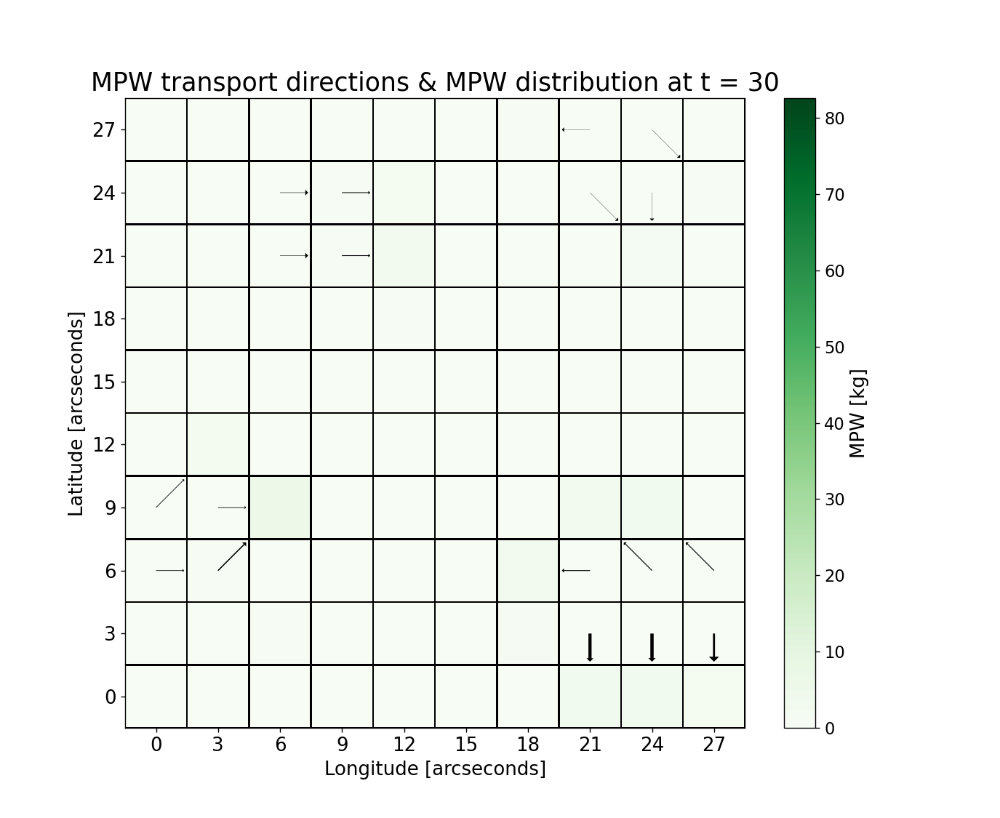

In [88]:
# Make a plot showing the MPW distribution and scaled transport arrows for a single time step: 

# Create a new figure:
plt.figure(figsize=[11,9])

t = 30

# Title for the plot:
plt.title('MPW transport directions & MPW distribution at t = %d' %(t), size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot colors that correspond to the MPW values:
c = plt.pcolormesh(x, y, p_conc_end[:,:,t], edgecolors='black', linewidths=1, vmin = 0, \
                   vmax = np.max(p_conc_end[:,:,:]), cmap = 'Greens')

# Add a color scale bar:
cbar = plt.colorbar()

# Assign labels to the color scale bar:
cbar.set_label('MPW [kg]', size = 15)
cbar.ax.tick_params(labelsize = 13)

for i in np.arange(0, n_row, 1):
    
    for j in np.arange(0, n_col, 1):
        
        if (OUT_total[i,j,t] > 0 and OUT_total[i,j,t] <= 0.05):
            
            headw = 80.0
            headl = 40.0
            heada = 40.0
            
            plt.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                       headwidth = headw, headlength = headl, headaxislength = heada, \
                       pivot = 'tail', scale = 22)
        
        if (OUT_total[i,j,t] > 0.05 and OUT_total[i,j,t] <= 0.25):
            
            headw = 20.0
            headl = 10.0
            heada = 10.0
            
            plt.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                       headwidth = headw, headlength = headl, headaxislength = heada, \
                       pivot = 'tail', scale = 22)
       
        if (OUT_total[i,j,t] > 0.25 and OUT_total[i,j,t] <= 0.50):
            
            headw = 15.0
            headl = 7.50
            heada = 7.50
            
            plt.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                       headwidth = headw, headlength = headl, headaxislength = heada, \
                       pivot = 'tail', scale = 22)
        
        if (OUT_total[i,j,t] > 0.50 and OUT_total[i,j,t] <= 2.5):
            
            headw = 5.00
            headl = 2.50
            heada = 2.50
            
            plt.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                       headwidth = headw, headlength = headl, headaxislength = heada, \
                       pivot = 'tail', scale = 22)
        
        if (OUT_total[i,j,t] > 2.5 and OUT_total[i,j,t] <= 5):
            
            headw = 2.20
            headl = 1.10
            heada = 1.10
            
            plt.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                       headwidth = headw, headlength = headl, headaxislength = heada, \
                       pivot = 'tail', scale = 22)
        
        if (OUT_total[i,j,t] > 5 and OUT_total[i,j,t] <= 12.5):
            
            headw = 1.50
            headl = 0.75
            heada = 0.75
            
            plt.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                       headwidth = headw, headlength = headl, headaxislength = heada, \
                       pivot = 'tail', scale = 22)

        if (OUT_total[i,j,t] > 12.5 and OUT_total[i,j,t] <= 15):
            
            headw = 1.10
            headl = 0.55
            heada = 0.55
            
            plt.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                       headwidth = headw, headlength = headl, headaxislength = heada, \
                       pivot = 'tail', scale = 22)
            
        if (OUT_total[i,j,t] > 15):
            
            headw = 1.05
            headl = 0.525
            heada = 0.525
            
            plt.quiver(xx[i,j], yy[i,j], TA_u[i,j,t], TA_v[i,j,t], width = w1[i,j,t], \
                       headwidth = headw, headlength = headl, headaxislength = heada, \
                       pivot = 'tail', scale = 22)


            
# Step sizes for the axes:
plt.xticks(lon_arc, size = 15)
plt.yticks(lat_arc, size = 15)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

# Show the plot:
plt.show()

In [89]:
############################################################################################################################
############################### M P W  D E V E L O P M E N T  I N  A  S I N G L E  C E L L #################################
############################################################################################################################

In [90]:
# If you want to show the temporal evolution of the MPW stock in a single grid cell:

# Choose a grid cell and provide its indices i and j (note that the southern most row in the geographical map (i.e. lat = 0)
# is stored in the data arrays at i = 0)

# Indices of the grid cell you want to see the MPW development through time for:
i_selected = 7
j_selected = 3

############################################################################################################################
Plastic_mass_in_selected_cell = np.empty(Time_span)

for t in Time:
    
    # Retrieve the MPW for the selected grid cell from the MPW end distributions array:
    Plastic_mass_in_selected_cell[t] = p_conc_end[i_selected, j_selected, t]
    
#print(Plastic_mass_in_selected_cell)

<IPython.core.display.Javascript object>


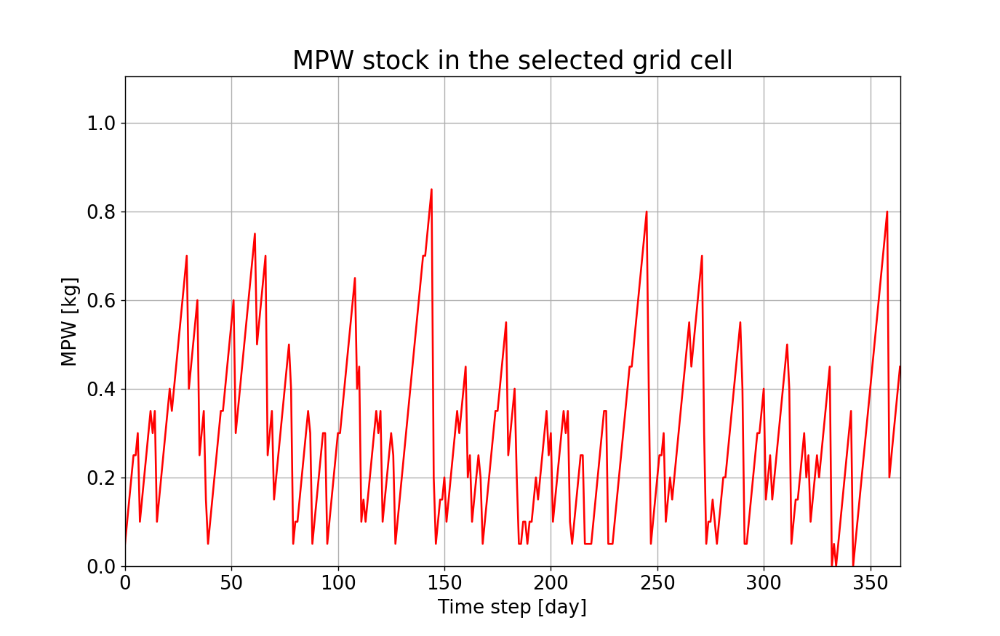

In [91]:
# Make a graph showing the MPW in the selected grid cell for each time step: 

# Create a new figure:
plt.figure(figsize=[11,7])

# Title for the plot:
plt.title("MPW stock in the selected grid cell", size = 20)

# Add grid lines:
plt.grid()

# Plot the values of the MPW through time:
plt.plot(Time, Plastic_mass_in_selected_cell, color = 'red')

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('MPW [kg]', size = 15)

# Limits of the axes:
plt.xlim([ 0, 364])
plt.ylim([0, (np.max(Plastic_mass_in_selected_cell)+0.3*np.max(Plastic_mass_in_selected_cell))]) 

# Show the plot:
plt.show()

<IPython.core.display.Javascript object>


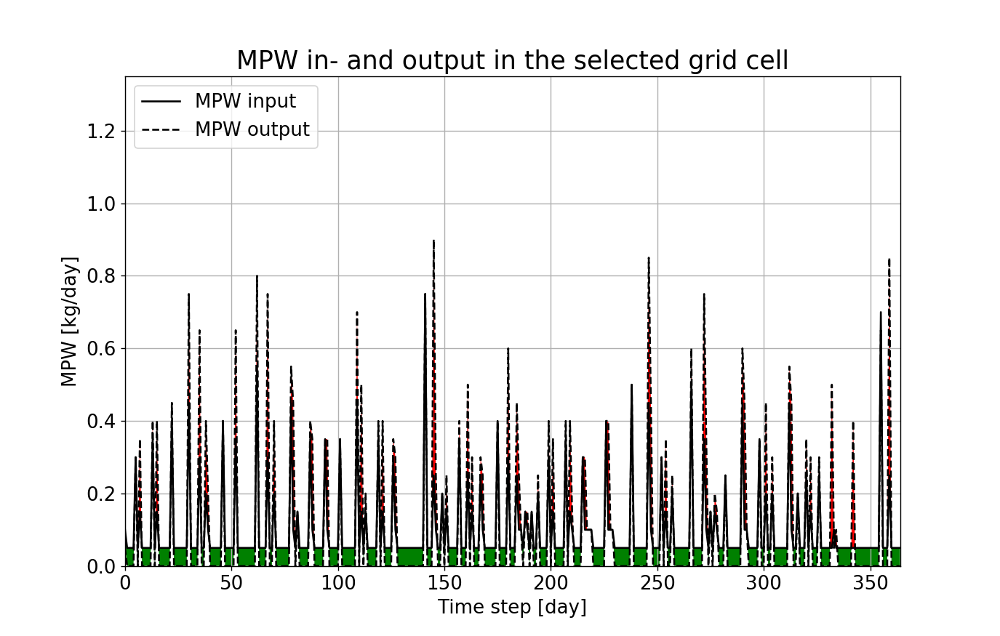

In [92]:
# Make a graph showing the MPW in- and output in the selected grid cell for each time step (or a specific time range): 

# Create a new figure:
plt.figure(figsize=[11,7])

# Title for the plot:
plt.title("MPW in- and output in the selected grid cell", size = 20)

# Add grid lines:
plt.grid()

# Plot the total MPW input:
plt.plot(Time, IN_total[i_selected, j_selected,:], color = 'black')

# Plot the total MPW output:
plt.plot(Time, OUT_total[i_selected, j_selected,:], linestyle = 'dashed', color = 'black')

# Color fill the areas between the 'IN_tot_selected_cel' line and the 'OUT_tot_selected_cell' line:
plt.fill_between(Time, IN_total[i_selected, j_selected,:], OUT_total[i_selected, j_selected,:], \
                 where = (IN_total[i_selected, j_selected,:] > OUT_total[i_selected, j_selected,:]),\
                 facecolor = 'green', interpolate = True)
plt.fill_between(Time, IN_total[i_selected, j_selected,:], OUT_total[i_selected, j_selected,:], \
                 where = (IN_total[i_selected, j_selected,:] < OUT_total[i_selected, j_selected,:]), \
                 facecolor = 'red', interpolate = True)

# Add a legend:
plt.legend(('MPW input', 'MPW output'), prop = {'size': 15}, loc = 2)

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('MPW [kg/day]', size = 15)

# Limits of the axes:
plt.xlim([0, 364])
plt.ylim([0, (np.max(OUT_total[i_selected, j_selected,:])+0.5*np.max(OUT_total[i_selected, j_selected,:]))])

# Show the plot:
plt.show()

In [93]:
############################################################################################################################
#################### C U M U L A T I V E  P L A S T I C S  I N -  &  O U T P U T  G R A P H S ##############################
############################################################################################################################

<IPython.core.display.Javascript object>


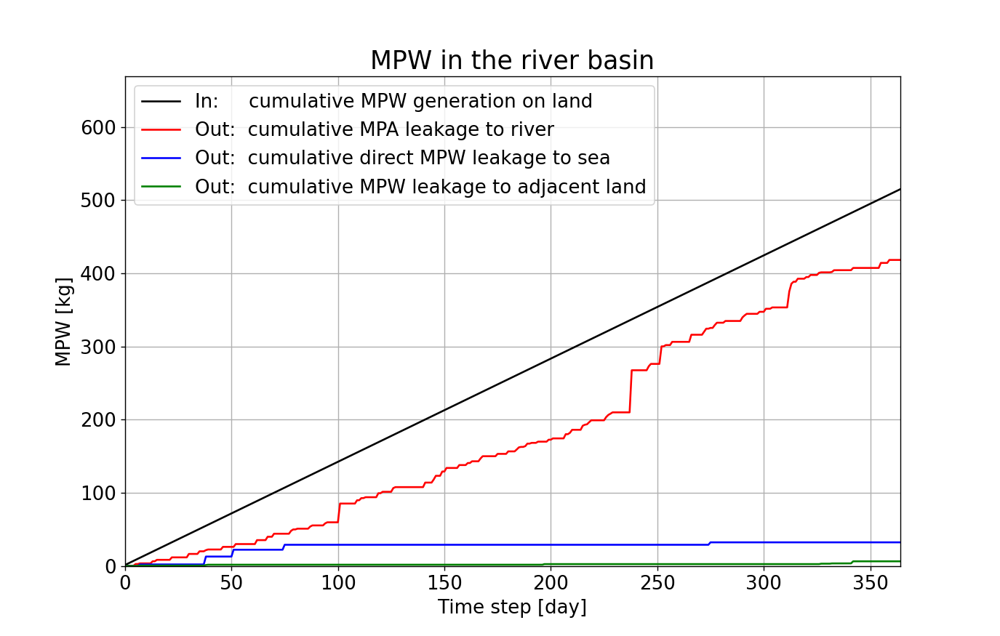

In [94]:
# Make a graph showing for each time step the (1) MPW input, the (2) direct MPW leakage to sea, the (3) leakage to adjacent 
# land, and the (4) leakage to the river: 

# Create a new figure:
plt.figure(figsize=[11,7])

# Title for the plot:
plt.title("MPW in the river basin", size = 20)

# Add grid lines:
plt.grid()

# Plot the cumulative MPW input:
plt.plot(Time, IN_cum, color = 'black')

# Plot the cumulative land-to-river MPW emissions:
plt.plot(Time, Riverine_plastic, color = 'red')

# Plot the cumulative land-to-sea MPW emissions:
plt.plot(Time, OUT_coast_cum, color = 'blue')

# Plot the cumulative land-to-land MPW emissions:
plt.plot(Time, OUT_land_cum, color = 'green')

# Add a legend:
plt.legend(('In:     cumulative MPW generation on land', 'Out:  cumulative MPA leakage to river', \
            'Out:  cumulative direct MPW leakage to sea', 'Out:  cumulative MPW leakage to adjacent land'), \
           prop = {'size': 15}, loc = 2)

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('MPW [kg]', size = 15)

# Limits of the axes:
plt.xlim([ 0, 364])
plt.ylim([0, (np.max(IN_cum)+0.3*np.max(IN_cum))])

# Show the plot:
plt.show()

In [95]:
############################################################################################################################
################################## L A N D  V S  W A T E R  P L A S T I C S  G R A P H #####################################
############################################################################################################################

<IPython.core.display.Javascript object>


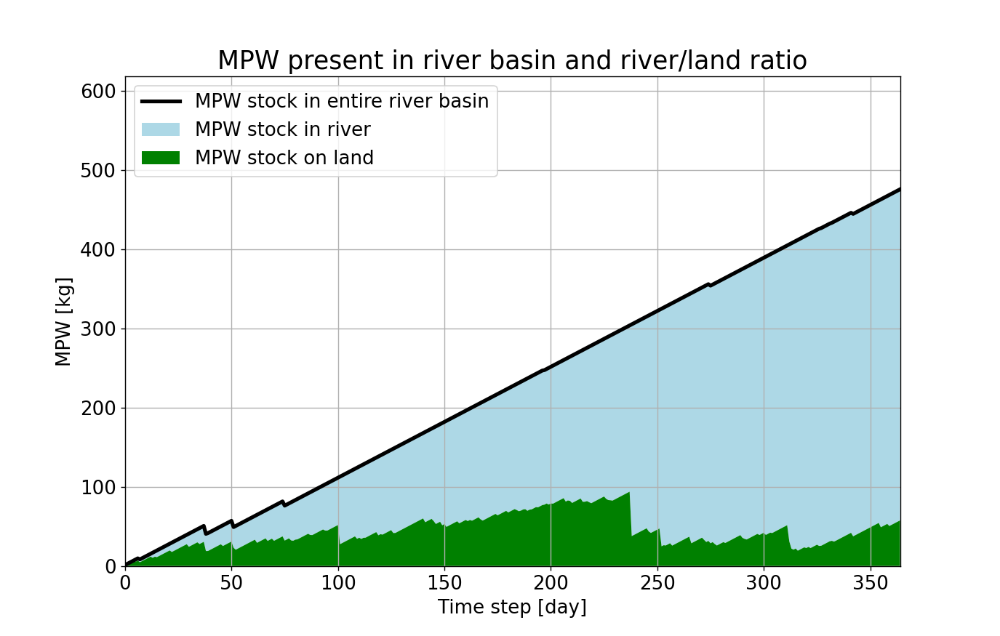

In [96]:
# Make a graph showing for each time step the MPW that is present in the river basin and which fraction is on land
# and which is in the river:

# Create a new figure:
plt.figure(figsize=[11,7])

# Title for the plot:
plt.title("MPW present in river basin and river/land ratio", size = 20)

# Plot the MPW present in entire river basin values:
plt.plot(Time, Present_in_river_basin, color = 'black', linewidth = 3)

# Add grid lines:
plt.grid()

# color fill the area between the 'MPW present in river basin' line and the 'MPW present on land' line:
plt.fill_between(Time, Present_in_river_basin, Terrestrial_plastic, facecolor ='lightblue', interpolate=True)

# Color fill the area below the 'MPW present on land' line:
plt.fill_between(Time, Terrestrial_plastic, 0, facecolor='green', interpolate=True)

# Add a legend:
plt.legend(('MPW stock in entire river basin', 'MPW stock in river', 'MPW stock on land'), prop={'size': 15}, loc = 2)

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tick_params(axis='both', which='minor', labelsize=15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('MPW [kg]', size = 15)

# Limits of the axes:
plt.xlim([ 0, 364])
plt.ylim([0, (np.max(Present_in_river_basin)+0.3*np.max(Present_in_river_basin))])

# Show the plot:
plt.show()

In [97]:
# Here we compute for each time step the fraction of the MPW that is on land: 

Percentage_MPW_on_land = np.empty(Time_range)

for t in Time:
    
    Percentage_MPW_on_land[t] = ( Terrestrial_plastic[t] / Present_in_river_basin[t] ) * 100

#print('Percentage of MPW on land for each time step:')
#print(Percentage_MPW_on_land)
#print(' ')
#print('Average percentage of MPW on land:')
#print(np.average(Percentage_MPW_on_land))
#print(' ')
#print('Variance:')
#print(np.var(Percentage_MPW_on_land))
#print(' ')
#print('Standard deviation:')
#print(np.std(Percentage_MPW_on_land))


In [98]:
############################################################################################################################
###################################### P L A S T I C  I N  T H E  R I V E R ################################################
############################################################################################################################

In [99]:
# To compute the amount of MPW that leaks into the river during each time step:

River_leakage = np.empty(Time_span)

for t in Time:
    
    if ( t == 0 ):
    
        River_leakage[t] = Riverine_plastic[0]
    
    else:
        
        River_leakage[t] = Riverine_plastic[t] - Riverine_plastic[t-1]

print('Riverine_plastic:')
print(Riverine_plastic)
print('')
print('River_leakage:')
print(River_leakage)

Riverine_plastic:
[  0.43   0.43   0.43   0.43   0.43   2.76   2.76   3.64   3.64   3.64
   3.64   3.64   3.64   6.54   6.54   8.48   8.48   8.48   8.48   8.48
   8.48   8.48  11.85  11.85  11.85  11.85  11.85  11.85  11.85  11.85
  16.55  16.55  16.55  16.55  16.55  20.14  20.14  20.14  21.7   22.61
  22.61  22.61  22.61  22.61  22.61  22.61  26.19  26.19  26.19  26.19
  26.19  26.19  30.03  30.03  30.03  30.03  30.03  30.03  30.03  30.03
  30.03  30.03  35.41  35.41  35.41  35.41  35.41  40.02  40.02  40.02
  44.15  44.15  44.15  44.15  44.15  44.15  44.15  44.15  48.13  50.
  50.    51.04  51.04  51.04  51.04  51.04  51.04  53.98  55.49  55.49
  55.49  55.49  55.49  55.49  58.25  59.76  59.76  59.76  59.76  59.76
  59.76  85.37  85.37  85.37  85.37  85.37  85.37  85.37  85.37  89.89
  89.89  92.82  92.82  94.04  94.04  94.04  94.04  94.04  94.04  99.5
  99.5  101.44 101.44 101.44 101.44 101.44 106.49 107.82 107.82 107.82
 107.82 107.82 107.82 107.82 107.82 107.82 107.82 107.82 107.8

<IPython.core.display.Javascript object>


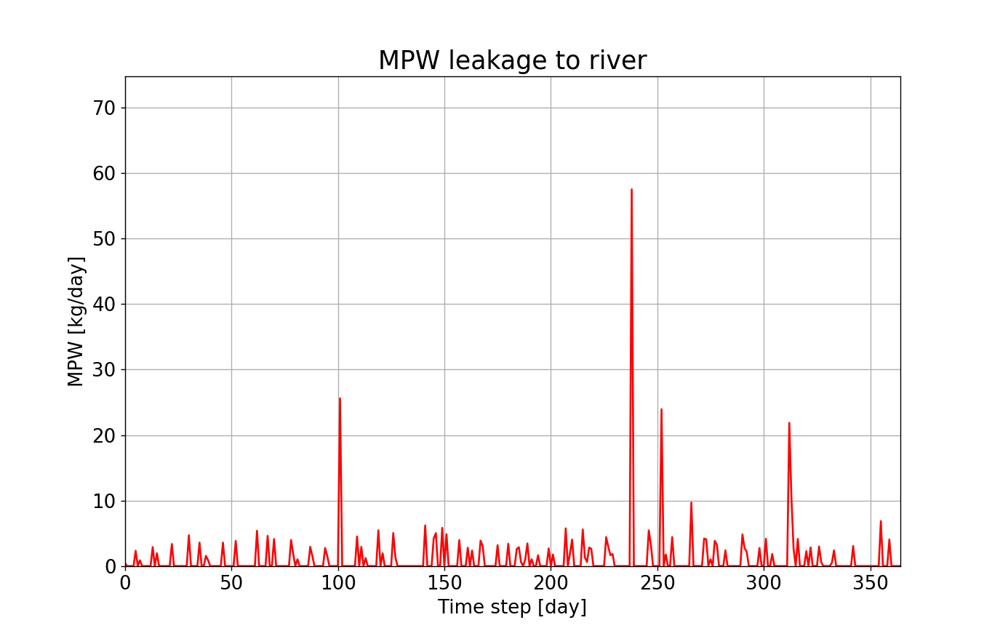

In [100]:
# Make a graph showing the MPW leakage to the river for each time step:

# Create a new figure:
plt.figure(figsize= [11,7])

# Title for the plot:
plt.title("MPW leakage to river", size = 20)

# Add grid lines:
plt.grid()

# Plot the MPW leakage to river:
plt.plot(Time, River_leakage, color = 'red')

# Size of the numbers on the axes:
plt.tick_params(axis='both', which='major', labelsize = 15)
plt.tick_params(axis='both', which='minor', labelsize = 15)

# Titels for the axes:
plt.xlabel('Time step [day]', size = 15)
plt.ylabel('MPW [kg/day]', size = 15)

# Limits of the axes:
plt.xlim([ 0, 364])
plt.ylim([0, (np.max(River_leakage)+0.3*np.max(River_leakage))])

# Show the plot:
plt.show()

In [101]:
############################################################################################################################
############################### P O T E N T I A L  T R A S H  R O U T I N G  M A P #########################################
############################################################################################################################

<IPython.core.display.Javascript object>


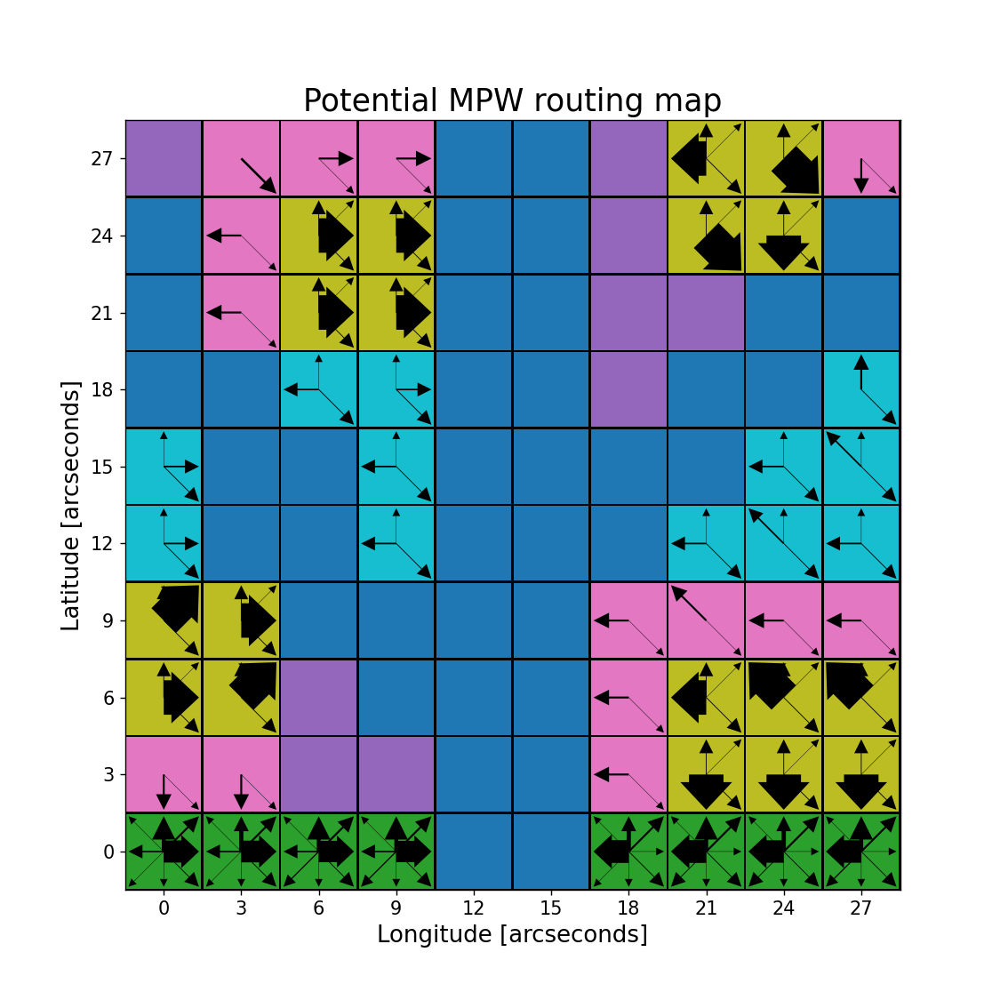

In [102]:
# Make the potential trash routing map:

# Create a new figure:
plt.figure(figsize=[9,9])

# Title for the plot:
plt.title("Potential MPW routing map", size = 20)

# Create a mesh:
xx, yy = np.meshgrid(lon_arc, lat_arc)

# Plot the mesh:
#plt.plot(xx, yy, marker='.', markersize=7, color='black', linestyle='none')

# Plot colors that correspond to the land use id's:
c = plt.pcolormesh(x, y, LU, edgecolors='black', linewidths=1, cmap = 'tab10')

# Step sizes for the axes:
plt.xticks(lon_arc, size = 12)
plt.yticks(lat_arc, size = 12)

# Titels for the axes:
plt.xlabel('Longitude [arcseconds]', size = 15)
plt.ylabel('Latitude [arcseconds]', size = 15)

#------------------------------------------------------------------------------------------------------------------------
#------------------------------------------------------------------------------------------------------------------------

for d in np.arange(0,8,1):
    
    for i in np.arange(0,n_row,1):

        for j in np.arange(0,n_col,1):
            
            if(LU[i,j] == 0):
                continue
            
            if (d == 0):
                w = (tally_dir_0_cum[i,j])
                
            elif (d == 1):
                w = (tally_dir_1_cum[i,j])

            elif (d == 2):
                w = (tally_dir_2_cum[i,j])

            elif (d == 3):
                w = (tally_dir_3_cum[i,j])

            elif (d == 4):
                w = (tally_dir_4_cum[i,j])

            elif (d == 5):
                w = (tally_dir_5_cum[i,j])

            elif (d == 6):
                w = (tally_dir_6_cum[i,j])

            else:
                w = (tally_dir_7_cum[i,j])

#--------------------------------------------------------------------------------------------------------------------------
            
            if (w <= 1):
            
                h1 = 20.0
                h2 = 20.0
    
            if (w == 2):
            
                h1 = 18.0
                h2 = 18.0    
    
            if (w == 3):
            
                h1 = 10.0
                h2 = 10.0
            
            if (w == 4):
            
                h1 = 9.0
                h2 = 9.0
                
            if (w == 5):
            
                h1 = 8.0
                h2 = 8.0
            
            if (w == 6):
            
                h1 = 7.0
                h2 = 7.0
            
            if (w >= 7 and w <= 10):
            
                h1 = 6.0
                h2 = 6.0

#------------------------------------------------------------------------------------------------------------------------
                                
            if (w >= 11 and w <= 20):
            
                h1 = 3.5
                h2 = 3.5
            
            if (w >= 21 and w <= 30):
            
                h1 = 3.5
                h2 = 3.5
            
            if (w >= 31 and w <= 40):
            
                h1 = 3.5
                h2 = 3.5
            
            if (w >= 41 and w <= 50):
            
                h1 = 1.0
                h2 = 1.5

#------------------------------------------------------------------------------------------------------------------------
             
            if (w >= 51 and w <= 60):
            
                h1 = 0.8
                h2 = 1.5
            
            if (w >= 61 and w <= 70):
            
                h1 = 0.8
                h2 = 1.5
            
            if (w >= 71 and w <= 80):
            
                h1 = 0.8
                h2 = 1.5
            
            if (w >= 81 and w <= 90):
            
                h1 = 0.8
                h2 = 1.5
            
            if (w >= 91 and w <= 100):
            
                h1 = 0.8
                h2 = 1.5

#------------------------------------------------------------------------------------------------------------------------
             
            if (w >= 101 and w <= 300):
            
                h1 = 4.0
                h2 = 3.0

#------------------------------------------------------------------------------------------------------------------------
                  
            if (w >= 301):
            
                h1 = 2.0
                h2 = 1.0
                       
#--------------------------------------------------------------------------------------------------------------------------
            
            if (d == 0):
                plt.quiver(xx[i,j], yy[i,j], dir_0_u[i,j], dir_0_v[i,j], color = 'black', pivot='tail', \
                               headaxislength = h1, headlength = h1, headwidth = h2, scale = 22, width = w/2000)
                
            elif (d == 1):
                plt.quiver(xx[i,j], yy[i,j], dir_1_u[i,j], dir_1_v[i,j], color = 'black', pivot='tail', \
                               headaxislength = h1, headlength = h1, headwidth = h2, scale = 22, width = w/2000)
                
            elif (d == 2):
                plt.quiver(xx[i,j], yy[i,j], dir_2_u[i,j], dir_2_v[i,j], color = 'black', pivot='tail', \
                               headaxislength = h1, headlength = h1, headwidth = h2, scale = 22, width = w/2000)
                
            elif (d == 3):
                plt.quiver(xx[i,j], yy[i,j], dir_3_u[i,j], dir_3_v[i,j], color = 'black', pivot='tail', \
                               headaxislength = h1, headlength = h1, headwidth = h2, scale = 22, width = w/2000)
                
            elif (d == 4):
                plt.quiver(xx[i,j], yy[i,j], dir_4_u[i,j], dir_4_v[i,j], color = 'black', pivot='tail', \
                               headaxislength = h1, headlength = h1, headwidth = h2, scale = 22, width = w/2000)
                
            elif (d == 5):
                plt.quiver(xx[i,j], yy[i,j], dir_5_u[i,j], dir_5_v[i,j], color = 'black', pivot='tail', \
                               headaxislength = h1, headlength = h1, headwidth = h2, scale = 22, width = w/2000)
                
            elif (d == 6):
                plt.quiver(xx[i,j], yy[i,j], dir_6_u[i,j], dir_6_v[i,j], color = 'black', pivot='tail', \
                               headaxislength = h1, headlength = h1, headwidth = h2, scale = 22, width = w/2000)
                
            else:
                plt.quiver(xx[i,j], yy[i,j], dir_7_u[i,j], dir_7_v[i,j], color = 'black', pivot='tail', \
                               headaxislength = h1, headlength = h1, headwidth = h2, scale = 22, width = w/2000)

#--------------------------------------------------------------------------------------------------------------------------
                
    

In [103]:
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ THE END ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~